# Análisis de Datos e Implementación de Modelos de Clasificación

Conjunto de Datos: Fraude en Seguros de Autos

Autor: Ramos García Luis Gerardo

Última Actualización: 23 de enero de 2025

Descripción:
Este notebook presenta un análisis exploratorio de datos (EDA) y la implementación de modelos de clasificación para predecir casos de fraude en seguros de autos. Se incluyen las siguientes secciones:

- Introducción al conjunto de datos y objetivos del análisis.
- Preprocesamiento y limpieza de datos.
- Análisis exploratorio de datos (EDA).
- Implementación y evaluación de modelos de clasificación.
- Conclusiones


#  Reclamos de seguros: detección de fraudes

El fraude de seguros abarca una variedad de actividades engañosas que una persona puede llevar a cabo para obtener un beneficio indebido de una compañía de seguros. Esto incluye desde la organización de incidentes falsos,cambiar los hechos,personas involucradas, la causa del incidente y la magnitud del daño causado. Este problema es particularmente grave en el ámbito de los seguros, y en este caso para las aseguradoras que gestionan pólizas de automóviles, donde las reclamaciones fraudulentas representan un costo considerable. Identificar qué reclamaciones son legítimas y cuáles son fraudulentas es crucial, ya que verificar cada reclamo de manera individual no es práctico por el alto costo en tiempo y dinero. Por lo tanto, es esencial implementar métodos efectivos para la detección de fraudes.

---
## Objetivo del proyecto



El objetivo de este proyecto es desarrollar un modelo capaz de detectar fraudes en seguros de automóviles

---
## Conjunto de datos y Diccionario


El conjunto de datos utilizado en este proyecto fue extraído de la plataforma Kaggle y está disponible en el siguiente enlace: https://www.kaggle.com/datasets/mykeysid10/insurance-claims-fraud-detection




**Poliza:**

- policy_number: El número de póliza.
- policy_bind_date: Fecha de inicio de la póliza.
- policy_state: El estado donde está registrada la póliza.
- policy_csl: Establece una cantidad total de cobertura que puede aplicarse de manera combinada tanto a daños corporales como a daños materiales resultantes de un accidente.
- policy_deductable: El monto pagado de su bolsillo por el titular de la póliza antes de que la aseguradora cubra los gastos.
- policy_annual_premium: La prima anual de la póliza.
- umbrella_limit: Es el límite máximo de una póliza de seguro adicional que cubre más allá de los límites de los seguros regulares (hogar, auto, etc.), protegiendo frente a demandas por daños a terceros o lesiones.

**Persona asegurada:**

- months_as_customer: Indica el número de meses durante los cuales el cliente ha estado asociado con la compañía de seguros.
- age: Indica la edad de la persona
- insured_zip: El código postal donde está registrada la póliza.
- insured_sex: Indica el género de la persona.
- insured_education_level: El nivel educativo más alto del titular de la póliza.
- insured_occupation: La ocupación del titular de la póliza.
- insured_hobbies: Los pasatiempos del titular de la póliza.
- insured_relationship: Dependientes del titular de la póliza.
- capital-gain: Indica las ganancias monetarias de la persona.
- capital-loss: Indica las pérdidas monetarias de la persona.

**Accidente:**
- incident_date: La fecha en la que ocurrió el incidente.
- incident_type: El tipo de incidente.
- collision_type: El tipo de colisión que tuvo lugar.
- incident_severity: La gravedad del incidente.
- authorities_contacted: Qué autoridad fue contactada.
- incident_state: El estado en el que ocurrió el incidente.
- incident_city: La ciudad en la que ocurrió el incidente.
- incident_location: La calle en la que ocurrió el incidente.
- incident_hour_of_the_day: La hora del día en que ocurrió el incidente.
- property_damage: Si hubo daños a la propiedad.
- bodily_injuries: Número de lesiones corporales.
- Witnesses: Número de testigos presentes.
- police_report_available: Si está disponible el informe policial.

**Reclamacion:**

- total_claim_amount: Monto total reclamado por el cliente.
- injury_claim: Monto reclamado por lesiones.
- property_claim: Monto reclamado por daños a la propiedad.
- vehicle_claim: Monto reclamado por daños al vehículo.
- auto_make: El fabricante del vehículo.
- auto_model: El modelo del vehículo.
- auto_year: El año de fabricación del vehículo.

**Etiqueta objetivo:** Si el reclamo es fraudulento o no.
- fraud_reported: Y (sí) o N (no).

---
## Librerias


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import plotly.express as px


import warnings
warnings.filterwarnings('ignore')

---
## Conjuntos de datos

In [2]:
df_fraudClaims = pd.read_csv('/content/fraud_insurance_claims.csv')

In [3]:
df_fraudClaims

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2014-10-17 00:00:00,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,2006-06-27 00:00:00,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,2000-09-06 00:00:00,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,1990-05-25 00:00:00,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,2014-06-06 00:00:00,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1991-07-16 00:00:00,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,2014-01-05 00:00:00,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,2003-02-17 00:00:00,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,2011-11-18 00:00:00,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


**Comentarios:** A pimera vista se observa que la columna de 'policy_bind_date' debe de ser tranformada a un tipo de dato adecuado, al igual que 'incident_date', tambien se observan datos cualitativos por ejemplo en las columnas de 'auto_make' y	'auto_model' entre otras, y se visualizan valores registrados como '?'

---

## Datos Generales


### Tamaño del conjunto de datos

In [4]:
df_fraudClaims.shape

(1000, 39)

### Columnas

In [6]:
df_fraudClaims.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

### Información de cada columna

In [7]:
df_fraudClaims.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

**Comentarios:** El tipo de dato de cada columna corresponde a los valores registrados, incluyendo columnas categóricas y numéricas.

In [8]:
print("\n-> Cantidad de nulos en cada dimension: \n")
print(df_fraudClaims.isnull().sum().sort_values(ascending=False))

print("\n-> Porcentaje de nulos en cada dimension: \n")
x = (df_fraudClaims.isnull().sum() / len(df_fraudClaims)) * 100
print(x.sort_values(ascending=False))


-> Cantidad de nulos en cada dimension: 

authorities_contacted          91
witnesses                       0
incident_state                  0
incident_city                   0
incident_location               0
incident_hour_of_the_day        0
number_of_vehicles_involved     0
property_damage                 0
bodily_injuries                 0
months_as_customer              0
incident_severity               0
total_claim_amount              0
injury_claim                    0
property_claim                  0
vehicle_claim                   0
auto_make                       0
auto_model                      0
auto_year                       0
police_report_available         0
collision_type                  0
age                             0
insured_zip                     0
policy_number                   0
policy_bind_date                0
policy_state                    0
policy_csl                      0
policy_deductable               0
policy_annual_premium           0
umbre

**Comentarios:** Únicamente la columna authorities_contacted presenta valores nulos, con un 9.1% de datos faltantes, lo que equivale a un total de 91 valores en total. Se realizará un análisis detallado para identificar la mejor manera de abordar estos valores y determinar una posible solución

### Valores unicos en cada columna

In [9]:
def obtener_datos_unicos(df):

    datos_unicos = {
        'Tipo de Dato': [],
        'Cantidad de Valores Únicos': [],
        'Valores Únicos': []
    }

    for column in df.columns:
        valores_unicos = df[column].unique()
        datos_unicos['Tipo de Dato'].append(df[column].dtype)
        datos_unicos['Cantidad de Valores Únicos'].append(len(valores_unicos))
        datos_unicos['Valores Únicos'].append(valores_unicos)

    df_datos_unicos = pd.DataFrame(datos_unicos, index=df.columns)


    return df_datos_unicos


In [10]:
df_datos_unicos = obtener_datos_unicos(df_fraudClaims)
df_datos_unicos

,Tipo de Dato,Cantidad de Valores Únicos,Valores Únicos
months_as_customer,int64,391,"[328, 228, 134, 256, 137, 165, 27, 212, 235, 4..."
age,int64,46,"[48, 42, 29, 41, 44, 39, 34, 37, 33, 61, 23, 3..."
policy_number,int64,1000,"[521585, 342868, 687698, 227811, 367455, 10459..."
policy_bind_date,object,951,"[2014-10-17 00:00:00, 2006-06-27 00:00:00, 200..."
policy_state,object,3,"[OH, IN, IL]"
policy_csl,object,3,"[250/500, 100/300, 500/1000]"
policy_deductable,int64,3,"[1000, 2000, 500]"
policy_annual_premium,float64,991,"[1406.91, 1197.22, 1413.14, 1415.74, 1583.91, ..."
umbrella_limit,int64,11,"[0, 5000000, 6000000, 4000000, 3000000, 800000..."
insured_zip,int64,995,"[466132, 468176, 430632, 608117, 610706, 47845..."


**Comentarios:**

El conjunto de datos cuenta con un total de 1000 registros. Por ello, las siguientes columnas:

- policy_number
- policy_bind_date
- policy_annual_premium
- insured_zip
- incident_location

se consideran metadatos relacionados con el registro del accidente, ya que contienen la misma cantidad de valores únicos que el total de registros. Dado que no aportan información relevante para este análisis, se eliminarán del conjunto de datos.

In [11]:
df_fraudClaims.drop(['policy_number', 'policy_bind_date', 'policy_annual_premium', 'insured_zip', 'incident_location'], axis=1, inplace=True)

**Comentarios:**

En las columnas:

- collision_type
- property_damage
- police_report_available

se observan valores registrados como '?'. Se realizará un análisis detallado para identificar la mejor manera de abordar estos valores y determinar una posible solución

### Separacion de variables por su tipo de dato

In [12]:
numericas = df_fraudClaims.select_dtypes(include=['int64', 'float64']).columns.tolist()
categoricas = df_fraudClaims.select_dtypes(include=['object']).columns.tolist()

**Comentarios:**

Se considera las siguientes columnas como categoricas, debido a la naturaleza discreta de sus valores (por ejemplo, no existen '1.3 testigos').:

- number_of_vehicles_involved
- bodily_injuries
- witnesses
- auto_year


In [13]:
categoricas_adicionales = ['number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'auto_year']

#Se eliminan de la seccion de numericas
numericas = [col for col in numericas if col not in categoricas_adicionales]

#Se agregan a la seccion de categoricas
categoricas += categoricas_adicionales

print("Columnas numéricas:", numericas)
print("Columnas categóricas:", categoricas)

Columnas numéricas: ['months_as_customer', 'age', 'policy_deductable', 'umbrella_limit', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']
Columnas categóricas: ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'auto_year']


### Estadisticas (variables numericas)

In [14]:
df_fraudClaims[numericas].describe()


,months_as_customer,age,policy_deductable,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,total_claim_amount,injury_claim,property_claim,vehicle_claim
count,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1.101000e+06,25126.100000,-26793.700000,11.644000,52761.94000,7433.420000,7399.570000,37928.950000
std,115.113174,9.140287,611.864673,2.297407e+06,27872.187708,28104.096686,6.951373,26401.53319,4880.951853,4824.726179,18886.252893
min,0.000000,19.000000,500.000000,-1.000000e+06,0.000000,-111100.000000,0.000000,100.00000,0.000000,0.000000,70.000000
25%,115.750000,32.000000,500.000000,0.000000e+00,0.000000,-51500.000000,6.000000,41812.50000,4295.000000,4445.000000,30292.500000
50%,199.500000,38.000000,1000.000000,0.000000e+00,0.000000,-23250.000000,12.000000,58055.00000,6775.000000,6750.000000,42100.000000
75%,276.250000,44.000000,2000.000000,0.000000e+00,51025.000000,0.000000,17.000000,70592.50000,11305.000000,10885.000000,50822.500000
max,479.000000,64.000000,2000.000000,1.000000e+07,100500.000000,0.000000,23.000000,114920.00000,21450.000000,23670.000000,79560.000000


**Comentarios:**

La media como cliente es de 115.75 meses, con un rango minimo de 0 meses, lo cual es importante ya que se tiene que ver la frecuecnia de como se comportan los nuevos clientes ante la reclamacion de un accidente.

La media de edad es de los clientes 38.94 con una desviacion estandar de 9.14 y desde el 25% de los datos, nos muestran que la mayoria estan arriba de 32 años.

Respecto a los montos de las reclamaciones, se observa una alta variabilidad, con un rango que va desde 0.00 hasta 23,670. Esta amplia dispersión sugiere la existencia de diferentes tipos de incidentes y niveles de daños

Se nota algo inusual en la variable de 'umbrella_limit' ya que su minimo es un valor negativo.

Se presentan escalas diferentes, lo cual puede considerarse algun tipo de estandarizacion

### Moda (variables categoricas)

In [15]:
def Estadisticas(df):
    frecuencias = {}
    for col in df.columns:
        frecuencias[col] = {
            "frecuencia_absoluta": df[col].value_counts(),
            "frecuencia_relativa": df[col].value_counts(normalize=True)
        }

    modas = df.mode().iloc[0]

    resultados = []
    for col in frecuencias:
        resultados.append({
            "Variable": col,
            "Moda": modas[col]
        })
    return resultados

In [16]:
Estadisticas(df_fraudClaims[categoricas])

[{'Variable': 'policy_state', 'Moda': 'OH'},
 {'Variable': 'policy_csl', 'Moda': '250/500'},
 {'Variable': 'insured_sex', 'Moda': 'FEMALE'},
 {'Variable': 'insured_education_level', 'Moda': 'JD'},
 {'Variable': 'insured_occupation', 'Moda': 'machine-op-inspct'},
 {'Variable': 'insured_hobbies', 'Moda': 'reading'},
 {'Variable': 'insured_relationship', 'Moda': 'own-child'},
 {'Variable': 'incident_date', 'Moda': '2015-02-02 00:00:00'},
 {'Variable': 'incident_type', 'Moda': 'Multi-vehicle Collision'},
 {'Variable': 'collision_type', 'Moda': 'Rear Collision'},
 {'Variable': 'incident_severity', 'Moda': 'Minor Damage'},
 {'Variable': 'authorities_contacted', 'Moda': 'Police'},
 {'Variable': 'incident_state', 'Moda': 'NY'},
 {'Variable': 'incident_city', 'Moda': 'Springfield'},
 {'Variable': 'property_damage', 'Moda': '?'},
 {'Variable': 'police_report_available', 'Moda': '?'},
 {'Variable': 'auto_make', 'Moda': 'Dodge'},
 {'Variable': 'auto_model', 'Moda': 'RAM'},
 {'Variable': 'fraud_rep

**Comentarios:** Se observa que alguna de la modas en el conjunto de datos son asegurados mujeres,vehículos Dodge RAM, modelos antiguos, están involucrados en accidentes de menor gravedad, principalmente colisiones por alcance y que el dia con mas accidentes es de 2015,2,2.

Se vuelven a estar presentes los valores de '?'

### Tranformación de datos

#### Para columna 'incident_date'

**Comentarios:** Se observo que la columna de 'incident_date' esta como formato 2015-01-25 00:00:00 lo cual se transformara a un formato 2015-01-25, ademas, se va a separar el dia, mes y años para un mejor tratamiento

In [17]:
df_fraudClaims['incident_date'] = pd.to_datetime(df_fraudClaims['incident_date'])

print(df_fraudClaims['incident_date'])

0     2015-01-25
1     2015-01-21
2     2015-02-22
3     2015-01-10
4     2015-02-17
         ...    
995   2015-02-22
996   2015-01-24
997   2015-01-23
998   2015-02-26
999   2015-02-26
Name: incident_date, Length: 1000, dtype: datetime64[ns]


In [18]:
# Crear un nuevo DataFrame con las columnas de día, mes y año
df_fecha = pd.DataFrame({
    'day': df_fraudClaims['incident_date'].dt.day,
    'month': df_fraudClaims['incident_date'].dt.month,
    'year': df_fraudClaims['incident_date'].dt.year
})

df_fecha

,day,month,year
0,25,1,2015
1,21,1,2015
2,22,2,2015
3,10,1,2015
4,17,2,2015
...,...,...,...
995,22,2,2015
996,24,1,2015
997,23,1,2015
998,26,2,2015


In [19]:
df_fraudClaims.drop(['incident_date'], axis=1, inplace=True)


In [20]:
df_fraudClaims = pd.concat([df_fraudClaims, df_fecha], axis=1)

In [21]:
categoricas += ['day', 'month', 'year']
categoricas.remove('incident_date')
print("Columnas categóricas:", categoricas)

Columnas categóricas: ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'auto_year', 'day', 'month', 'year']


#### Para columna 'umbrella_limit'

In [ ]:
umbrella_counts = df_fraudClaims['umbrella_limit'].value_counts()
umbrella_counts

,count
umbrella_limit,
0,798
6000000,57
5000000,46
4000000,39
7000000,29
3000000,12
8000000,8
9000000,5
2000000,3


In [ ]:
# Filtrar por un valor específico
valor_especifico_1 = 10000000
valor_especifico_2 = -1000000

df_filtrado = df_fraudClaims[(df_fraudClaims['umbrella_limit'] == valor_especifico_1) |
                             (df_fraudClaims['umbrella_limit'] == valor_especifico_2)]

df_filtrado.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,day,month,year
115,258,46,IN,100/300,1000,10000000,MALE,MD,machine-op-inspct,hiking,...,4770,9540,33390,Accura,MDX,1997,Y,24,1,2015
290,284,42,OH,100/300,500,-1000000,MALE,Associate,machine-op-inspct,kayaking,...,8560,17120,68480,Chevrolet,Malibu,1996,N,29,1,2015
430,264,47,IN,250/500,2000,10000000,FEMALE,JD,transport-moving,sleeping,...,5670,5670,51030,Dodge,Neon,2001,N,12,2,2015


In [ ]:
df_fraudClaims.at[290, 'umbrella_limit'] = 10000000

**Comentarios:**

Solo se encuentra un solo registro con el valor -1000000, se compara con el dato simmilar 10000000 y se observa que tiene tienen la misma poliza, lo cual se hizo un cambio

---
## Cantidad de fraudes y no fraudes

In [22]:
print(df_fraudClaims['fraud_reported'].value_counts())

fraud_reported
N    753
Y    247
Name: count, dtype: int64


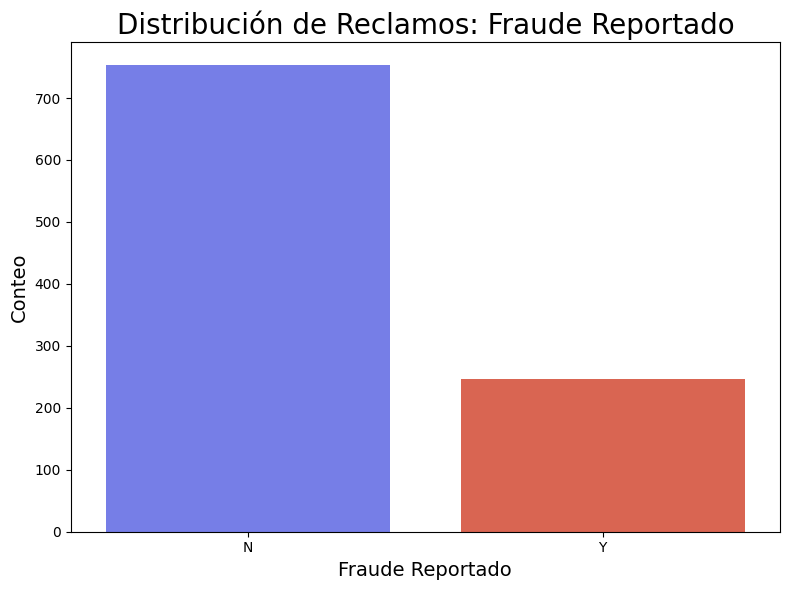

In [23]:
# Contar los valores para la columna 'fraud_reported'
counts = df_fraudClaims['fraud_reported'].value_counts()

# Crear el gráfico de barras
plt.figure(figsize=(8, 6))
sns.barplot(x=counts.index, y=counts.values, palette=["#636EFA", "#EF553B"])


plt.title('Distribución de Reclamos: Fraude Reportado', fontsize=20, ha='center')
plt.xlabel('Fraude Reportado', fontsize=14)
plt.ylabel('Conteo', fontsize=14)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


**Comentarios:** Se cuenta con un desbalanceo de clases, en donde de los 1000 registros de relamaciones solo 247 fueron fraudes y el resto no fraude, se puede considerar alguna tecnia de desbalalanceo

---
## Graficos descriptivos

#### Codigo boxplot

In [ ]:
def boxplot(df, numericas, target_variable):
    # Obtener el número de categorías en la variable target
    num_categories = df[target_variable].nunique()

    # Crear una paleta de colores pastel dinámica según el número de categorías
    pastel_colors = px.colors.qualitative.Pastel

    # Iterar sobre cada columna numérica
    for col in numericas:
        # Crear el gráfico de caja interactivo
        fig = px.box(df,
                     x=target_variable,
                     y=col,
                     color=target_variable,
                     boxmode='group',  # Agrupa las cajas por categoría
                     title=f'Comparación de {col} con {target_variable}',
                     labels={target_variable: target_variable, col: col},
                     color_discrete_sequence=pastel_colors)

        fig.update_layout(
            xaxis_title=target_variable,
            yaxis_title=col,
            title_font_size=16,
            title_x=0.5,
            title_y=0.95,
            showlegend=False  # No mostrar la leyenda
        )

        fig.show()

In [24]:

def boxplot(df, numericas, target_variable):
    # Paleta de colores
    pastel_colors = sns.color_palette("pastel", n_colors=df[target_variable].nunique())

    for col in numericas:
        # Crear el gráfico de caja (boxplot)
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=target_variable, y=col, data=df, palette=pastel_colors)

        plt.title(f'Comparación de {col} con {target_variable}', fontsize=16, ha='center')
        plt.xlabel(target_variable, fontsize=14)
        plt.ylabel(col, fontsize=14)

        plt.tight_layout()
        plt.show()


#### Boxplot de varibles numericas con target

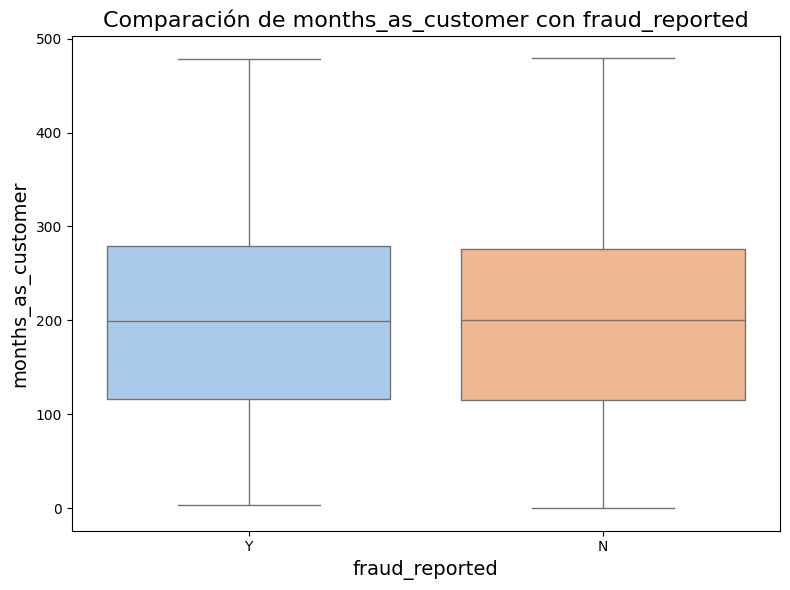

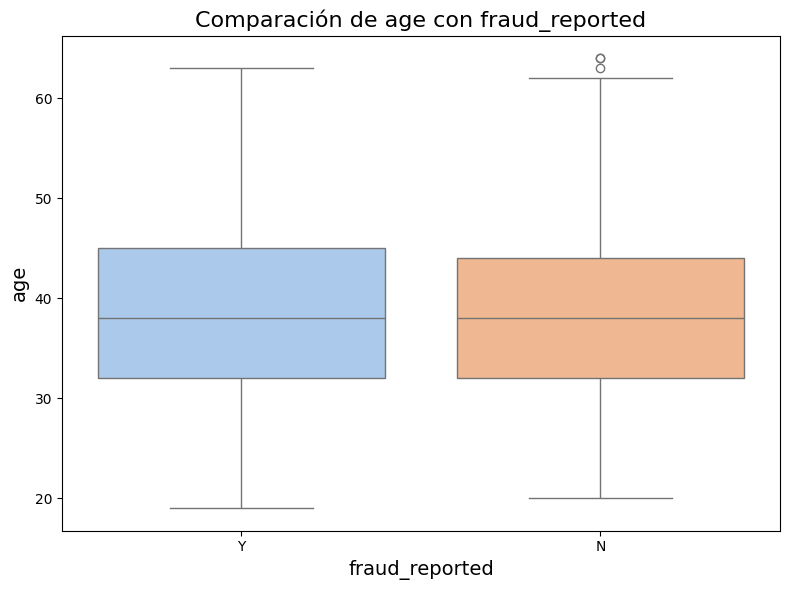

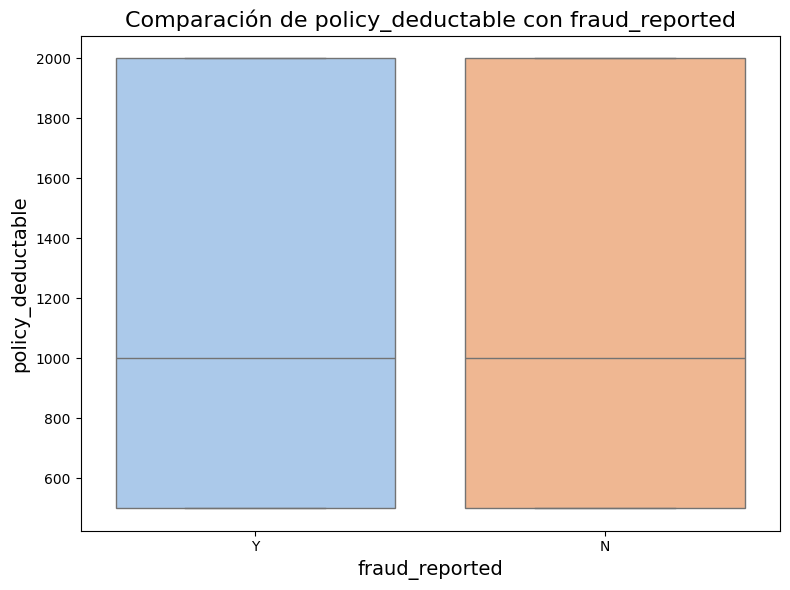

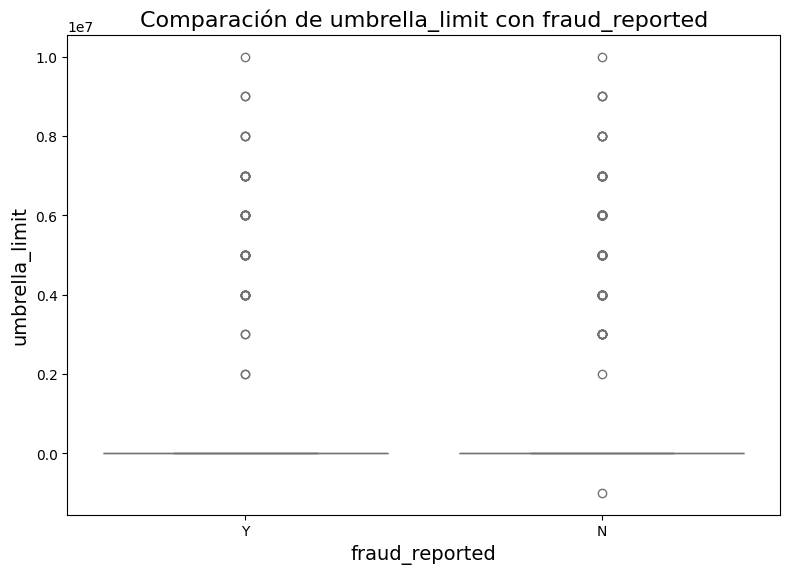

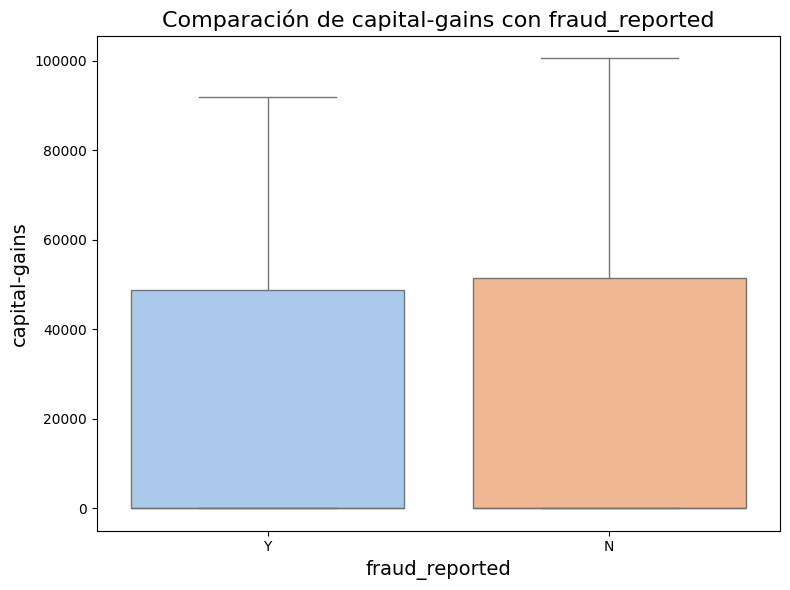

...

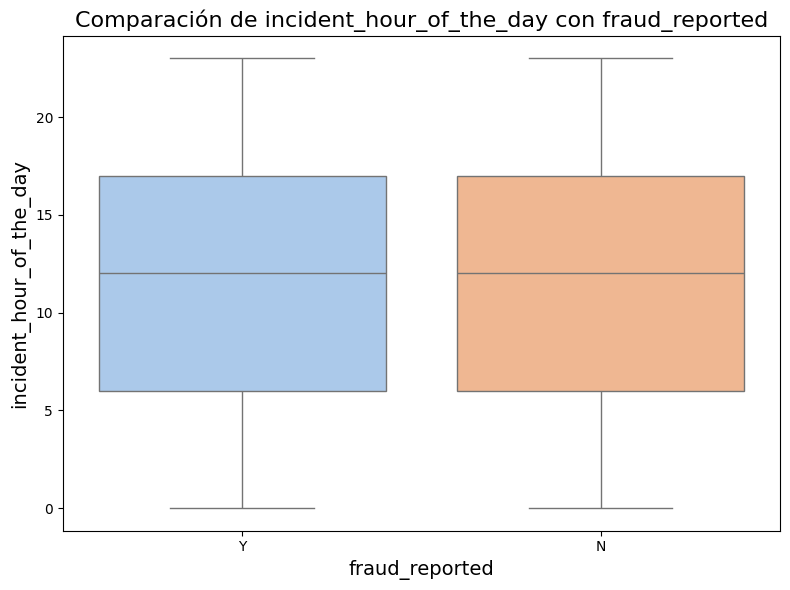

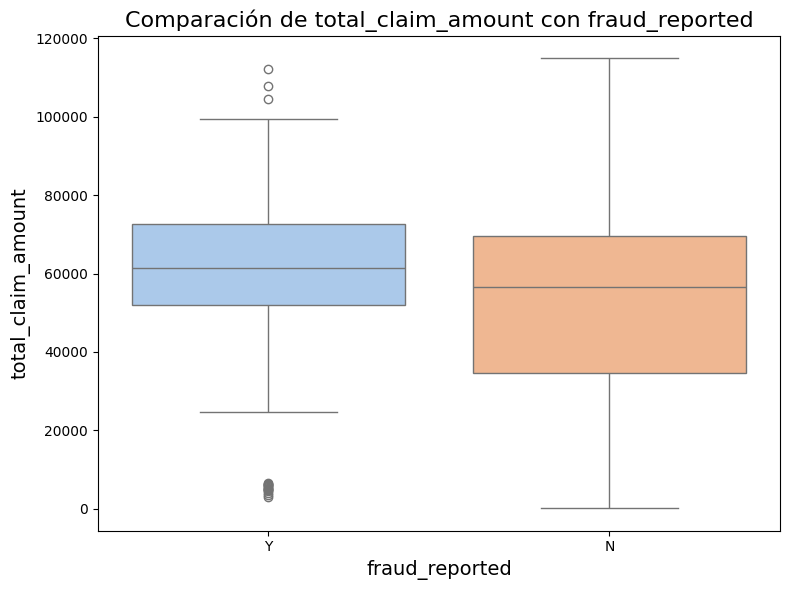

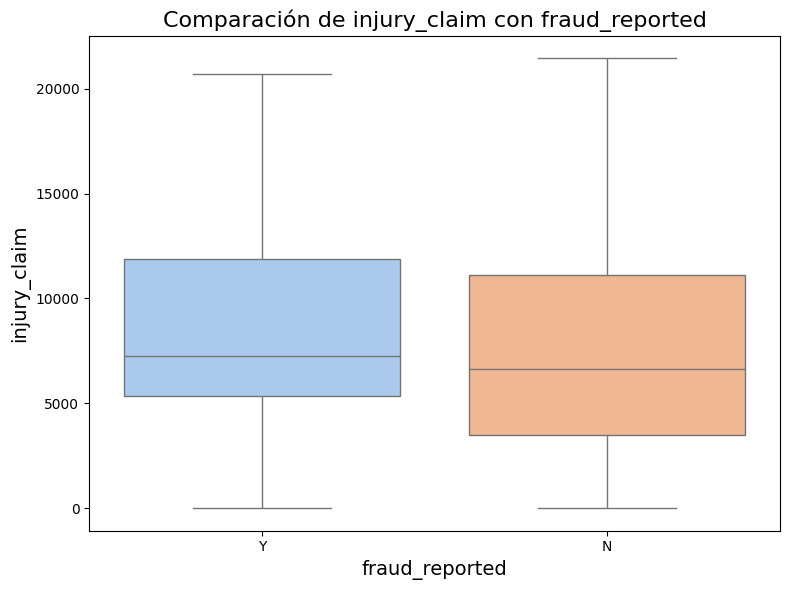

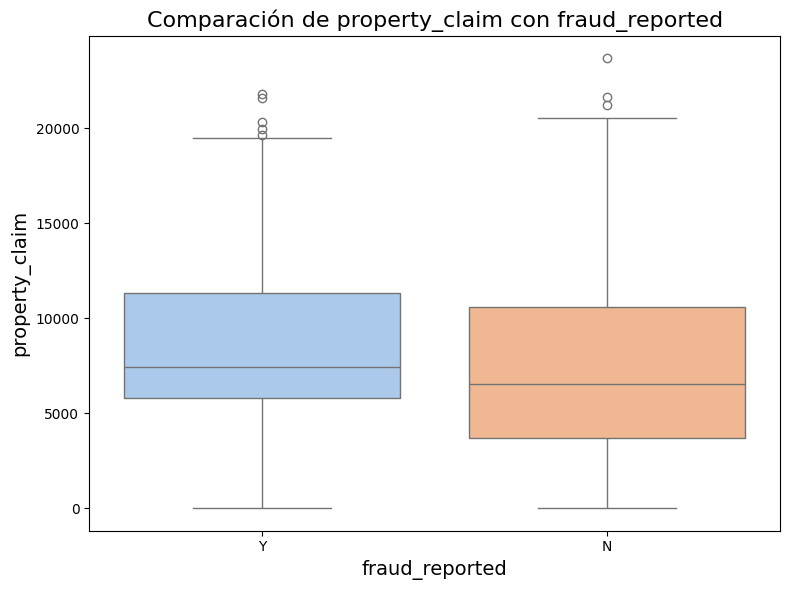

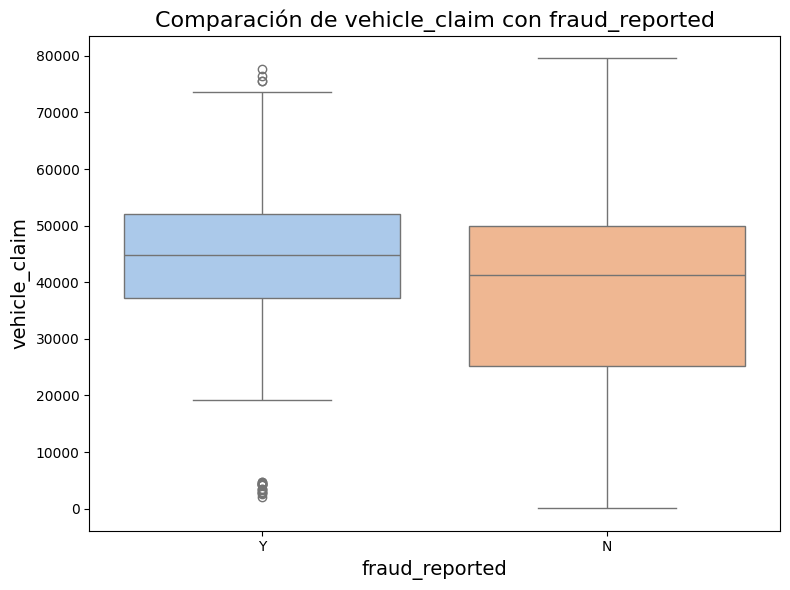

In [25]:
boxplot(df_fraudClaims, numericas, 'fraud_reported')

**Comentarios:**

La mayoria de las columnas numericas se comportan casi de la misma manera tanto si fue o no fraude, por ejemplo, en la comparativa de total_claim_amount con fraude_report, cambia ligeramente ademas de observar datos atipicos en la target de 'yes', pasa lo mismo con vehicle_claim.

En 'umbrella_limit' observamos que la mayoria de resgistros estan presentes en el valor 0.

#### Pairplot de variables numericas

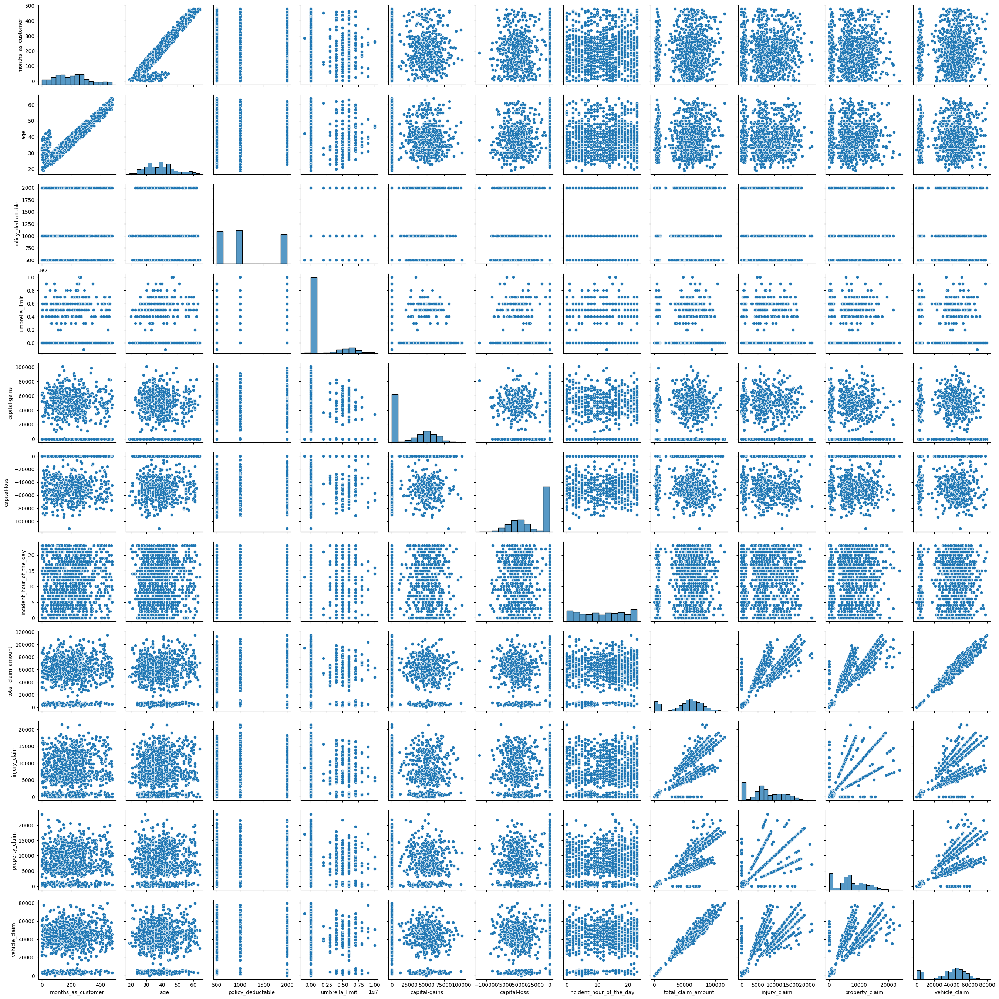

In [27]:
sns.pairplot(df_fraudClaims[numericas])
plt.show()

**Comentarios:**

Se observa una clara separación en los datos correspondientes a las variables del monto de reclamación. Específicamente, algunos valores están concentrados cerca de cero. Ademas, se identifica un conjunto de datos disperso en el centro, pero también es notable la presencia de otro grupo de datos claramente separable. Además, se aprecia cierta relación lineal entre estas columnas.
Respecto a las distribuciones, las cuales se encuentran en en la diagonal del graifico, se observa una cierta distribucion normal a excepcion de los valores cercanos a 0

#### Codigo grafica de barras

In [ ]:
def countplot(df, categoricas, target_variable):
    # Obtener el número de categorías en la variable target
    num_categories = df[target_variable].nunique()

    # Utilizar la paleta de colores pastel
    pastel_colors = px.colors.qualitative.Pastel

    # Iterar sobre cada columna categórica
    for col in categoricas:
        # Crear el gráfico de barras interactivo
        fig = px.histogram(df,
                           x=col,
                           color=target_variable,
                           barmode='group',
                           title=f'Frecuencia de {col} por {target_variable}',
                           labels={col: col, target_variable: target_variable},
                           color_discrete_sequence=pastel_colors)

        fig.update_layout(
            xaxis_title=col,
            yaxis_title='Frecuencia',
            title_font_size=16,
            title_x=0.5,
            title_y=0.95,
            showlegend=True,
            xaxis_tickangle=-45  # Rotar las etiquetas en el eje X
        )

        fig.show()


In [28]:

def countplot(df, categoricas, target_variable):
    # Paleta de colores
    pastel_colors = sns.color_palette("pastel", n_colors=df[target_variable].nunique())

    # Iterar sobre cada columna categórica
    for col in categoricas:
        plt.figure(figsize=(8, 6))

        # Crear el gráfico de barras
        sns.countplot(x=col, hue=target_variable, data=df, palette=pastel_colors)


        plt.title(f'Frecuencia de {col} por {target_variable}', fontsize=16, ha='center')
        plt.xlabel(col, fontsize=14)
        plt.ylabel('Frecuencia', fontsize=14)

        plt.xticks(rotation=-45)

        plt.tight_layout()
        plt.show()


#### Gráfica de barras con target

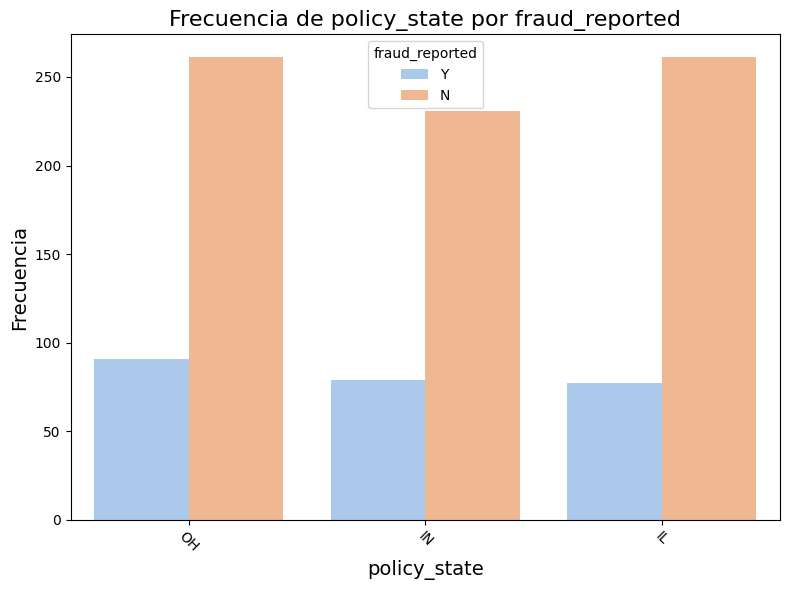

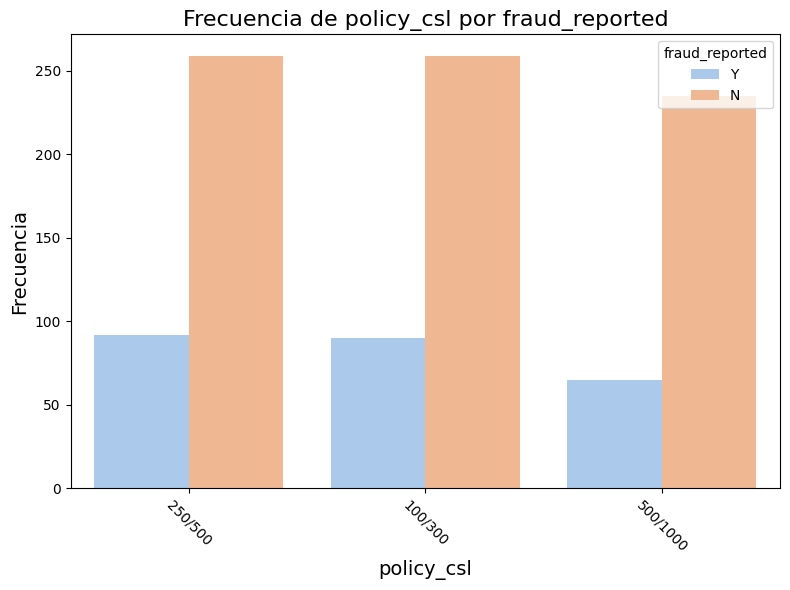

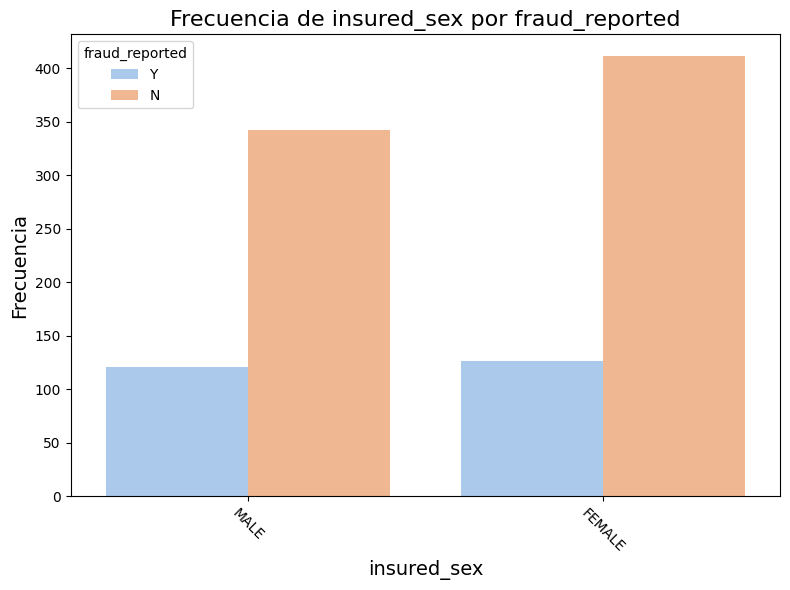

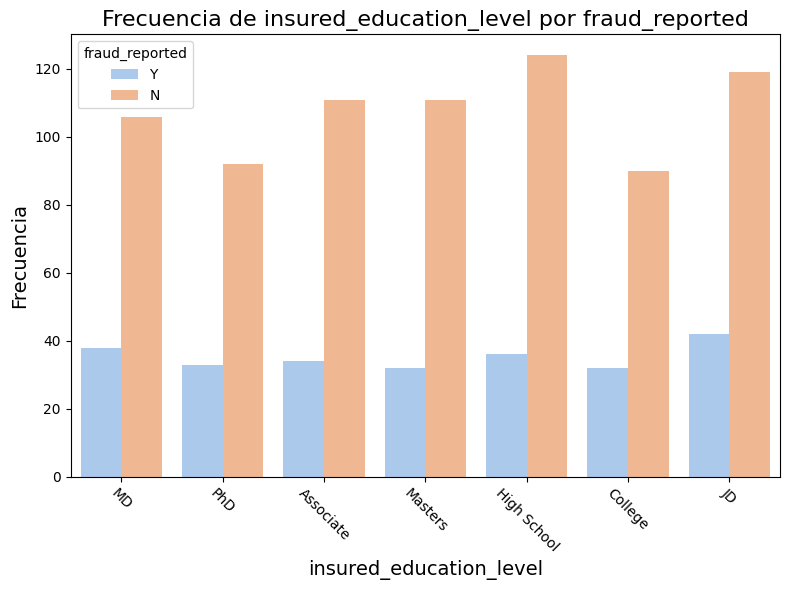

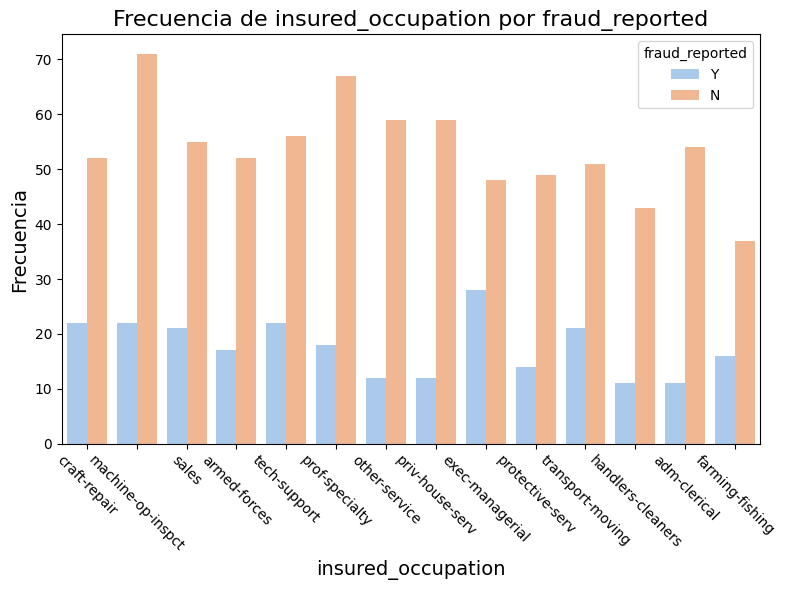

...

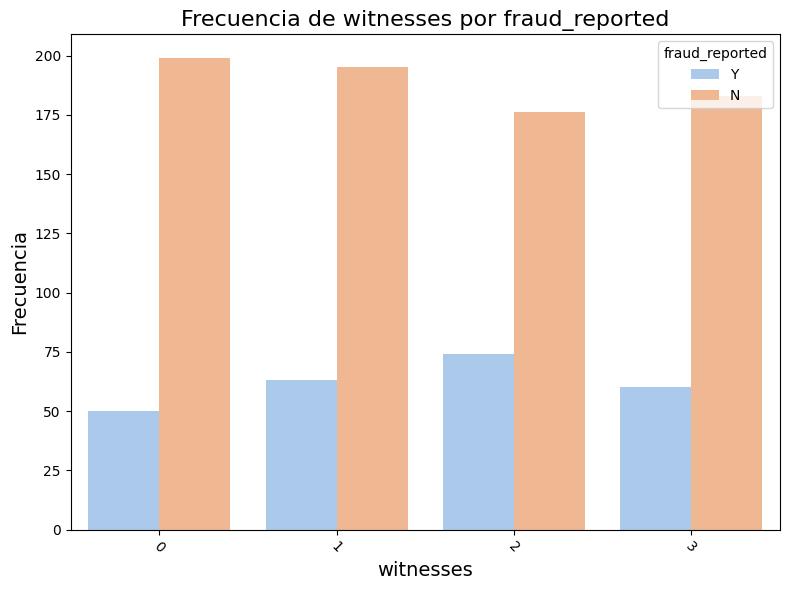

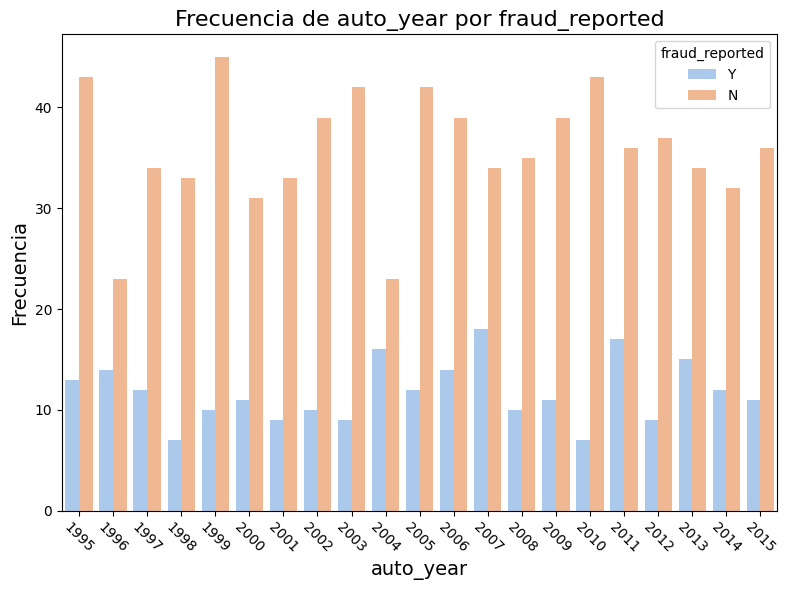

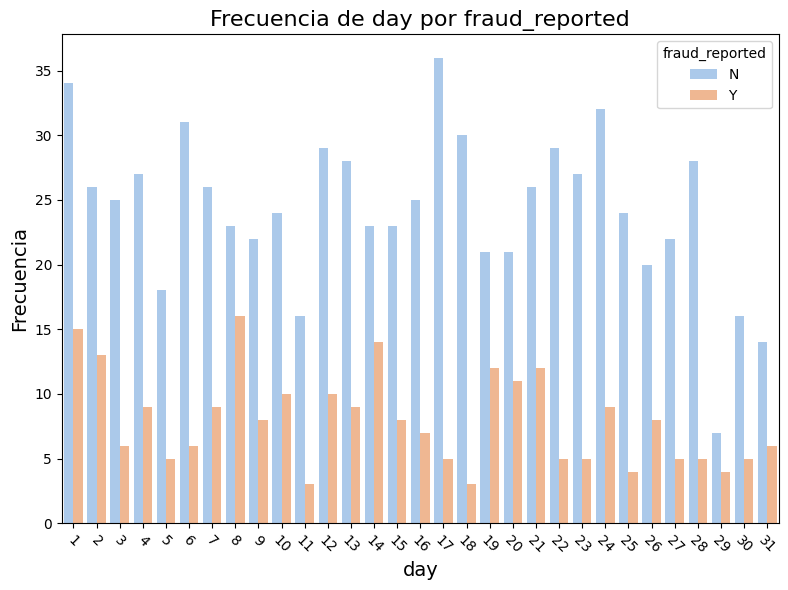

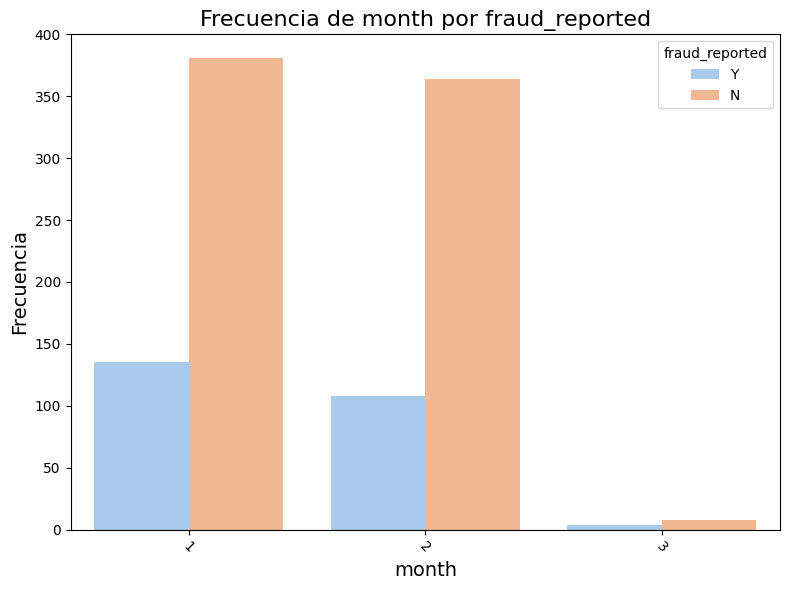

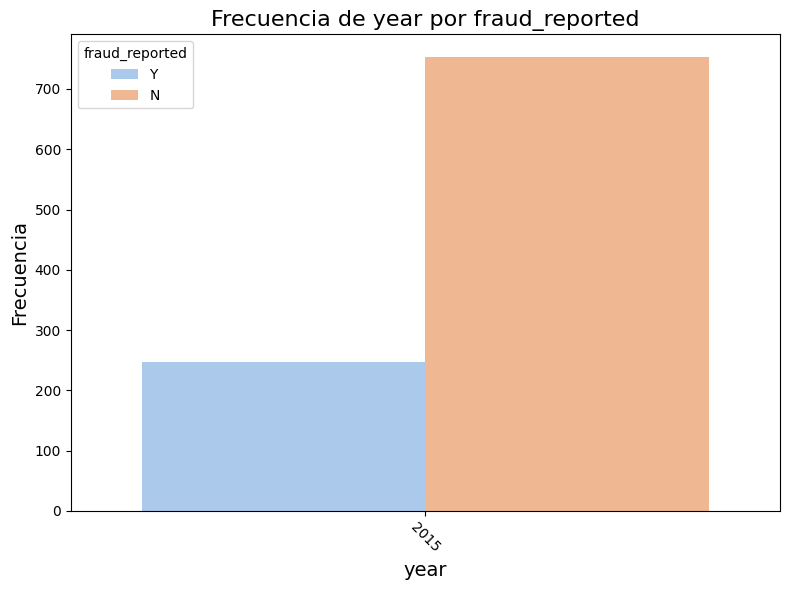

In [29]:
countplot(df_fraudClaims, categoricas, 'fraud_reported')


**Comentarios:**

Se observa que los hobbies de lectura, ajedrez y crossfit registraron un mayor número de reclamaciones fraudulentas, mientras que en el tipo de accidente, las colisiones de un solo vehículo y de múltiples vehículos fueron las más asociadas con fraudes. Asimismo, los casos con daño mayor en la gravedad del accidente y los estados de Carolina del Sur (SC) y Virginia Occidental (WV) destacaron con más reclamaciones fraudulentas. En cuanto a los modelos de auto, los vehículos RAM y A5 lideraron en este aspecto, y los casos con 1 o 3 testigos también mostraron un patrón notable de fraude. Además, los años 2004, 2007 y 2011 del modelo del carro presentaron el mayor número de reclamaciones fraudulentas. Por otro lado, las demás columnas no mostraron cambios significativos.

Se va a remover del conjutno de datos las columnas de dia, mes y año, ya que los registros son solo de los primeros 3 meses y del años 2015

Ademas, los valores de '?' se hicieron presentes en variables columnas, lo cual se analizara a detalle


In [30]:
df_fraudClaims.drop(['day', 'month', 'year'], axis=1, inplace=True)


In [31]:
categoricas.remove('day')
categoricas.remove('month')
categoricas.remove('year')

---
## Correlacion de variables numericas

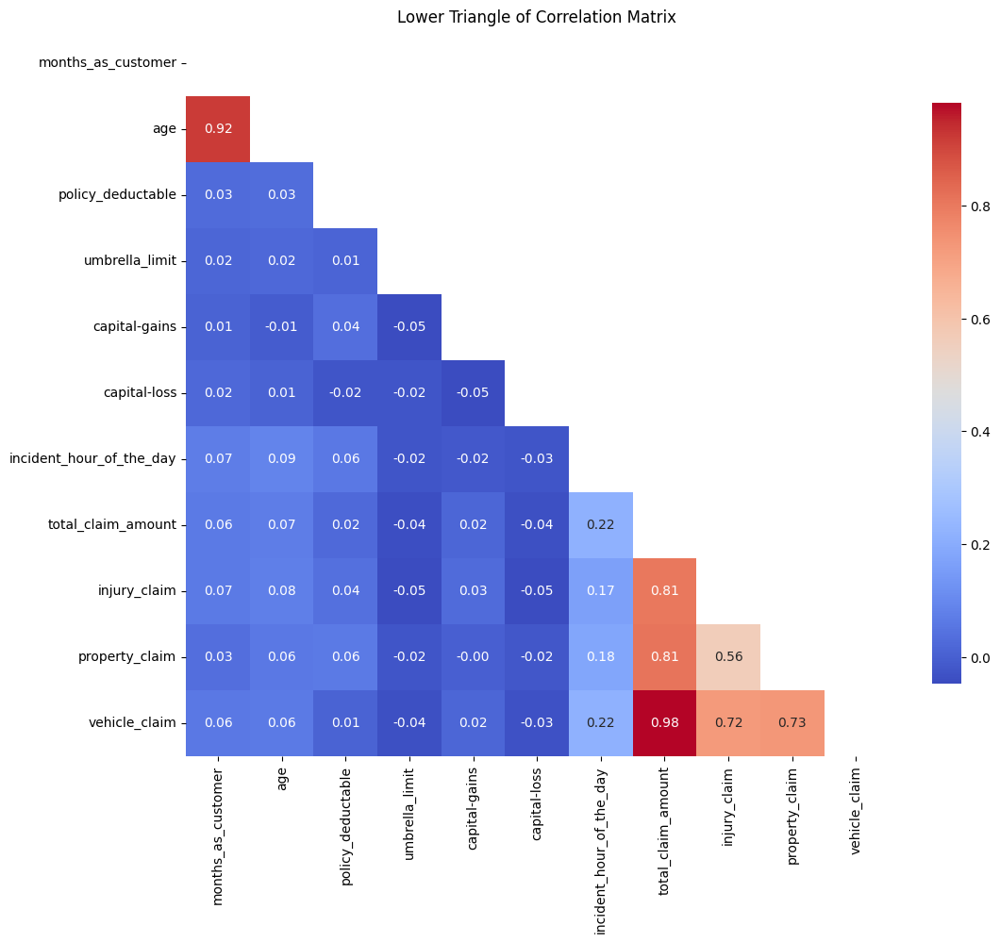

In [32]:
# Calcular la matriz de correlación
correlation_matrix = df_fraudClaims[numericas].corr()

# Crear una máscara para la mitad superior
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Configurar el gráfico de calor con la máscara
plt.figure(figsize=(12, 10))
sns.heatmap(
    correlation_matrix,
    mask=mask,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    cbar_kws={"shrink": 0.8}
)
plt.title('Lower Triangle of Correlation Matrix')
plt.show()


**Observaciones:** La variables de 'months_as_customer' y 'age' estan altamente correlacionadas con un 0.92, lo cual se decide eliminar una de ellas para evitar multicolinealidad. Ademas, la columna de 'total_claim_amount' esta altamente relacionado con 'vehicle_claim', 'injury_claim' y 'property_claim', ya que dicha variable es una suma de estos 3. Se eliminaran las 3 para solo tener el monto total de la receclamacion


In [33]:
df_fraudClaims_copy = df_fraudClaims.copy()

df_fraudClaims_copy['suma'] = df_fraudClaims_copy[['injury_claim', 'property_claim', 'vehicle_claim']].sum(axis=1)

df_fraudClaims_copy['diferencia'] = df_fraudClaims_copy['total_claim_amount'] - df_fraudClaims_copy['suma']

print(df_fraudClaims_copy[['diferencia']])


     diferencia
0             0
1             0
2             0
3             0
4             0
..          ...
995           0
996           0
997           0
998           0
999           0

[1000 rows x 1 columns]


In [34]:
numericas.remove('age')

numericas.remove('injury_claim')
numericas.remove('property_claim')
numericas.remove('vehicle_claim')

In [ ]:
df_fraudClaims.drop(['age','injury_claim', 'property_claim', 'vehicle_claim'], axis=1, inplace=True)

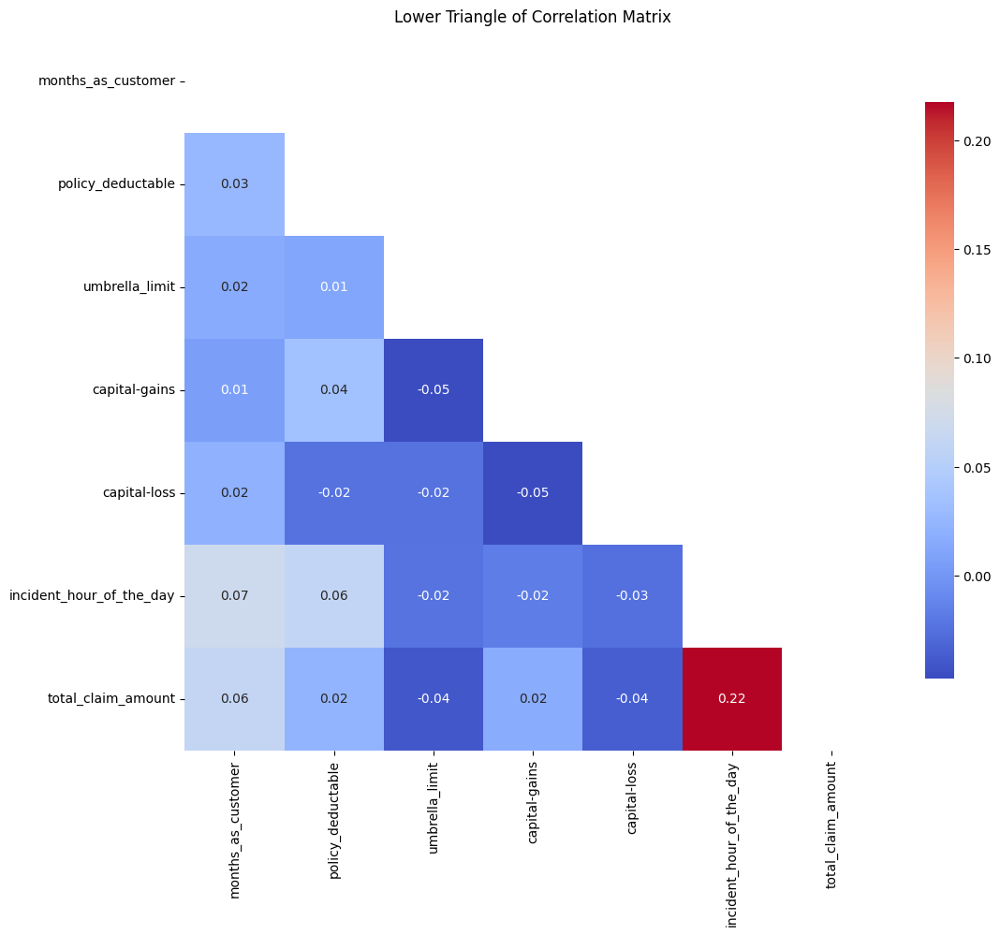

In [35]:
# Calcular la matriz de correlación
correlation_matrix = df_fraudClaims[numericas].corr()

# Crear una máscara para la mitad superior
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Configurar el gráfico de calor con la máscara
plt.figure(figsize=(12, 10))
sns.heatmap(
    correlation_matrix,
    mask=mask,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    cbar_kws={"shrink": 0.8}
)
plt.title('Lower Triangle of Correlation Matrix')
plt.show()

---
## Tratamiento para valores nulos o desconocidos '?'

En relación con los valores nulos en la columna authorities_contacted, estos se convertirán en '?', siguiendo el mismo formato que se utiliza en las columnas collision_type, property_damage y police_report_available los cuales fueron encontrados con valores desconocidos en la seccion de datos generales.

In [36]:
df_fraudClaims['authorities_contacted'].fillna('?', inplace=True) #De valor nulo a caracter '?'


In [37]:
columnas_con_caracter_nulo = {}
caracter = '?'

for column in df_fraudClaims.columns:
    if df_fraudClaims[column].astype(str).str.contains(caracter, regex=False).any():

        columnas_con_caracter_nulo[column] = df_fraudClaims[column].value_counts().get(caracter, 0)

print(columnas_con_caracter_nulo)


{'collision_type': 178, 'authorities_contacted': 91, 'property_damage': 360, 'police_report_available': 343}


### Manejo de los valores '?' en las columnas

  - collision_type: 178
  - property_damage: 360
  - police_report_available: 343
  - authorities_contacted: 91

Es importante manejar estos valores debido a que su cantidad es considerable en relación con el total de registros (1000). Para las columnas:

- collision_type
- property_damage
- police_report_available

se podría considerar crear una nueva categoría llamada 'other' o bien agregar los valores ('?') a una categoría existente,dependiendo también del comportamiento que se analice en los datos.

En el caso de la columna authorities_contacted, ya existe una columna denominada 'other', por lo que se pueden agregar los valores ('?') a esa columna o bien a una categoría existente, dependiendo también del comportamiento que se analice en los datos.


### Gráfico de las columnas con '?' y el target

#### Grafico barras

In [38]:
columnas_analizar = ['collision_type', 'property_damage', 'police_report_available', 'authorities_contacted']

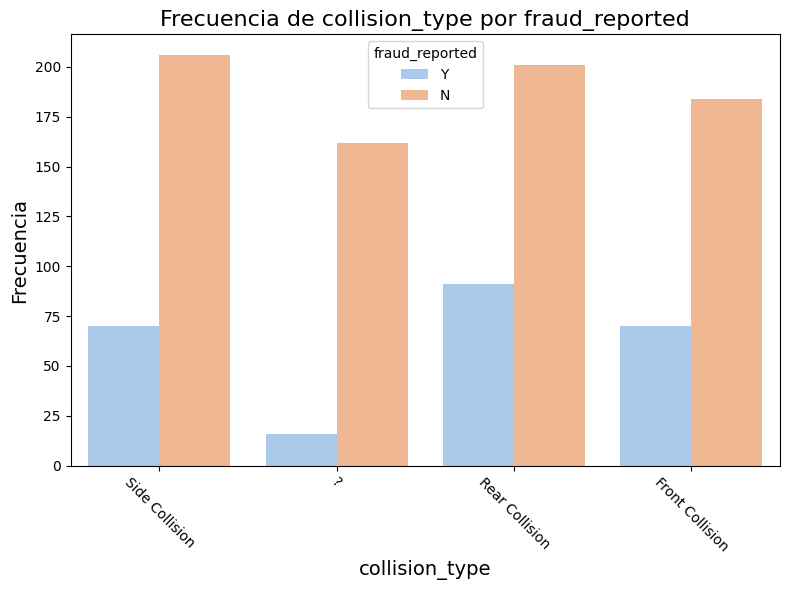

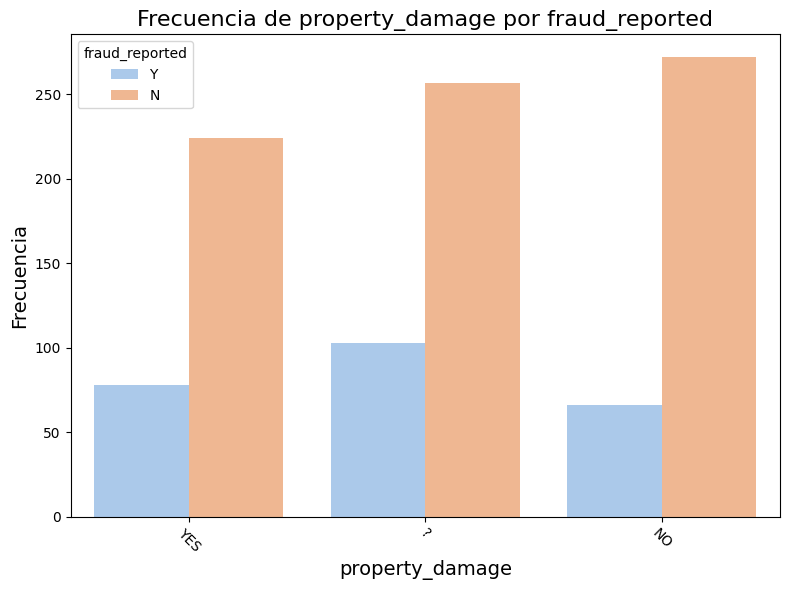

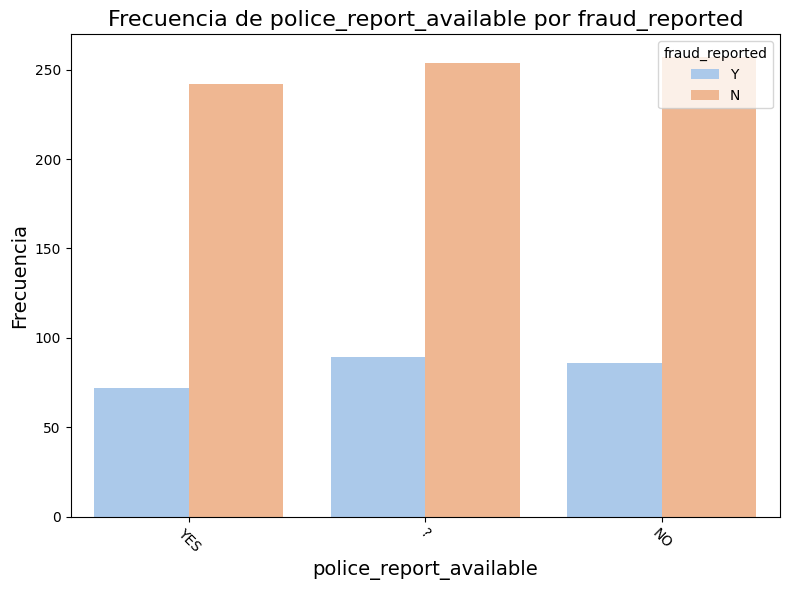

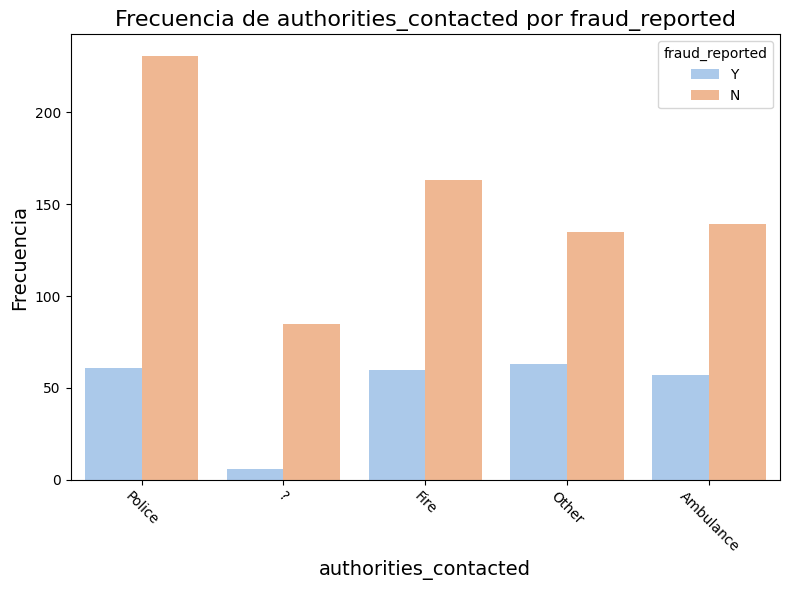

In [39]:
countplot(df_fraudClaims, columnas_analizar, 'fraud_reported')

**Comentarios:** Se observa que los valores de '?' para la variable target, se comporta de manera similar como las demas categorias

### Para 'collision_type'

Conteo de cada valor único

In [40]:
category_counts = df_fraudClaims['collision_type'].value_counts()
print(category_counts)

collision_type
Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: count, dtype: int64


#### Gráfico de barras

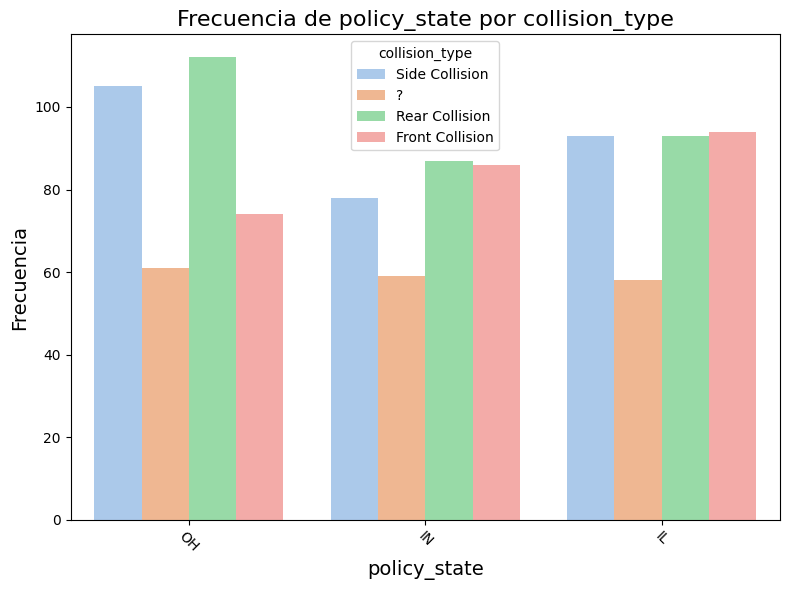

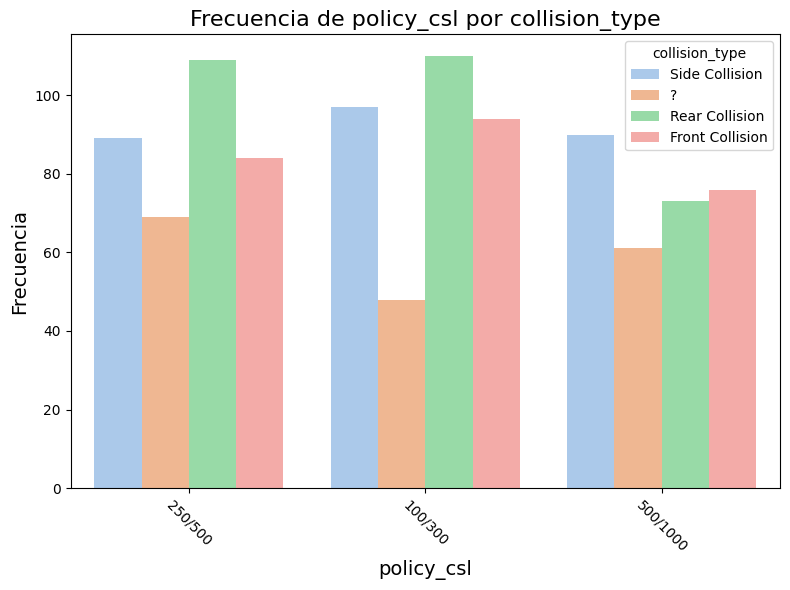

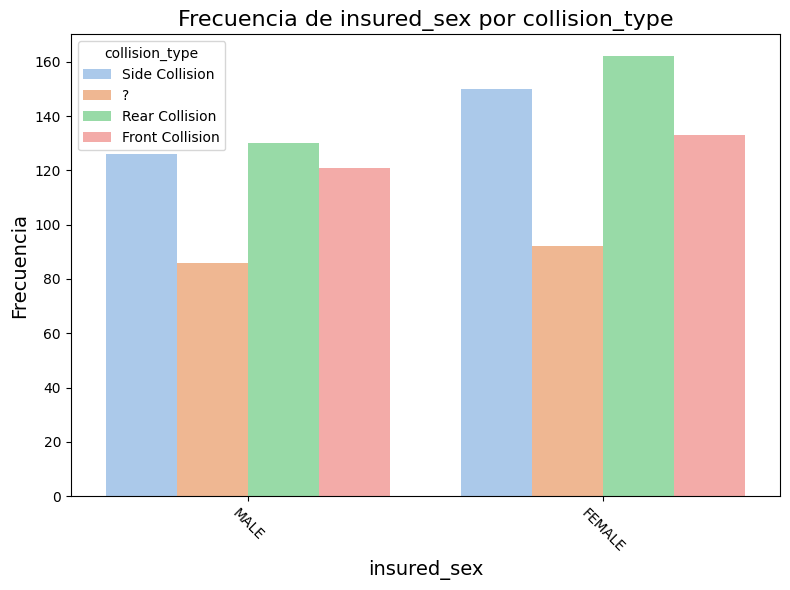

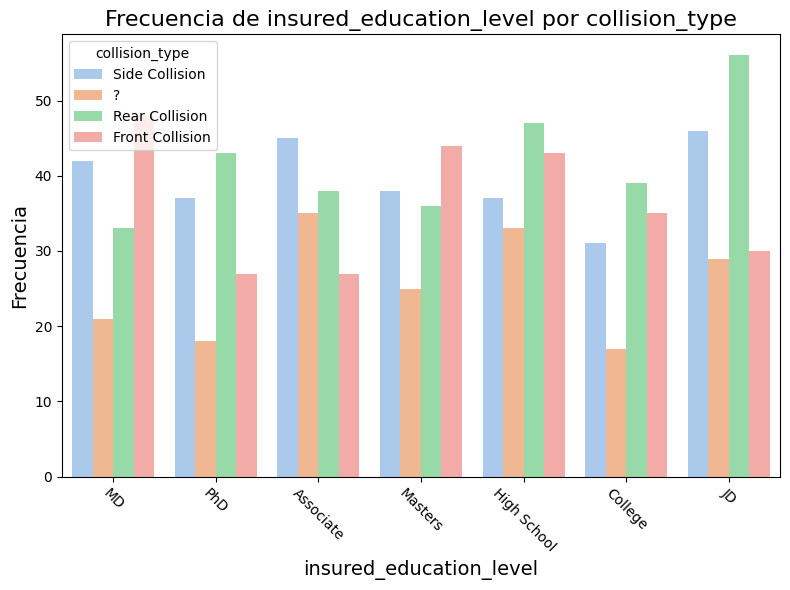

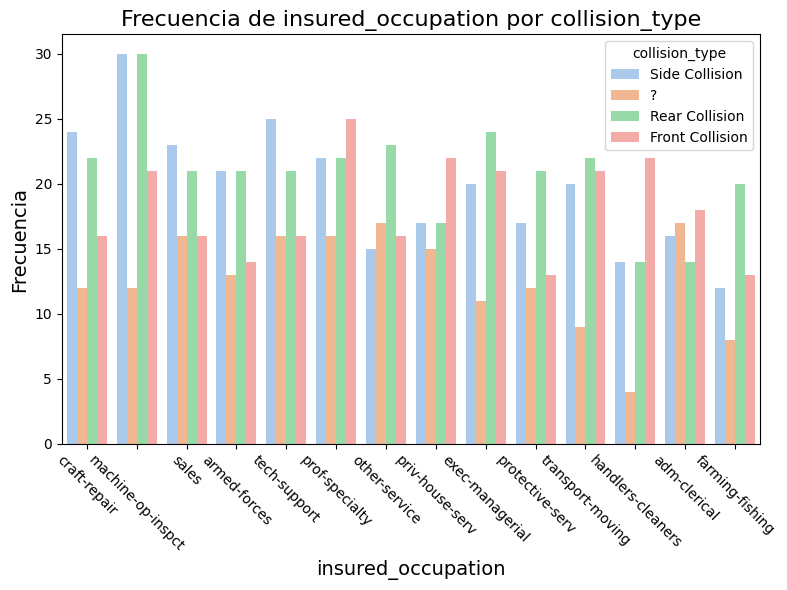

...

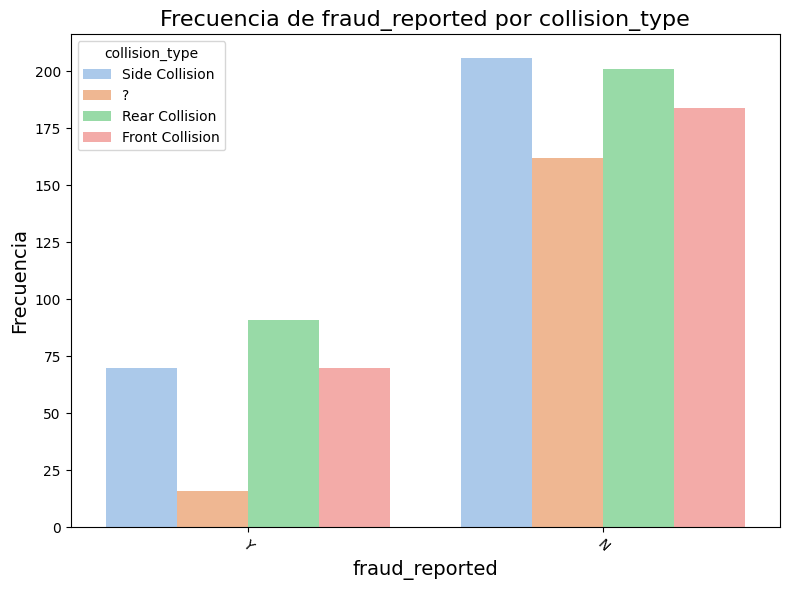

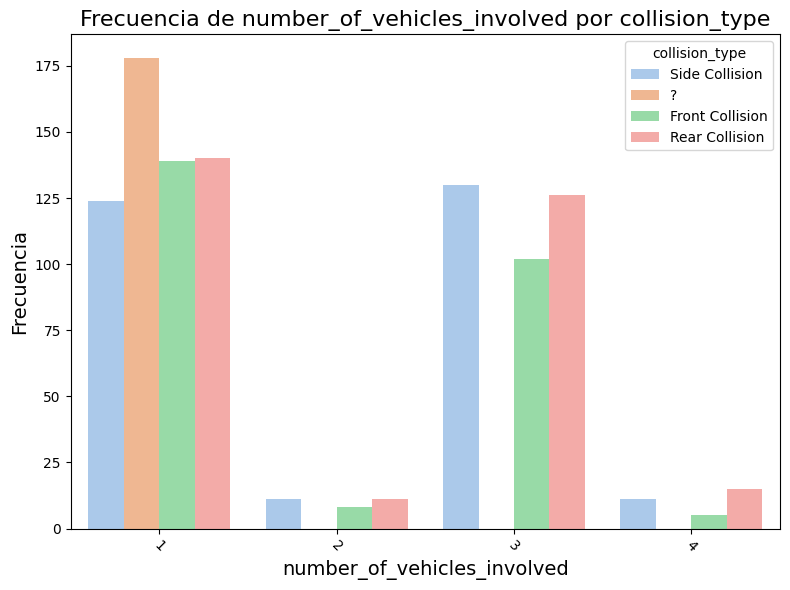

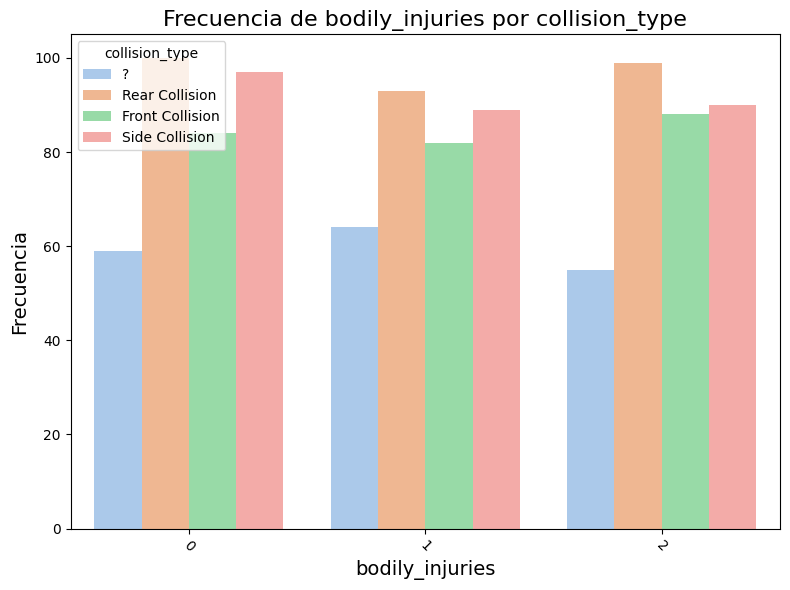

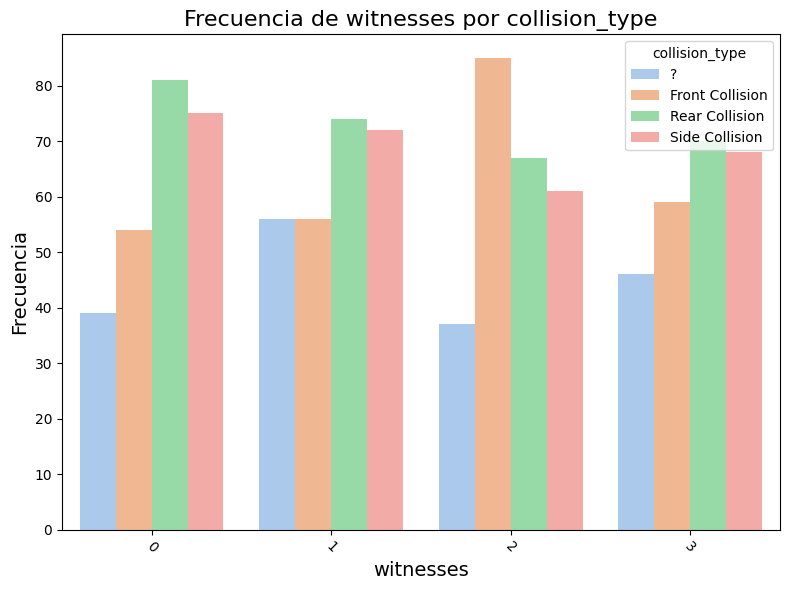

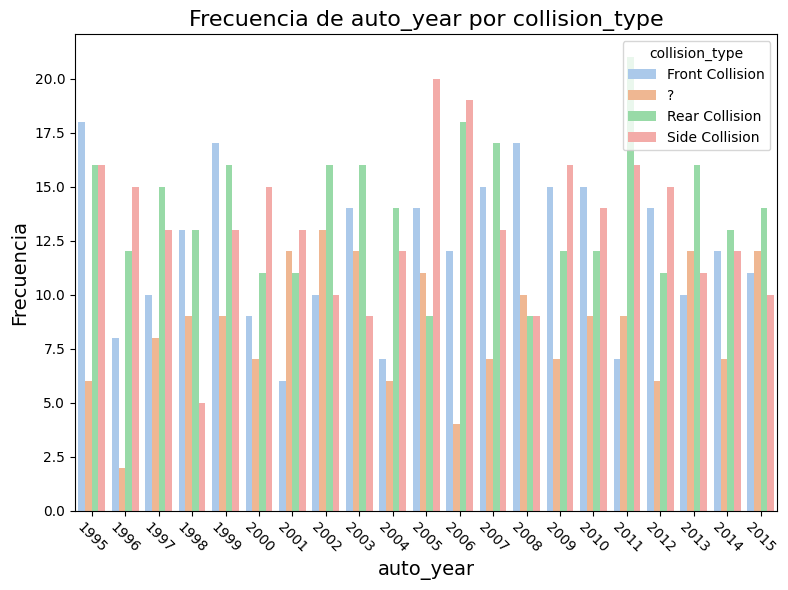

In [41]:
countplot(df_fraudClaims, categoricas, 'collision_type')

**Comentarios:** Al analizar la frecuencia de las cuatro categorías de la columna collision_type (side, rear, front y ?) en relación con cada columna categórica, se observa un comportamiento uniforme en la mayoría de los casos. A excepcion de:

 - En la columna incident_type se identifica que el valor de '?' solo aparece asociado con los incidentes de tipo vehicle theft y parked car. Esto sugiere que, en estos casos, no se registró un tipo de colisión (trasera, frontal o lateral), lo que probablemente llevó a asignar el valor ? como indicador de ausencia de información sobre el tipo de choque.

 - De manera similar, en la columna incident_severity, el valor '?' únicamente aparece asociado con las categorías minor damage y trivial damage, siguiendo la idea de que al no haberse registrado un choque, el daño fue clasificado como menor o trivial, lo que explica la asignación del valor '?' como indicador de ausencia de información específica sobre la severidad del incidente.

 - De manera similar, en la columna number_of_vehicles_involved, el valor '?' únicamente aparece asociado a la categoria de 1, lo cual siguiendo la idea de que al no haberse registrado un choque que involucra 2 vehiculos, al ser solo 1 puede ser por un tipo de accidente vehicle theft o parked car.


#### Gráfico de boxplot

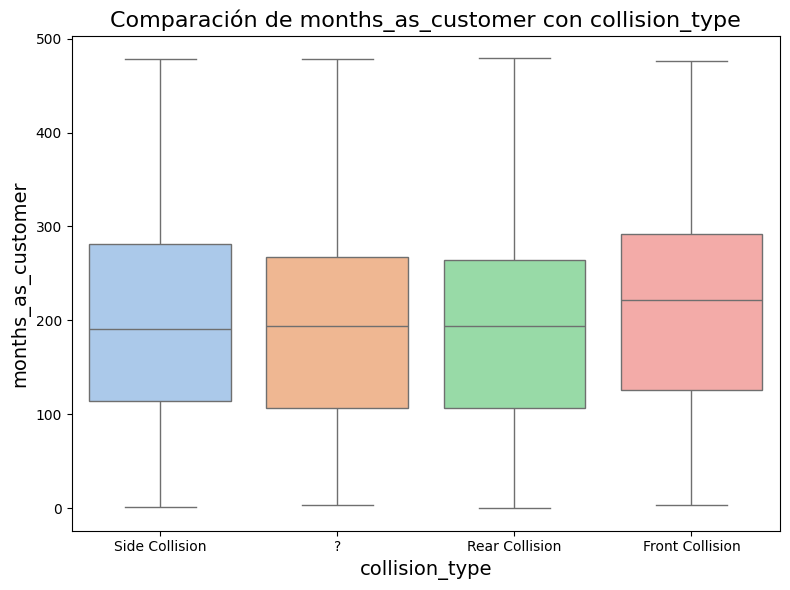

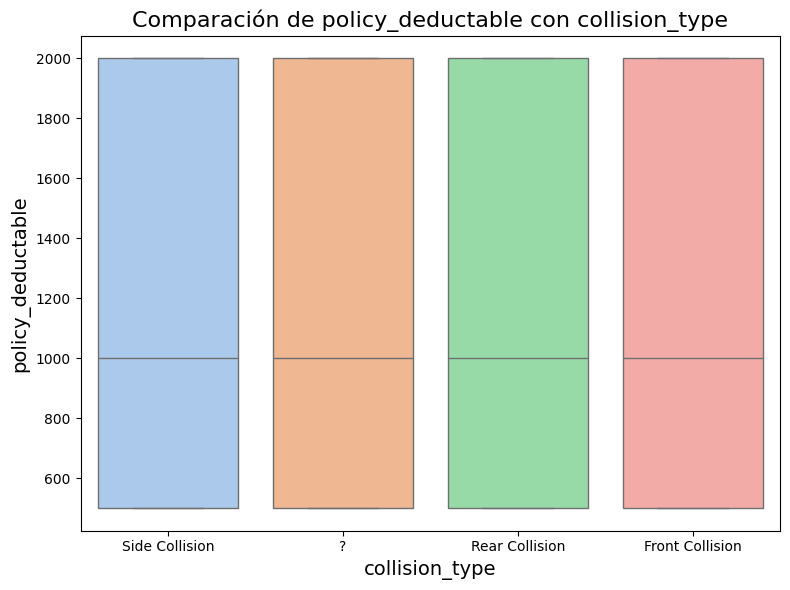

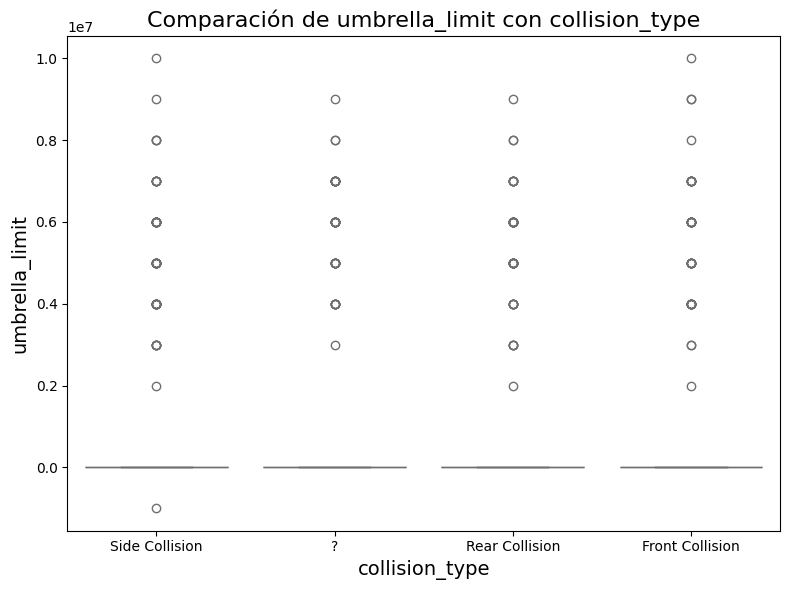

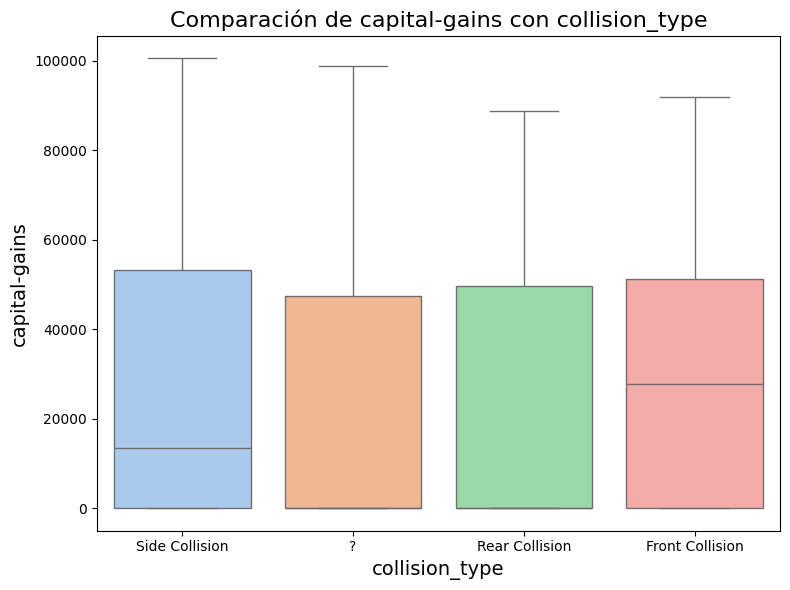

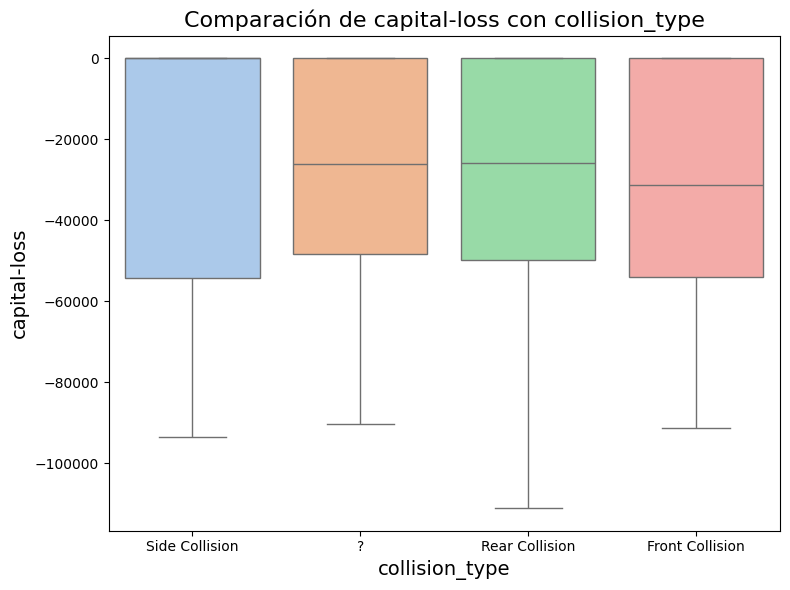

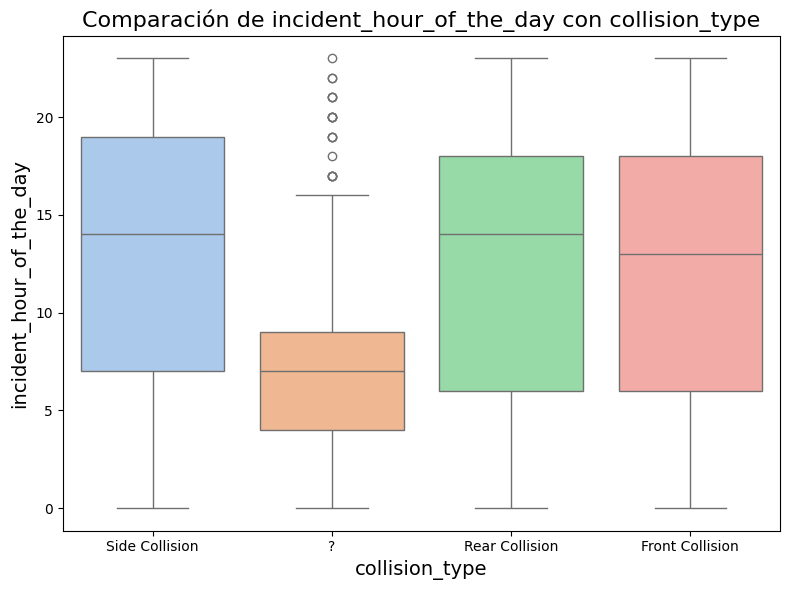

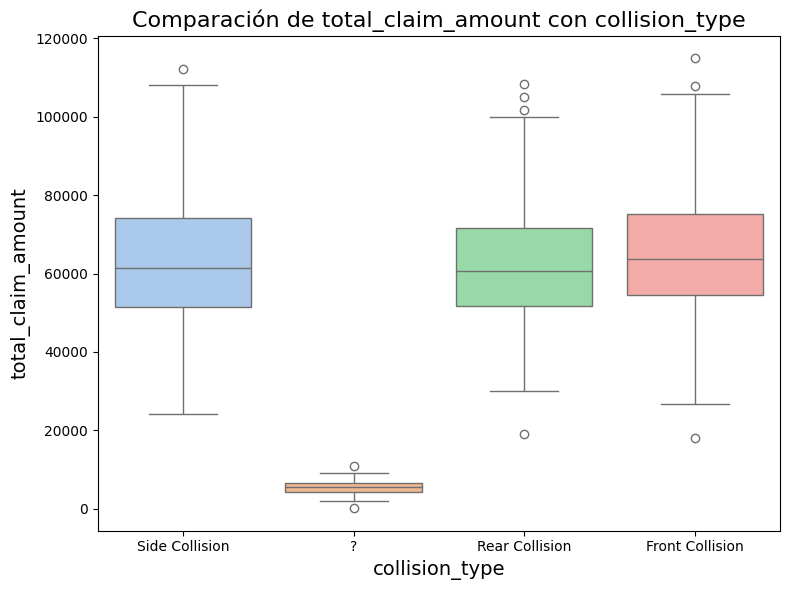

In [42]:
boxplot(df_fraudClaims, numericas, 'collision_type')

**Comentarios:**  Al analizar la frecuencia de las cuatro categorías de la columna collision_type en relación con las columnas numéricas, particularmente aquellas que registran reclamaciones como vehicle_claim, property_claim, injury_claim, entre otras, se observa que el valor '?' está asociado con montos cercanos a 0. Esto coincide con el análisis previo de las columnas categóricas, donde se identificó que los casos con daños menores o triviales presentan reclamaciones bajas. Además, este patrón sugiere que los vehículos asociados con incidentes de tipo vehicle theft no están siendo reclamados, lo cual siguiere que no hubo colisión en dichos casos.

#### Gráfico de pares

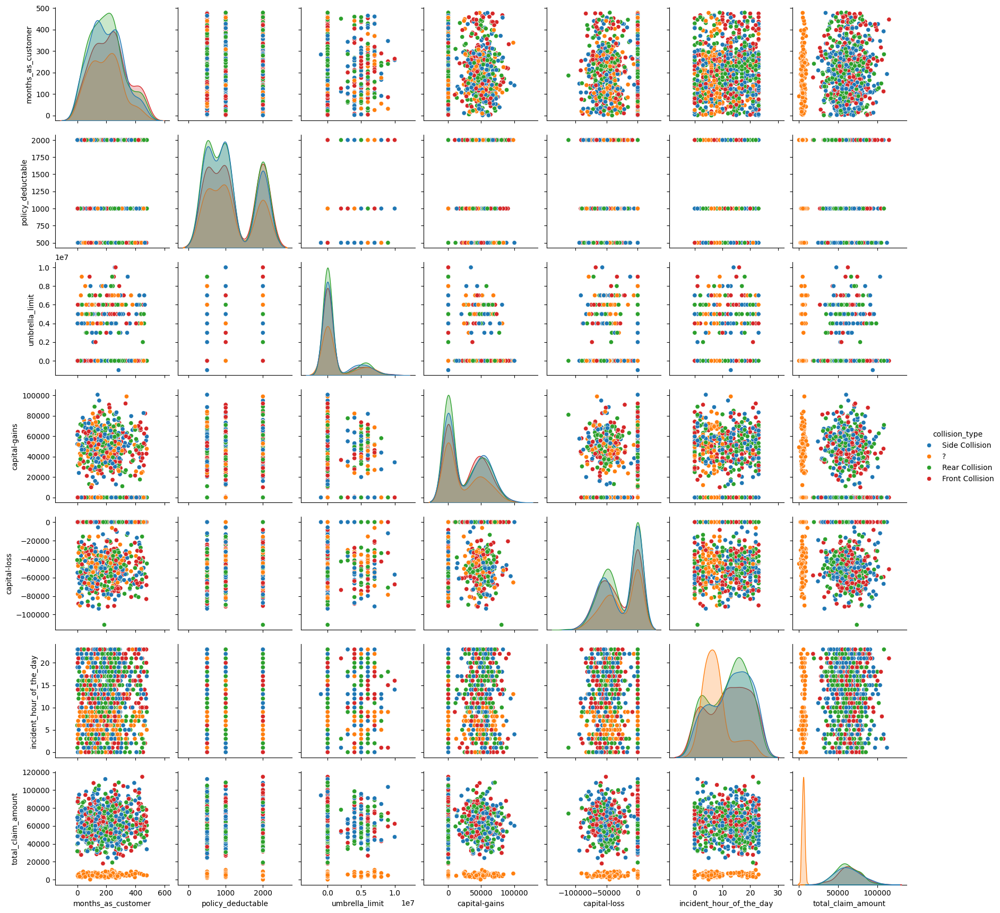

In [43]:
sns.pairplot(df_fraudClaims, hue='collision_type', vars=numericas)
plt.show()


#### Observaciones


Con base en el análisis del valor '?' tanto en las columnas categóricas como en las numéricas, y la visualizacion en el pairplot, se concluye que estos valores no representan datos perdidos. Por el contrario, están claramente asociados con patrones específicos en otras columnas. Por ello, se decide crear una nueva categoría denominada 'Other collision', para capturar y representar adecuadamente estos casos dentro del análisis.

In [44]:
#Reemplazar '?' con 'Other Collision' en la columna collision_type
df_fraudClaims['collision_type'] = df_fraudClaims['collision_type'].replace('?', 'Other Collision')


In [45]:
category_counts = df_fraudClaims['collision_type'].value_counts()
print(category_counts)

collision_type
Rear Collision     292
Side Collision     276
Front Collision    254
Other Collision    178
Name: count, dtype: int64


### Para 'property_damage'

#### Conteo de cada valor único

In [46]:
category_counts = df_fraudClaims['property_damage'].value_counts()
print(category_counts)

property_damage
?      360
NO     338
YES    302
Name: count, dtype: int64


#### Gráfico de barras

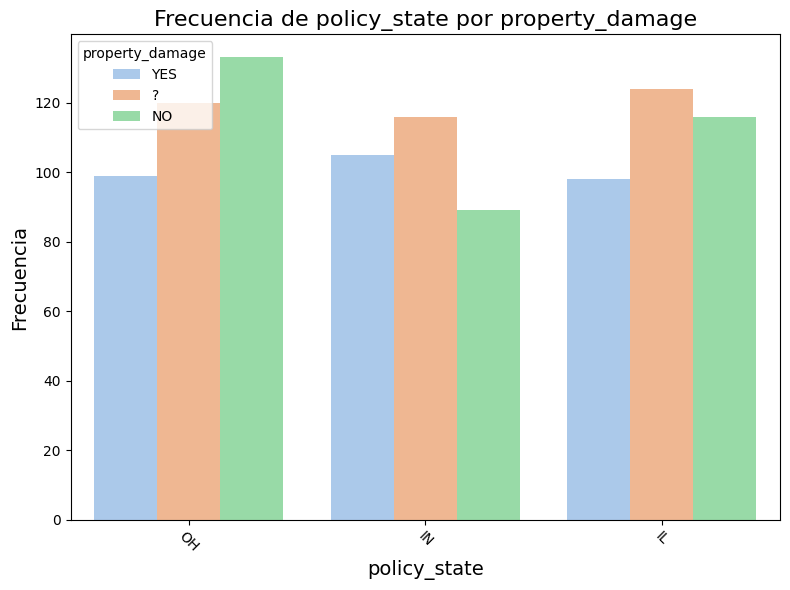

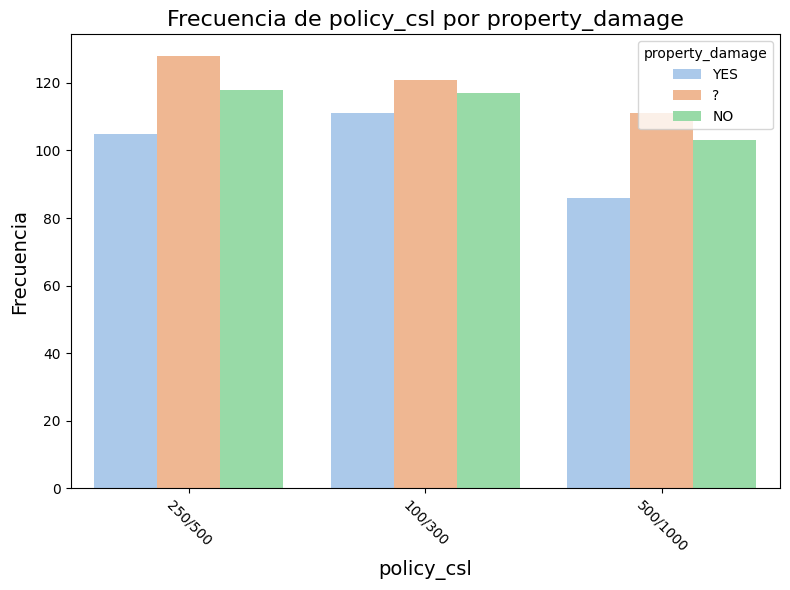

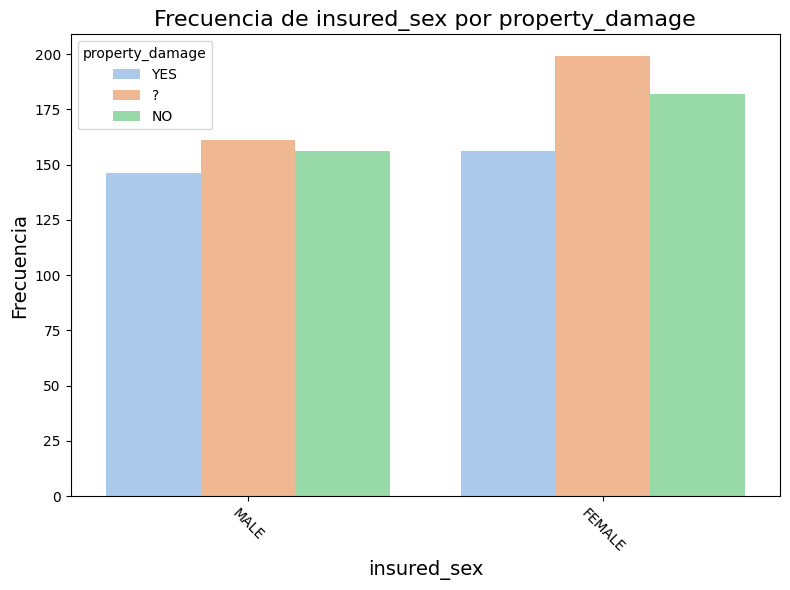

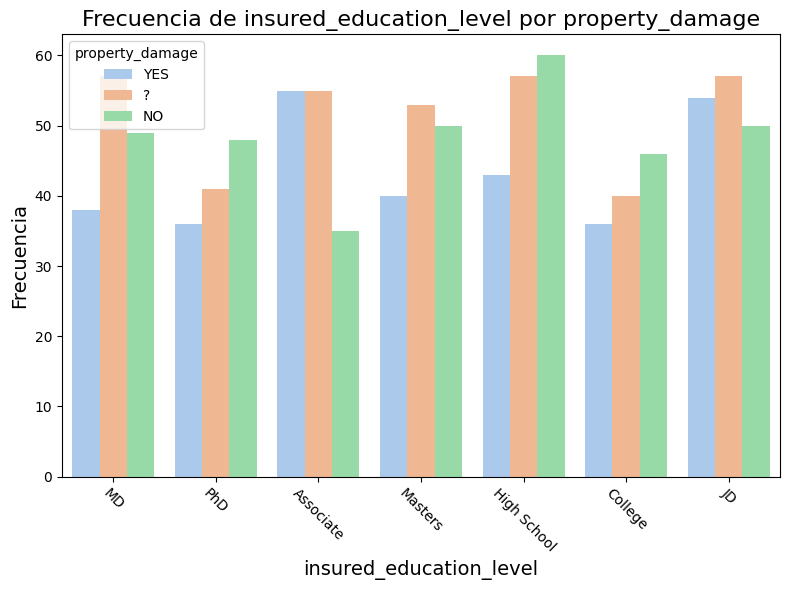

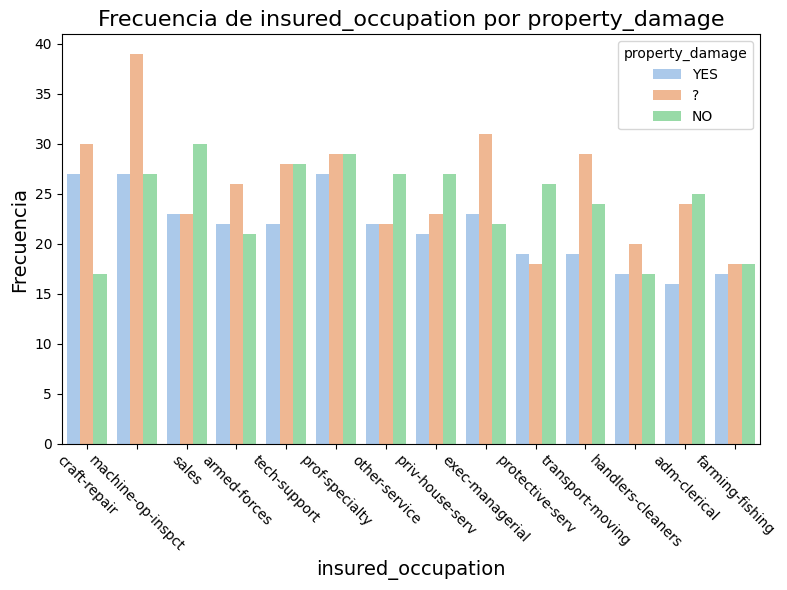

...

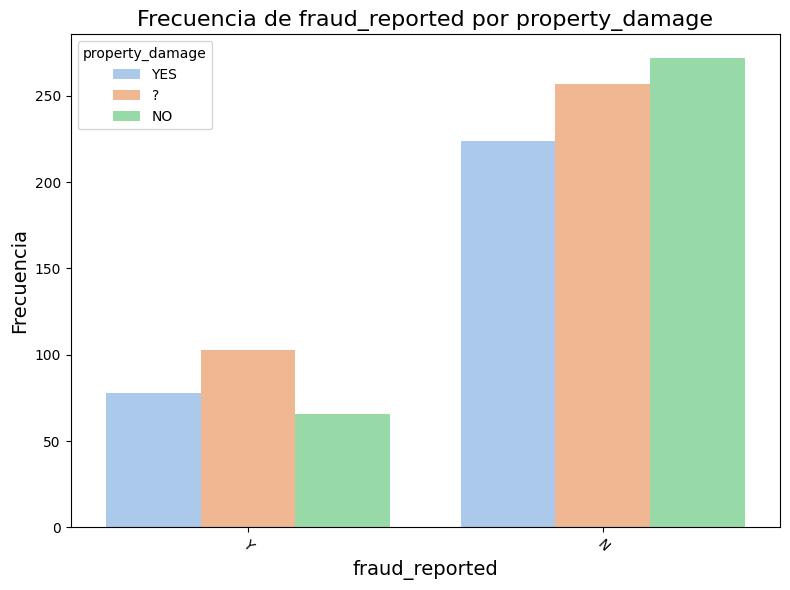

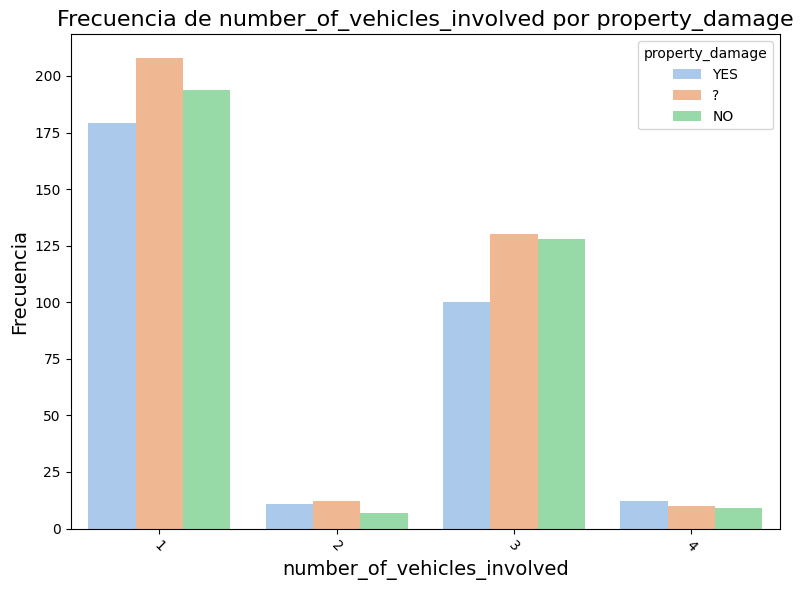

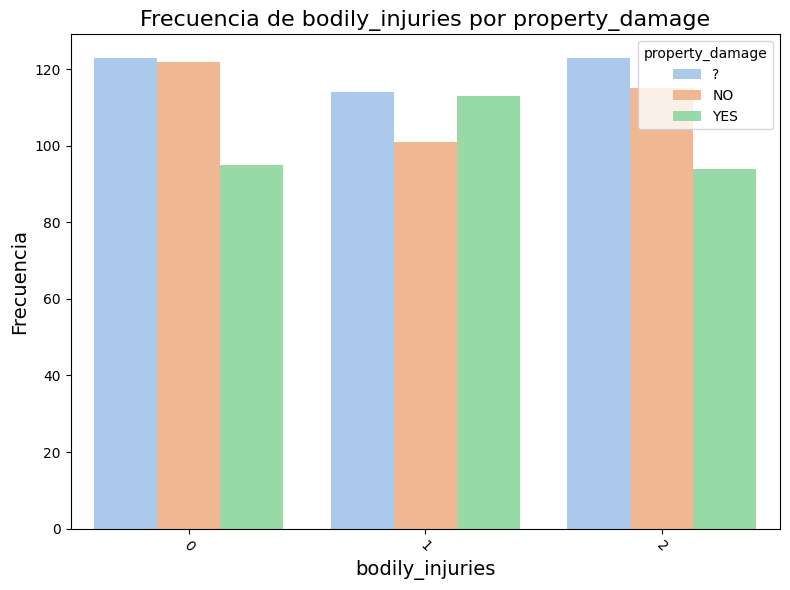

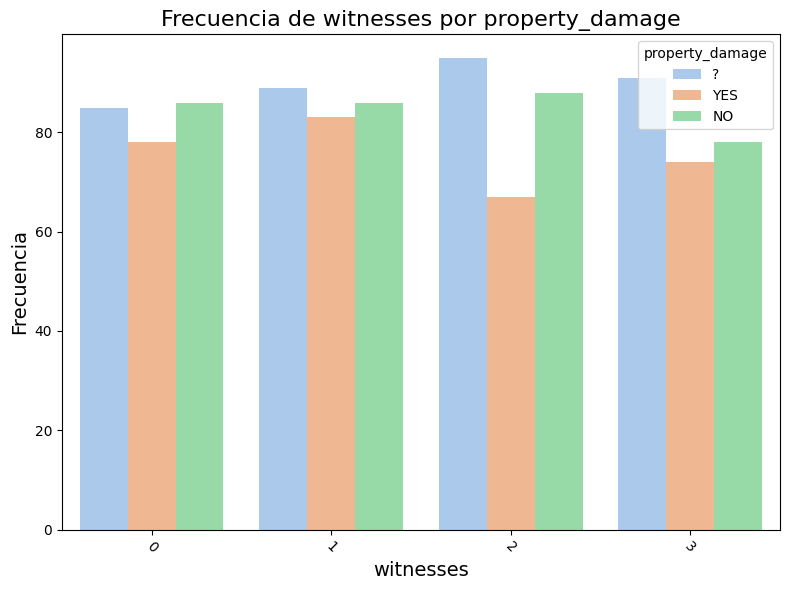

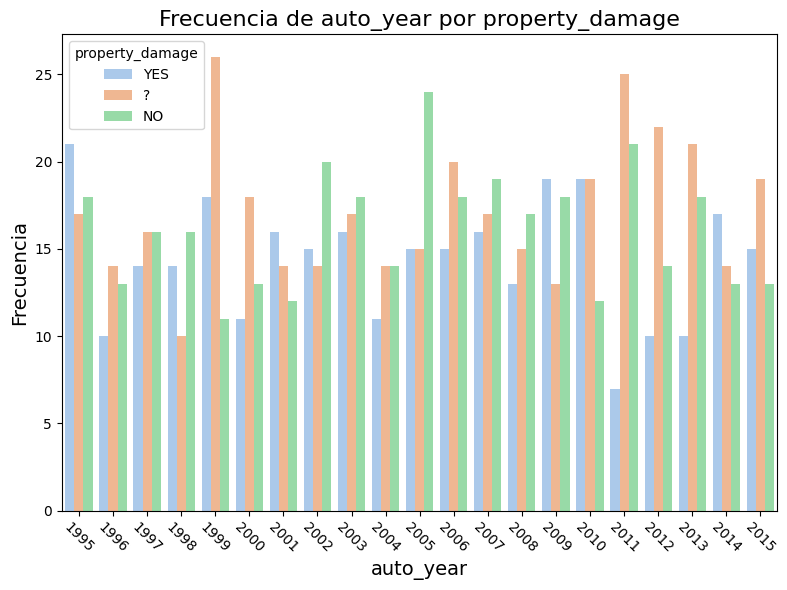

In [47]:
countplot(df_fraudClaims, categoricas, 'property_damage')

**Comentarios:**  Al analizar la frecuencia de las tres categorías de la columna property_damage (yes, no, y ?) en relación con cada columna categórica, se observa un comportamiento uniforme en todos los casos. No se identifica una diferencia significativa para la categoría de interés (?), lo que sugiere que esta categoría no presenta un patrón claro o distintivo en comparación con las demás.

#### Gráfico de boxplot

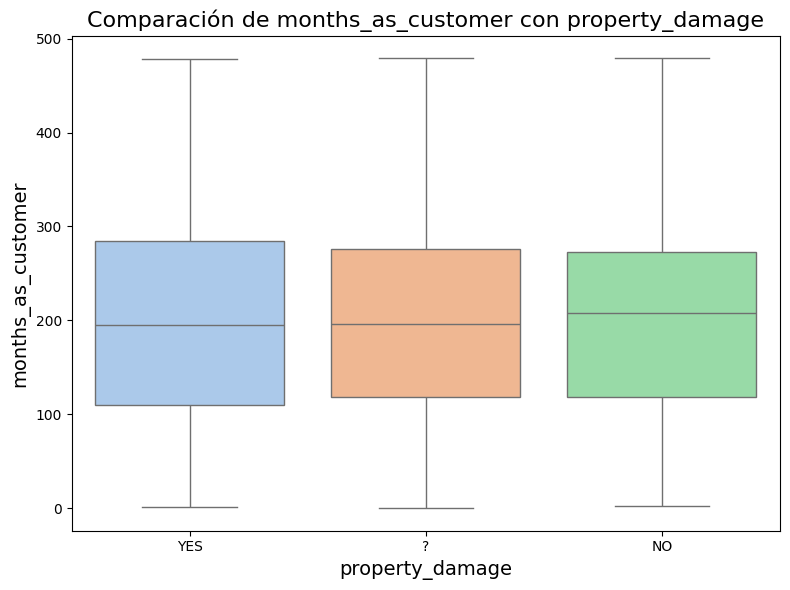

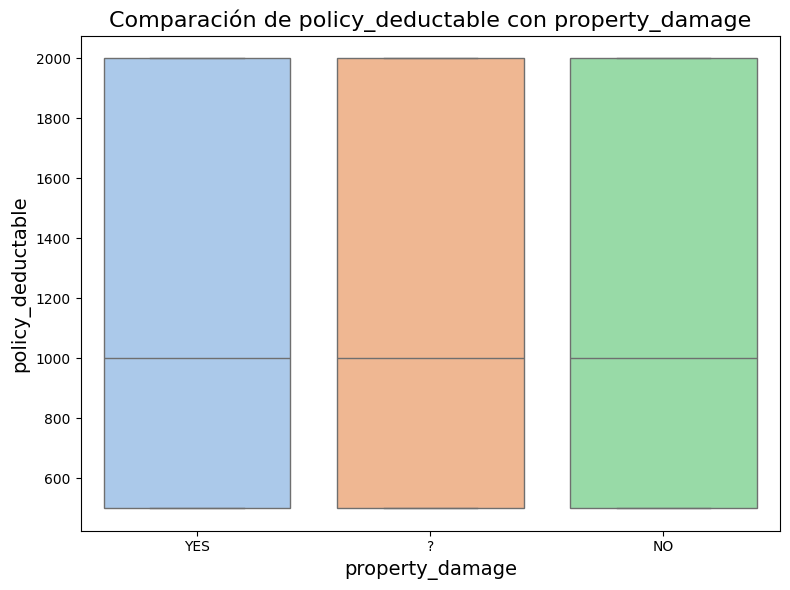

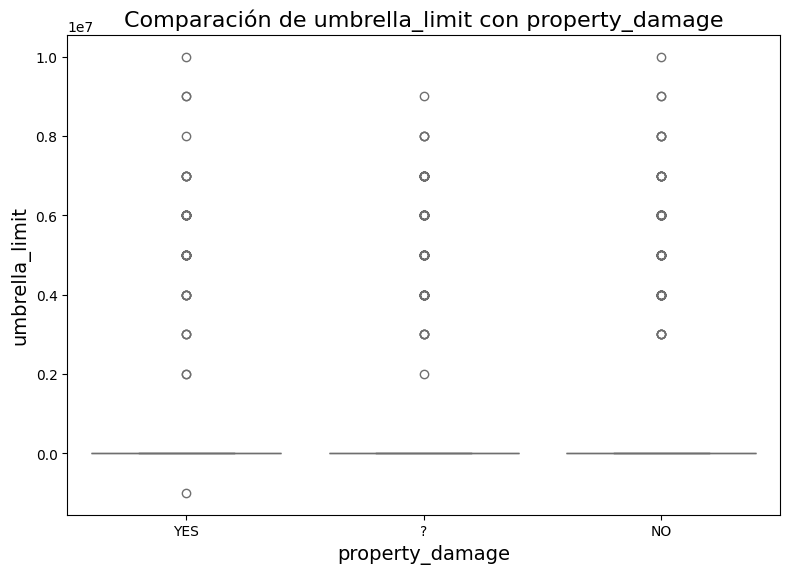

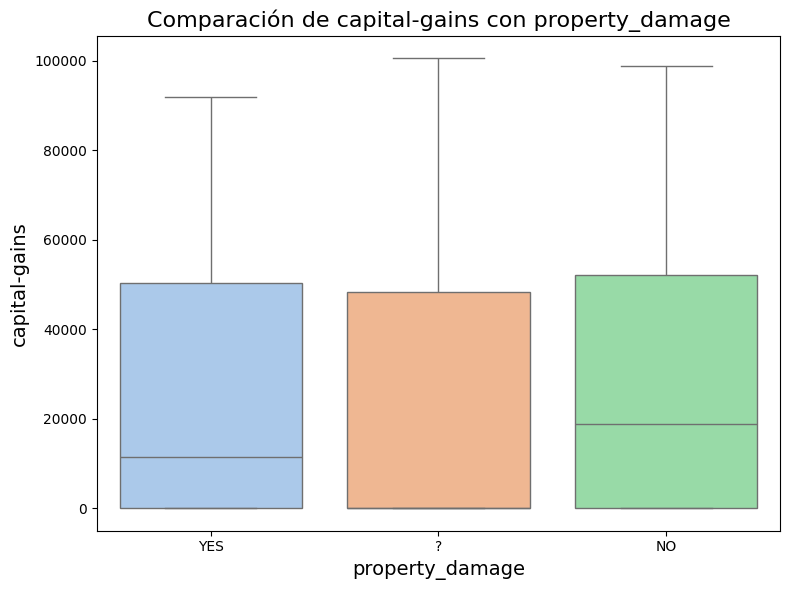

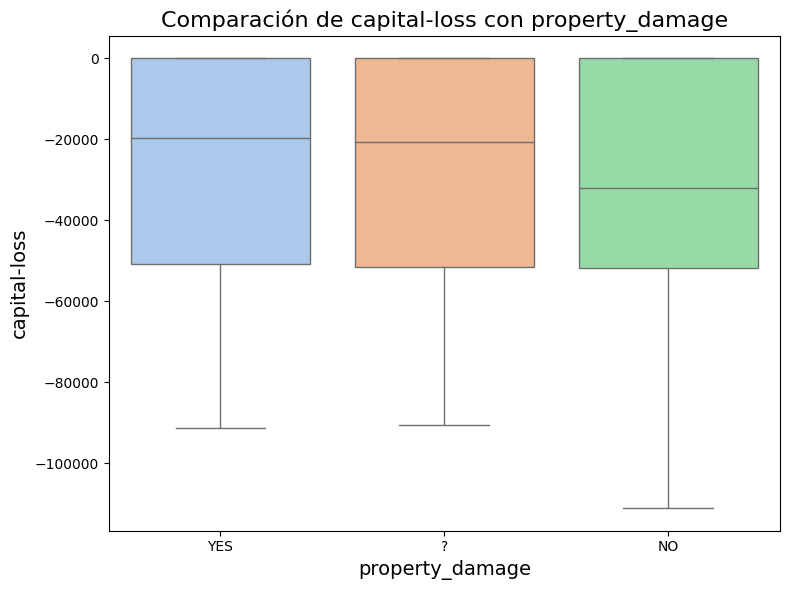

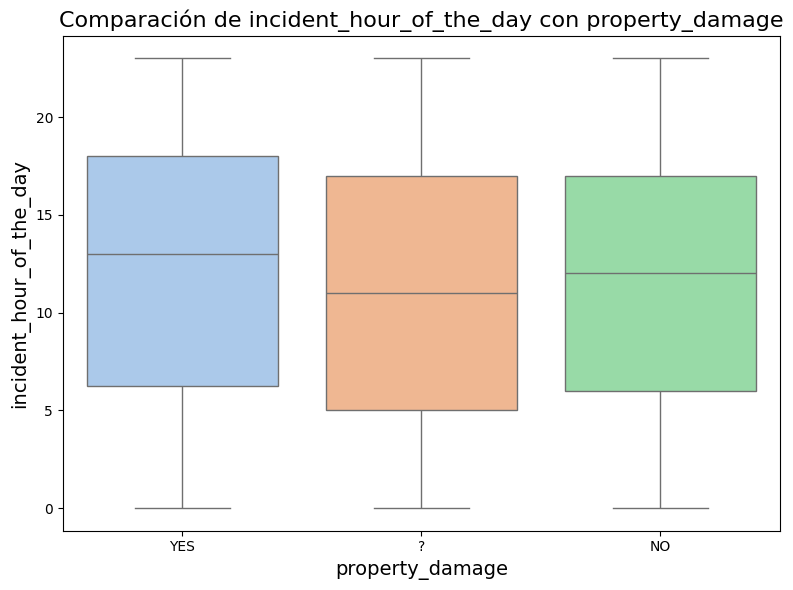

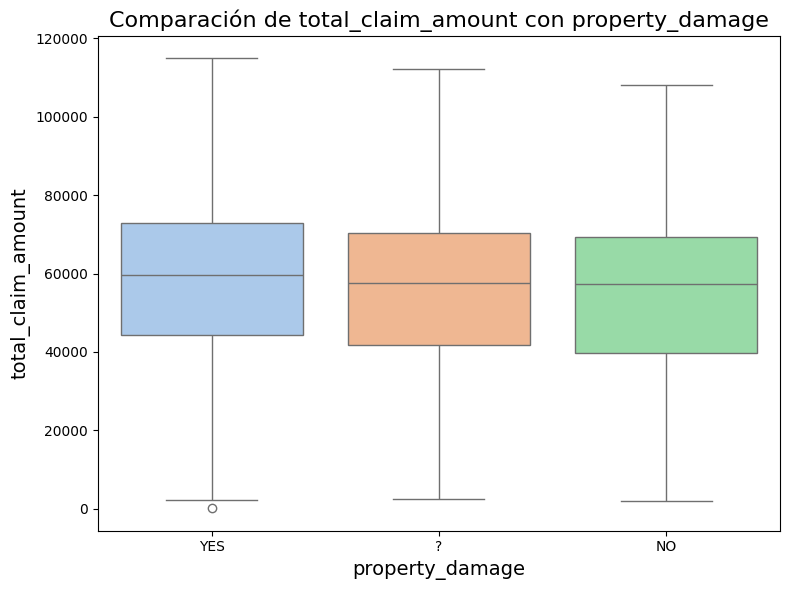

In [48]:
boxplot(df_fraudClaims, numericas, 'property_damage')

**Comentarios:**  Al analizar la frecuencia de las tres categorías de la columna property_damage (yes, no, y ?) en relación con cada columna numerica, se observa un comportamiento uniforme en todos los casos. No se identifica una diferencia significativa para la categoría de interés (?), lo que sugiere que esta categoría no presenta un patrón claro o distintivo en comparación con las demás.

#### Gráfico de pares

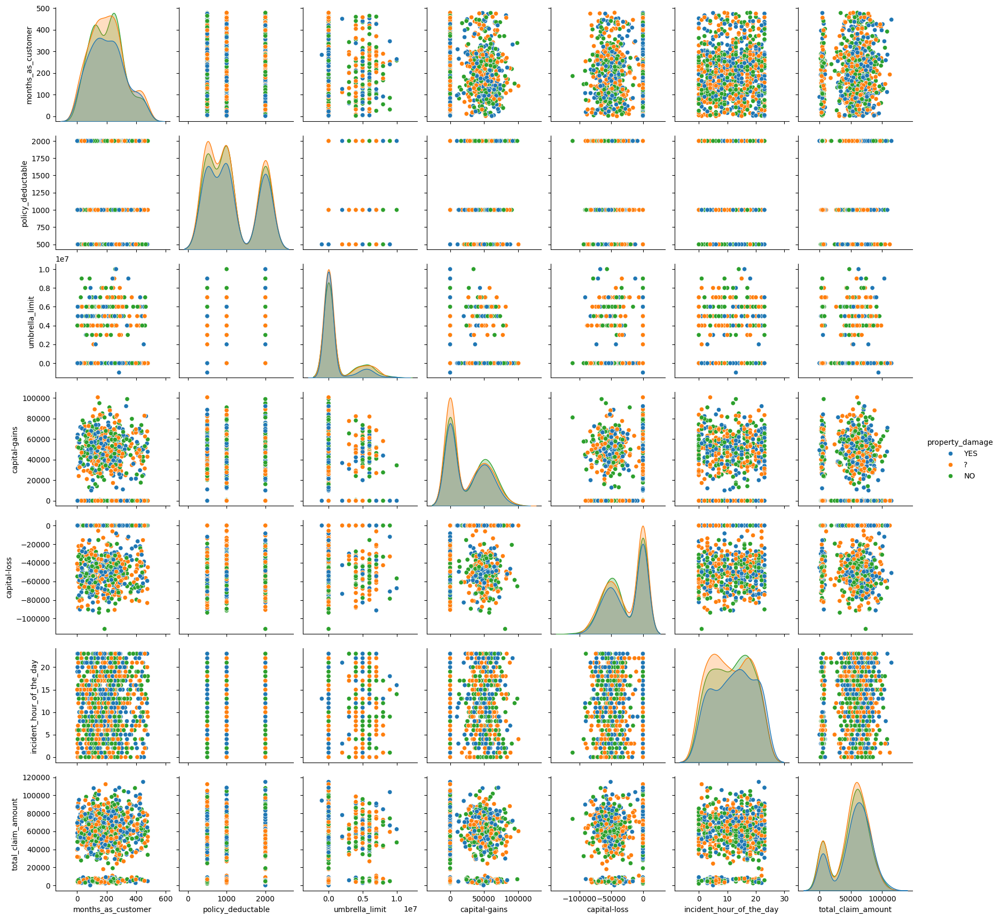

In [49]:
sns.pairplot(df_fraudClaims, hue='property_damage', vars=numericas)
plt.show()


#### Observaciones


Dado que el valor analizado (?) aparece en varias secciones sin mostrar una relación específica o un patrón distintivo, se ha decidido clasificarlo como una nueva categoría denominada 'No disponible'. Esta decisión se justifica por la cantidad significativa de registros asociados a este valor, lo que sugiere que podría ser relevante mantenerlo como una categoría separada para el análisis.

In [50]:
#Reemplazar '?' con 'Other' en la columna collision_type
df_fraudClaims['property_damage'] = df_fraudClaims['property_damage'].replace('?', 'Not available')


### Para 'police_report_available'

Conteo de cada valor único

In [51]:
category_counts = df_fraudClaims['police_report_available'].value_counts()
print(category_counts)

police_report_available
?      343
NO     343
YES    314
Name: count, dtype: int64


#### Gráfico de barras

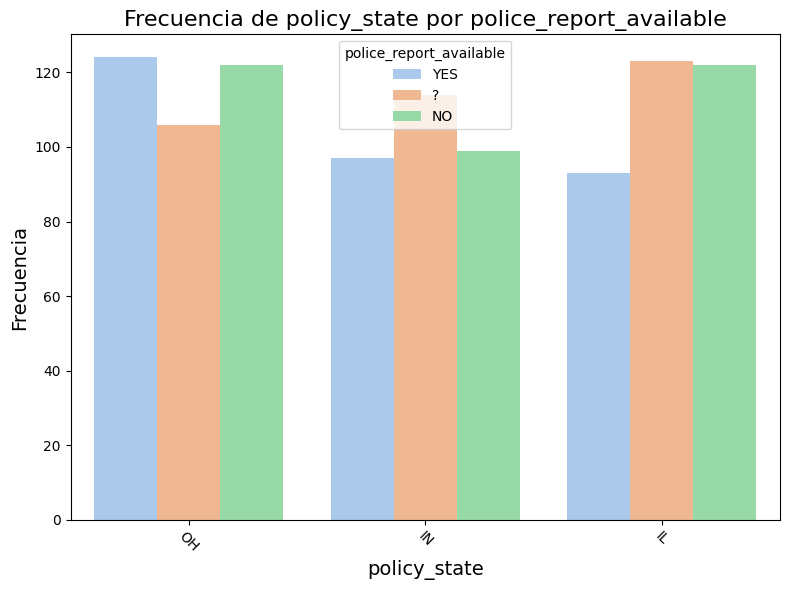

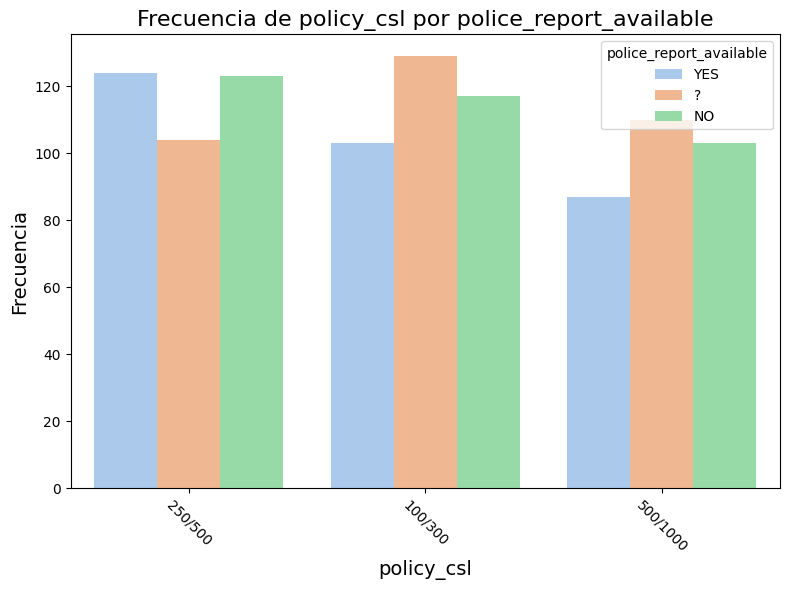

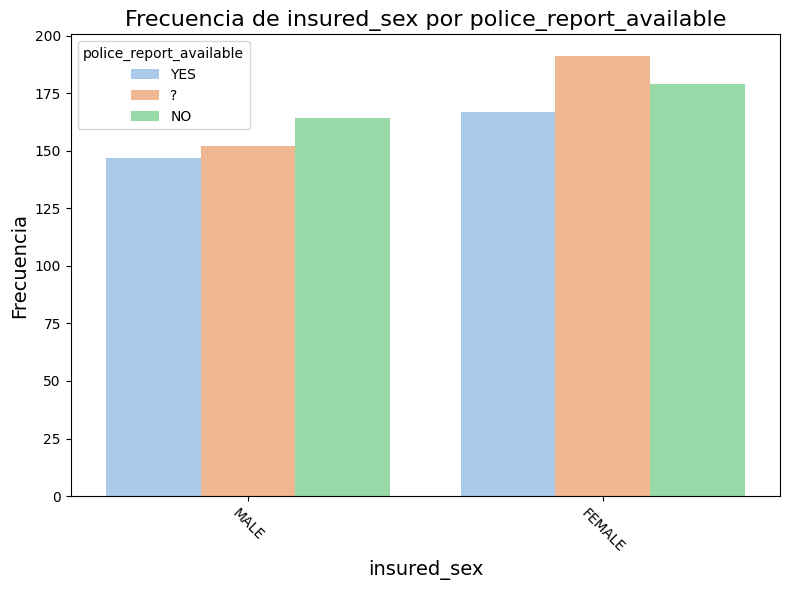

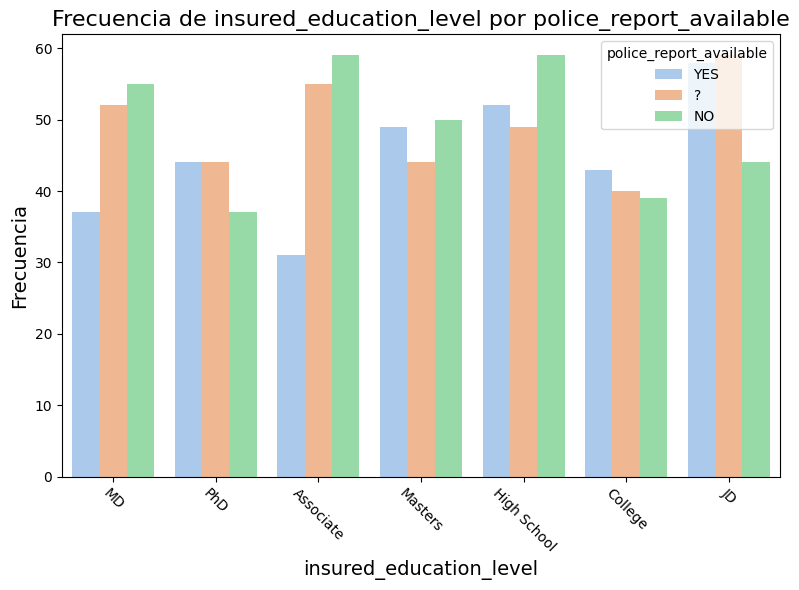

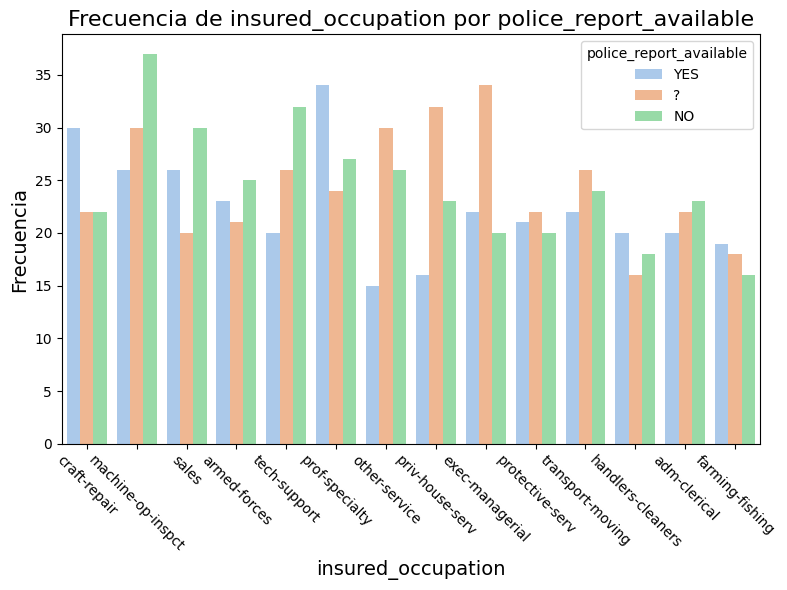

...

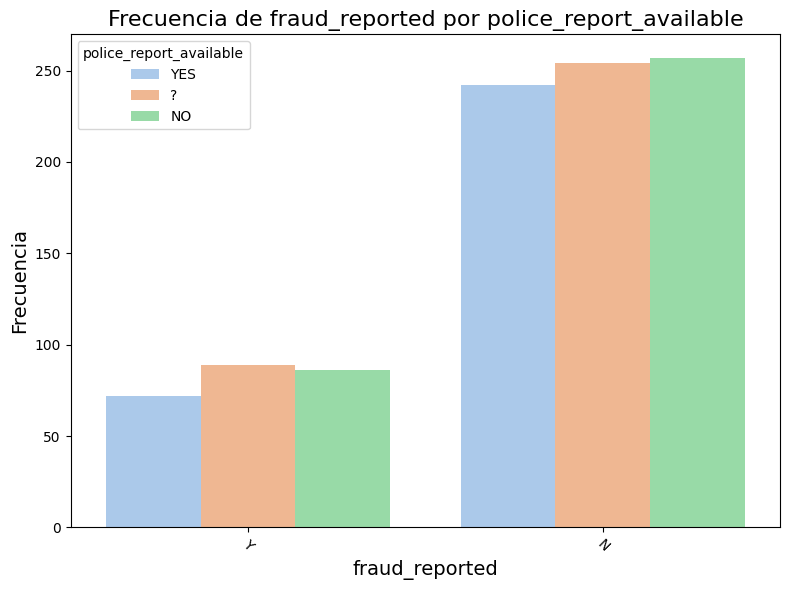

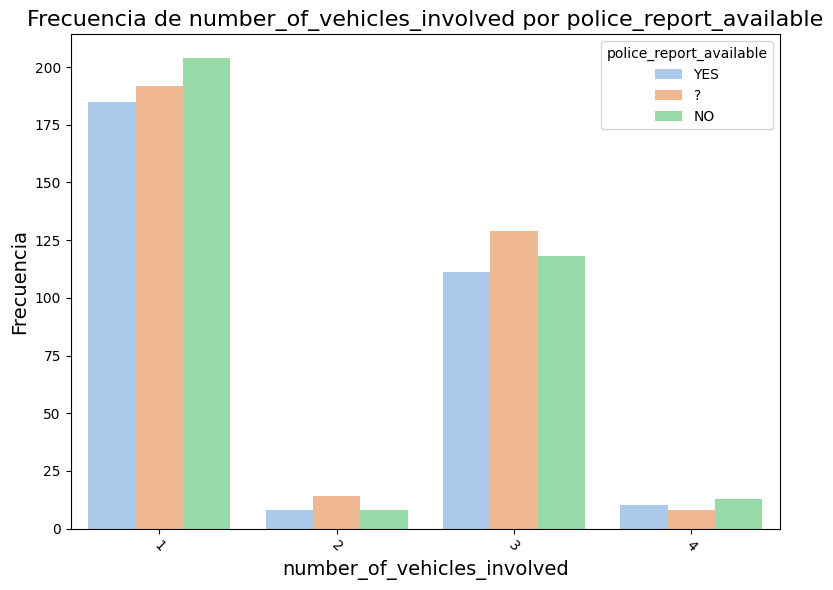

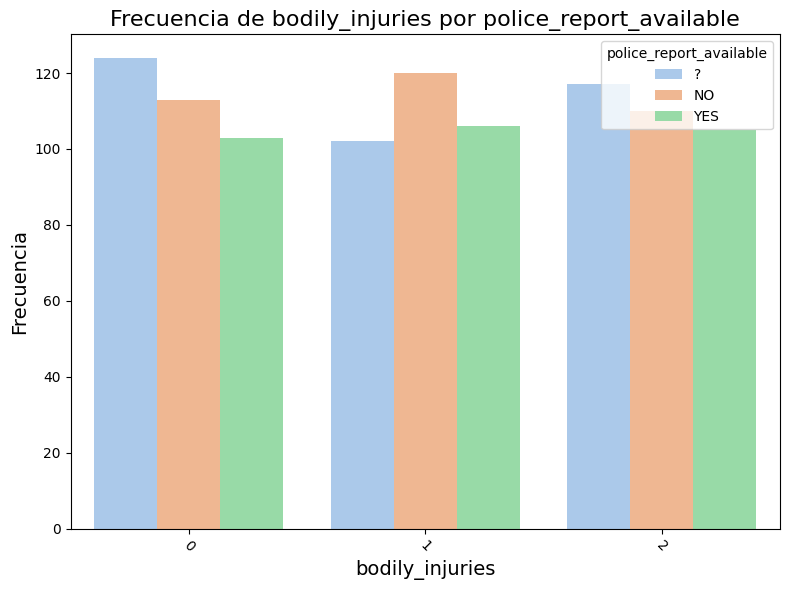

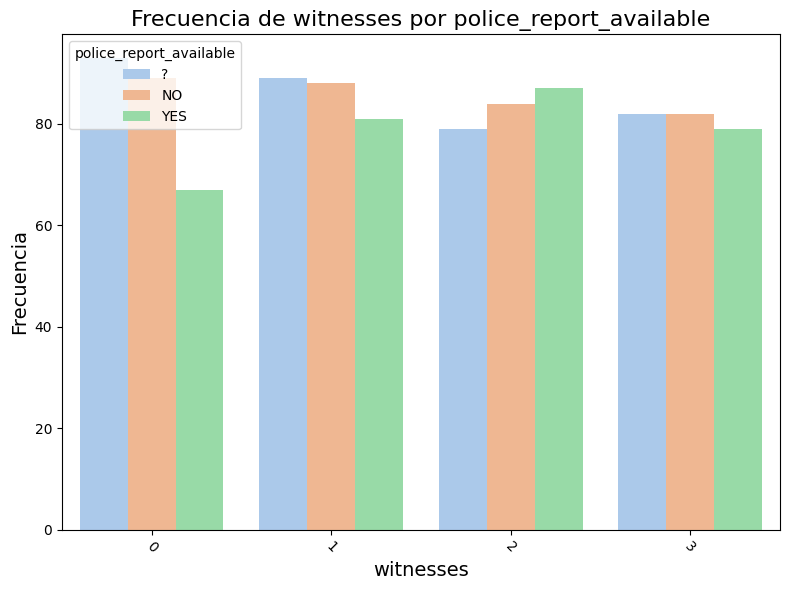

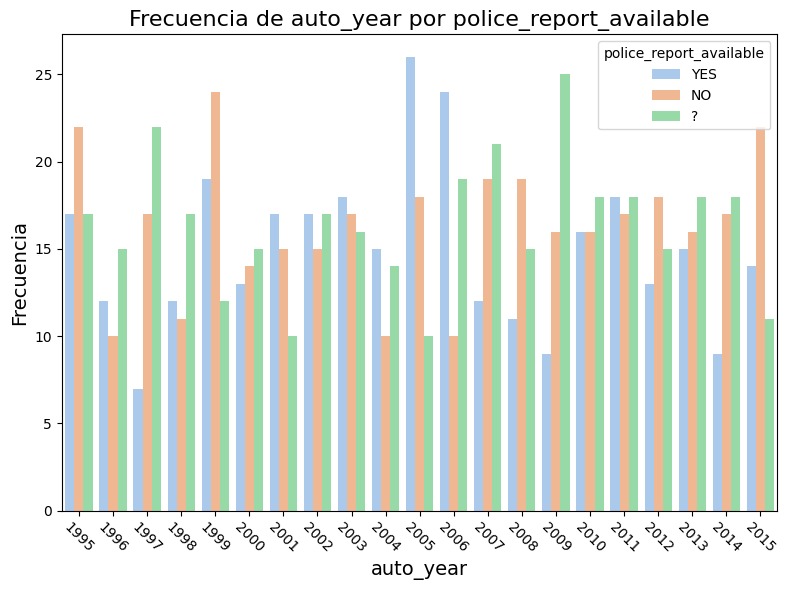

In [52]:
countplot(df_fraudClaims, categoricas, 'police_report_available')

**Comentarios:**  Al analizar la frecuencia de las tres categorías de la columna police_reporte_available (yes, no, y ?) en relación con cada columna categórica, se observa un comportamiento uniforme en todos los casos. No se identifica una diferencia significativa para la categoría de interés (?), lo que sugiere que esta categoría no presenta un patrón claro o distintivo en comparación con las demás.

#### Gráfico de boxplot

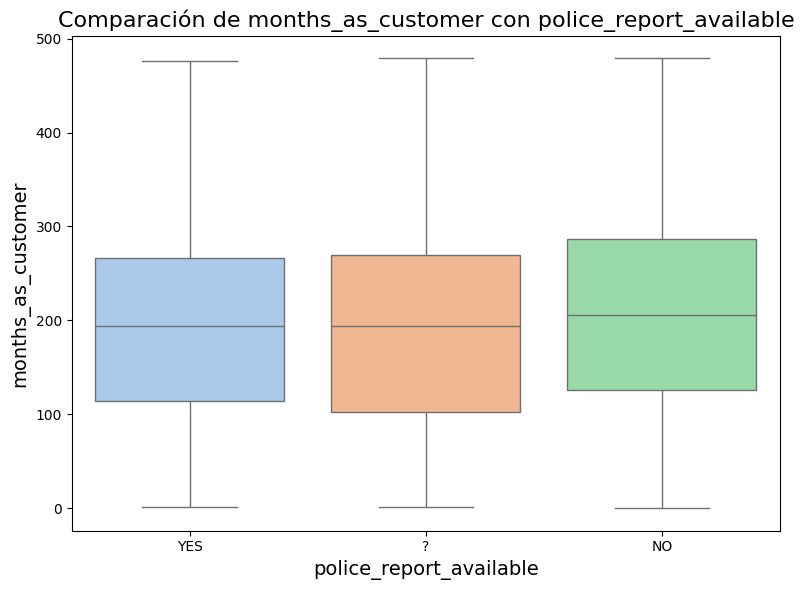

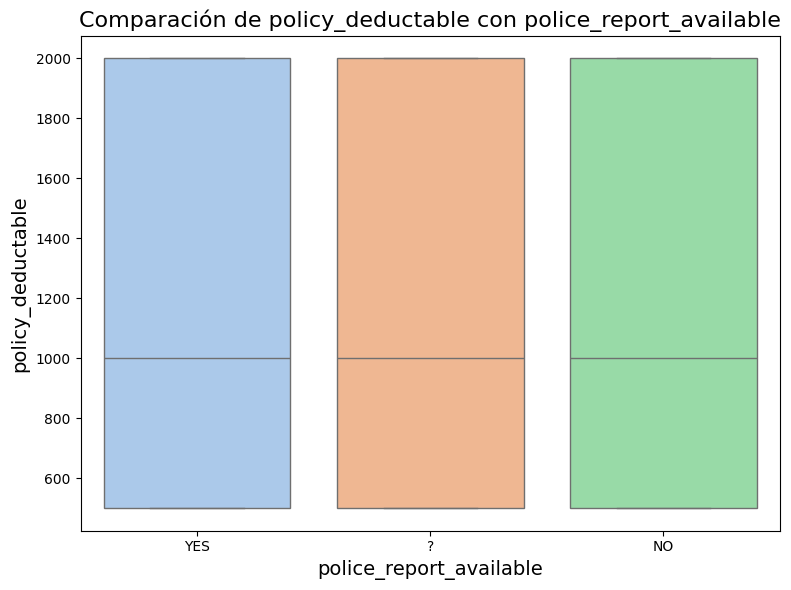

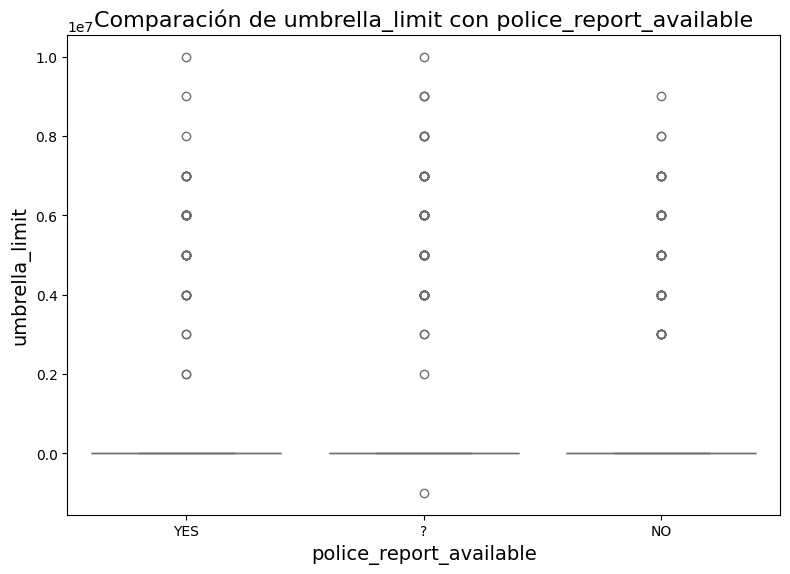

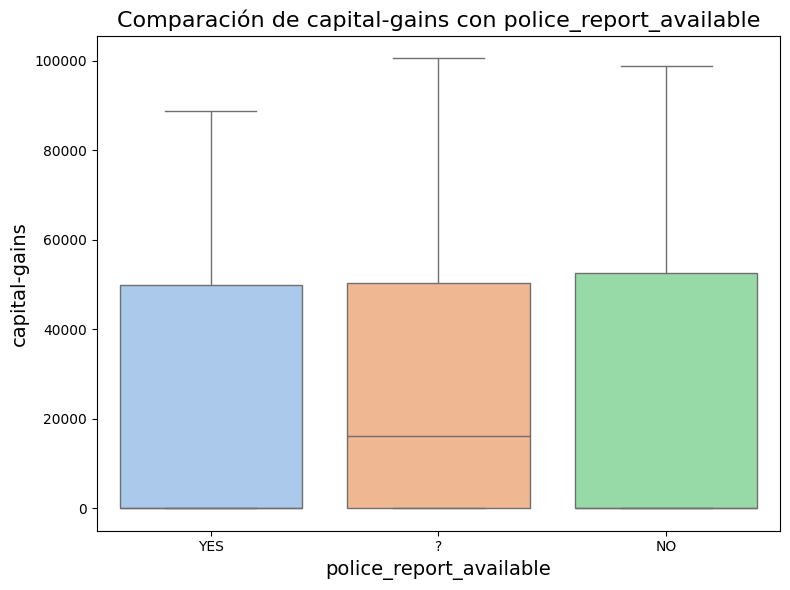

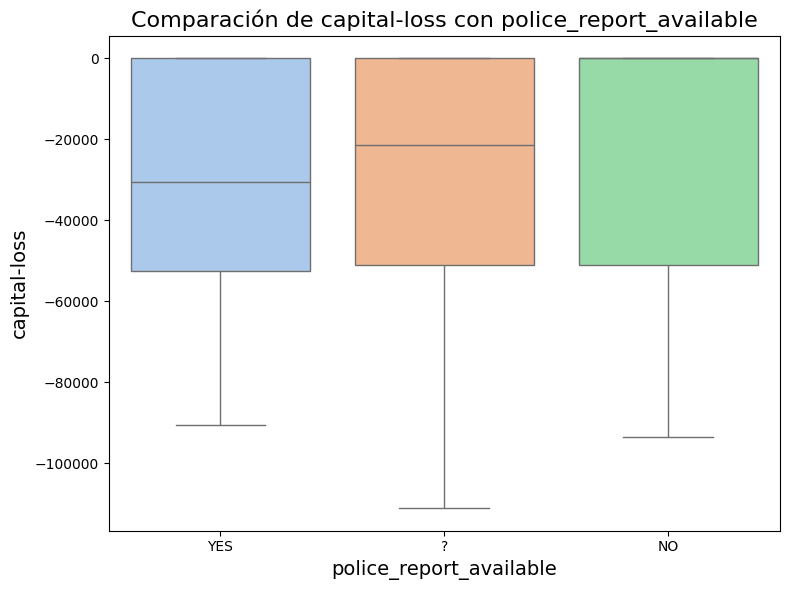

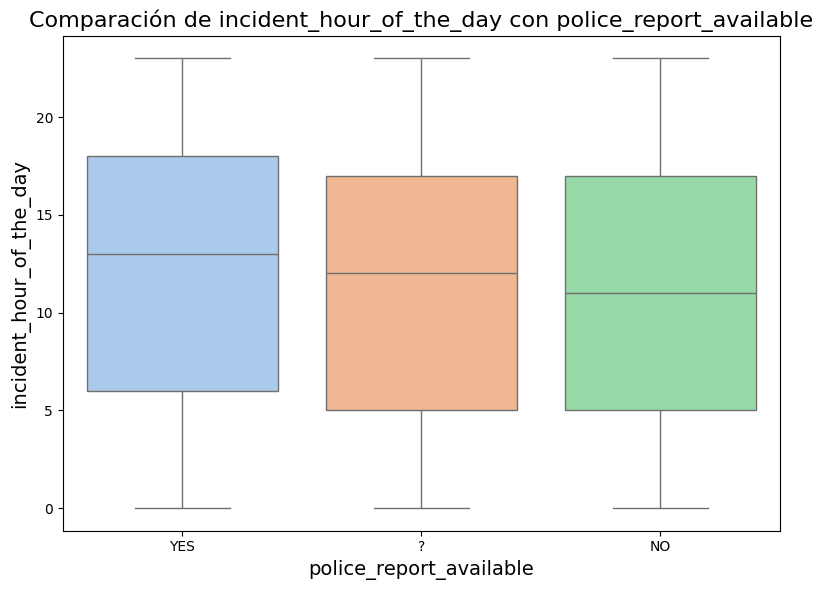

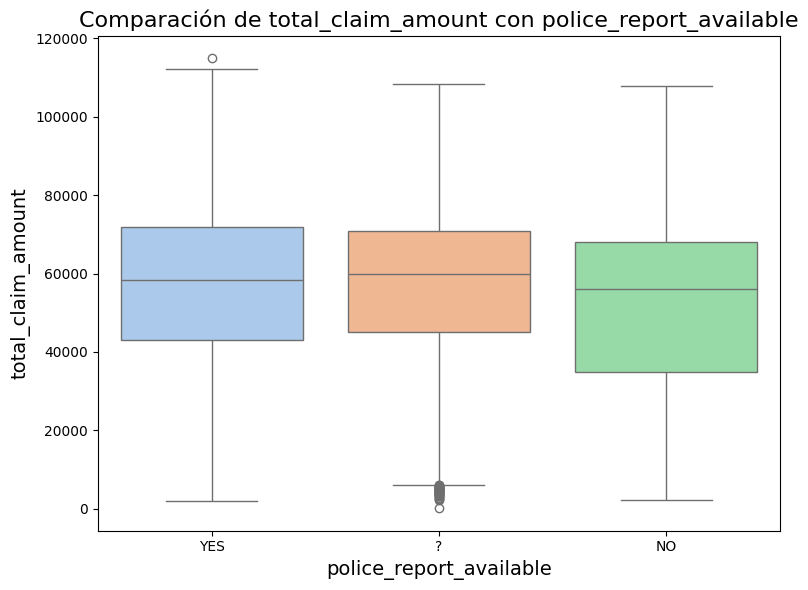

In [53]:
boxplot(df_fraudClaims, numericas, 'police_report_available')

**Comentarios:**  Al analizar la frecuencia de las tres categorías de la columna police_reporte_available (yes, no, y ?) en relación con cada columna numerica, se observa un comportamiento uniforme en todos los casos. No se identifica una diferencia significativa para la categoría de interés (?), lo que sugiere que esta categoría no presenta un patrón claro o distintivo en comparación con las demás.

#### Gráfico de pares

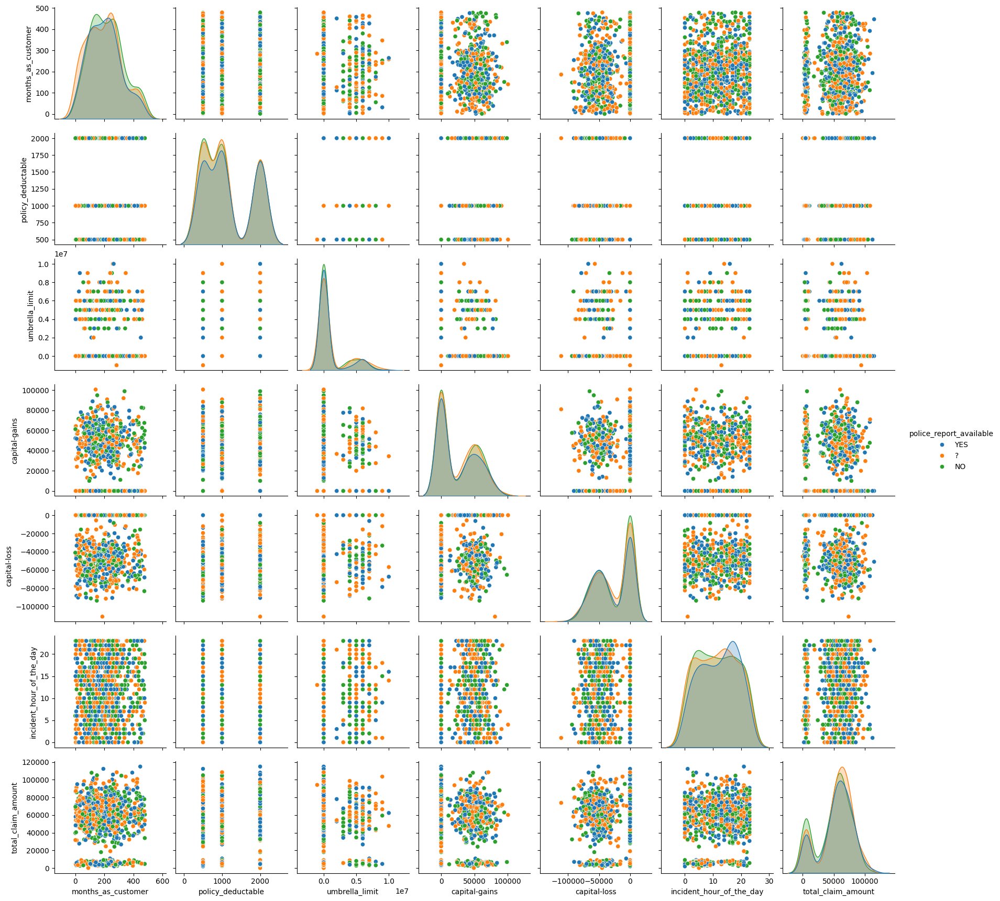

In [54]:
sns.pairplot(df_fraudClaims, hue='police_report_available', vars=numericas)
plt.show()


#### Observaciones


Dado que el valor analizado (?) aparece en varias secciones sin mostrar una relación específica o un patrón distintivo, se ha decidido clasificarlo como una nueva categoría denominada 'No disponible'. Esta decisión se justifica por la cantidad significativa de registros asociados a este valor, lo que sugiere que podría ser relevante mantenerlo como una categoría separada para el análisis.

In [55]:
#Reemplazar '?' con 'Other' en la columna 'police_report_available'
df_fraudClaims['police_report_available'] = df_fraudClaims['police_report_available'].replace('?', 'Not available')


### Para 'authorities_contacted'

Conteo de cada valor único

In [56]:
category_counts = df_fraudClaims['authorities_contacted'].value_counts()
print(category_counts)

authorities_contacted
Police       292
Fire         223
Other        198
Ambulance    196
?             91
Name: count, dtype: int64


#### Gráfico de barras

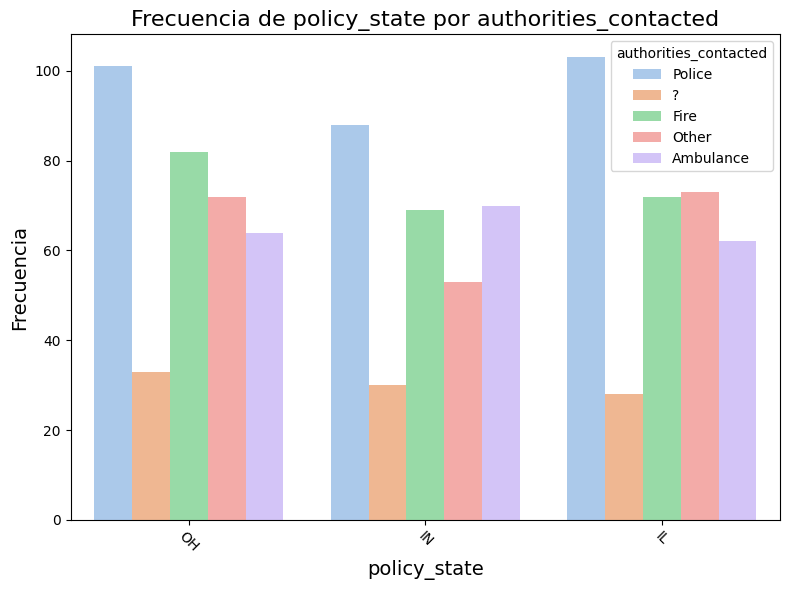

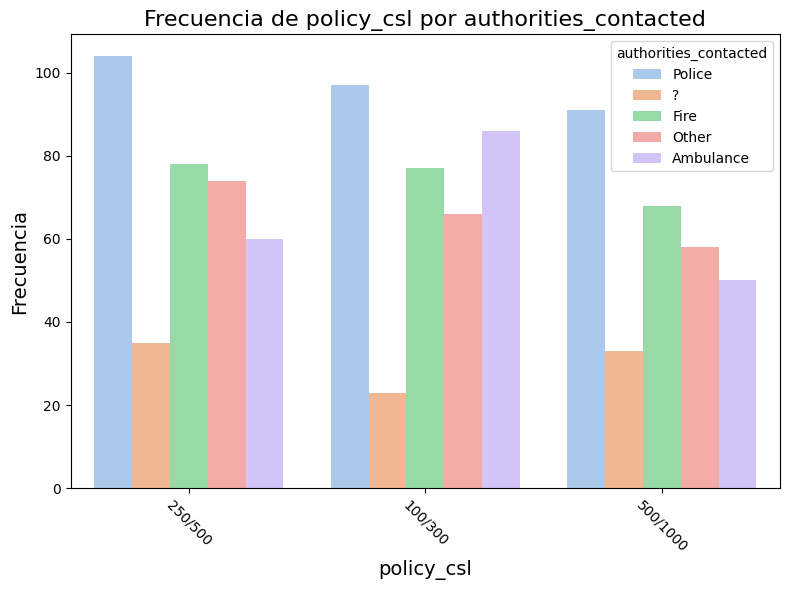

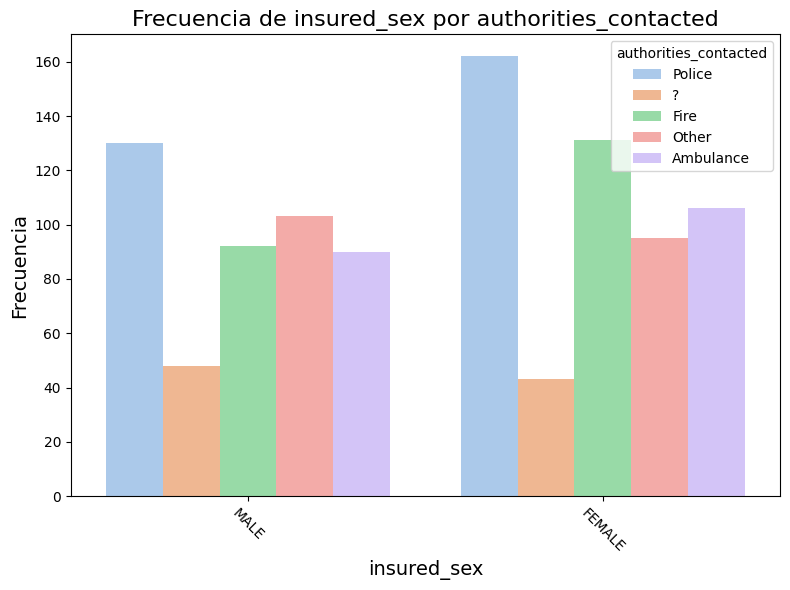

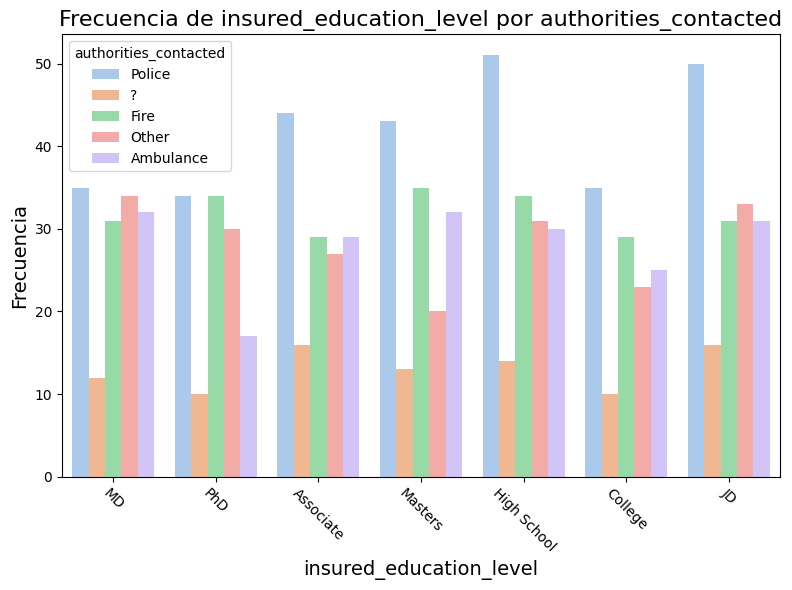

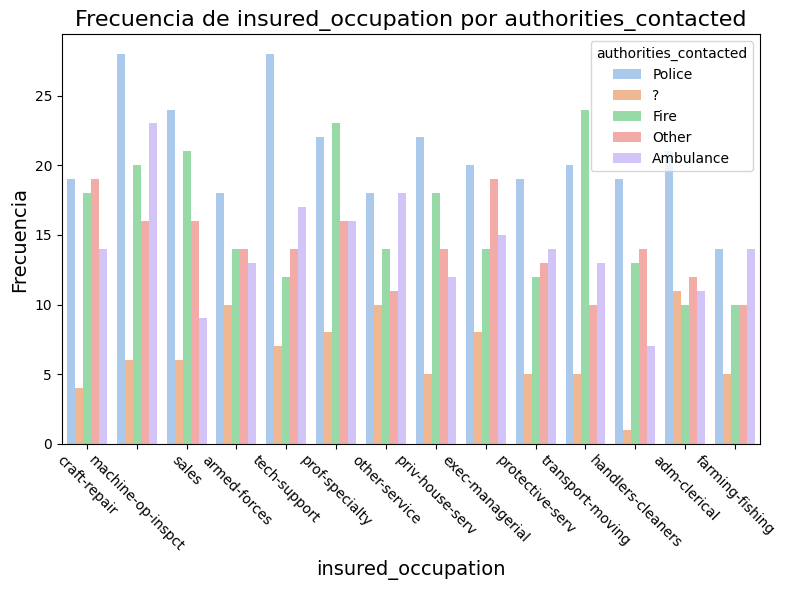

...

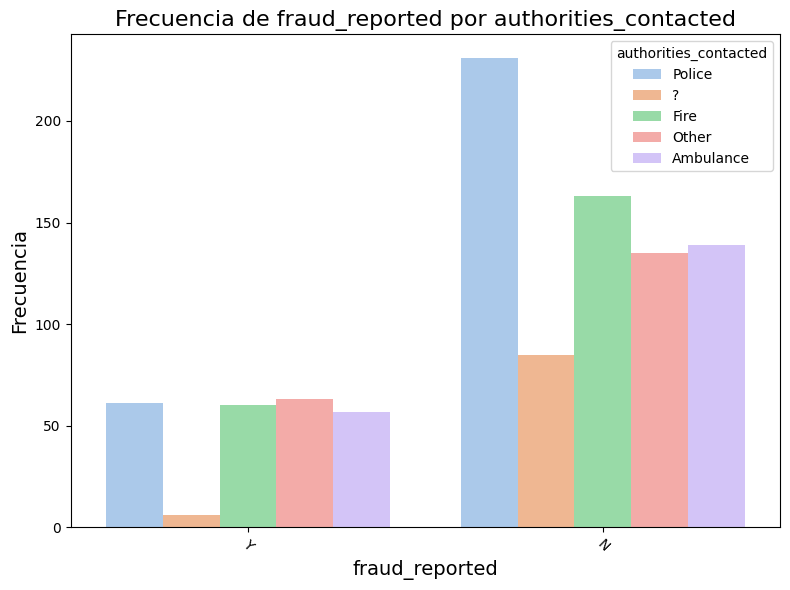

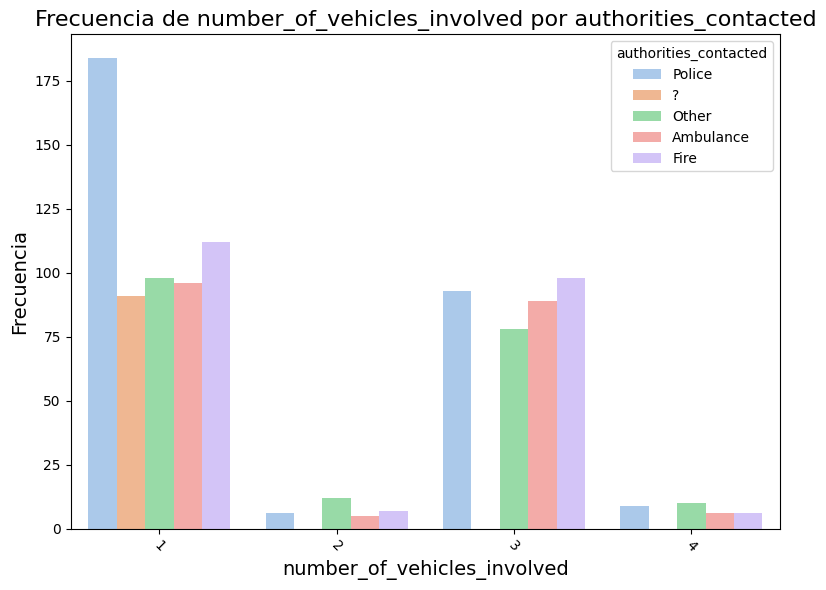

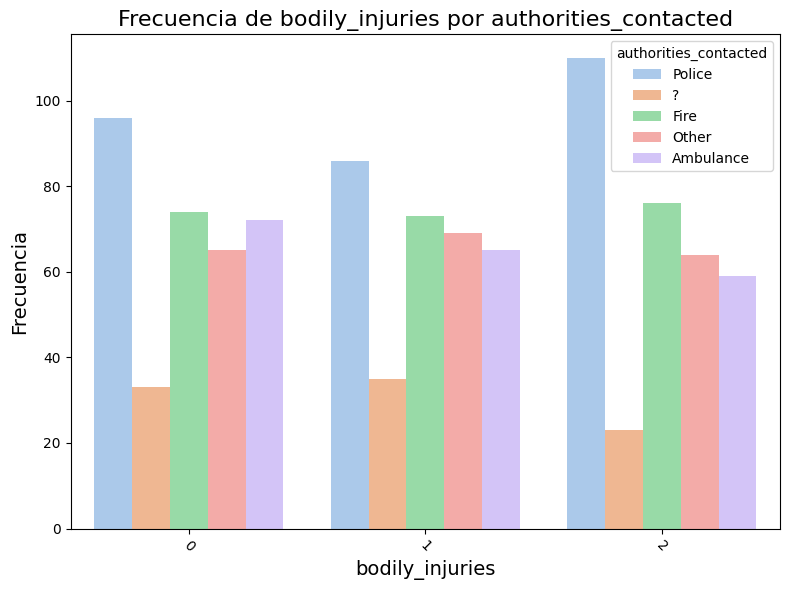

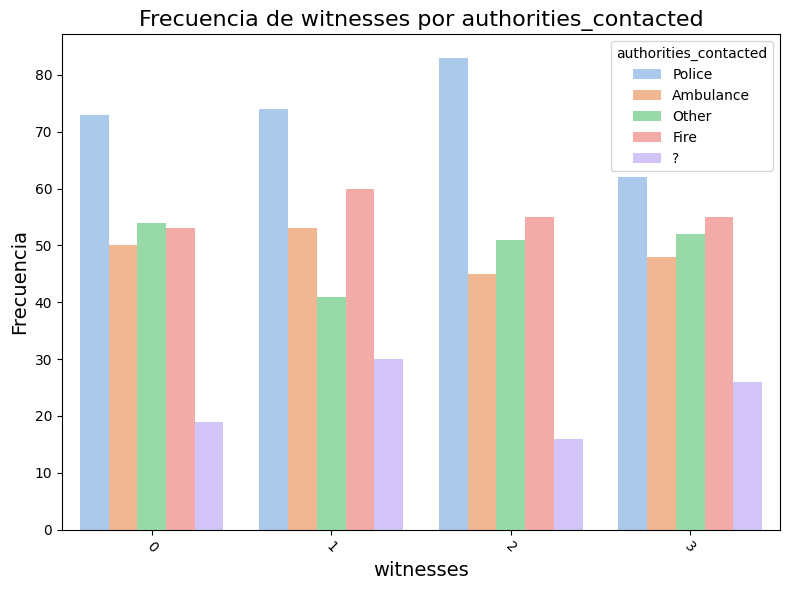

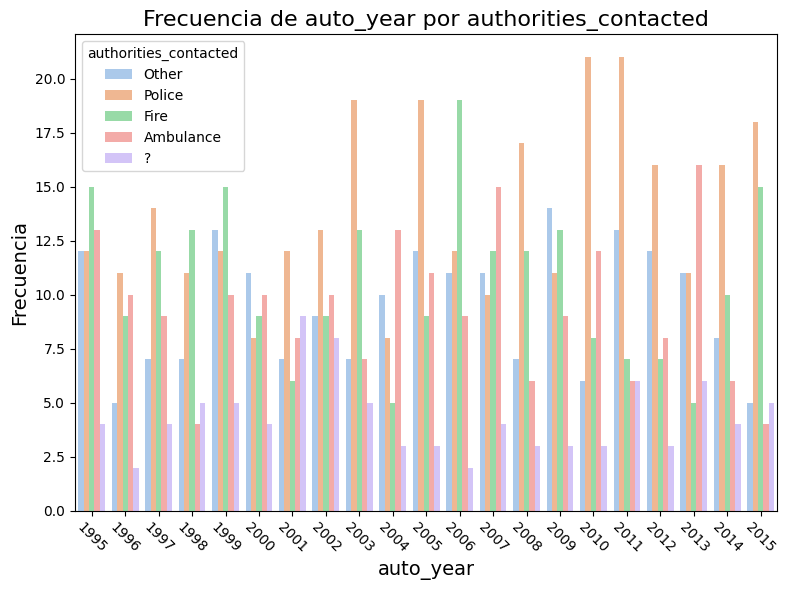

In [57]:
countplot(df_fraudClaims, categoricas, 'authorities_contacted')

**Comentarios:** Al analizar la frecuencia de las cinco categorías de la columna authorities_contacted (police, fire, ambulance, other y ?) en relación con cada columna categórica, se observa un comportamiento uniforme en la mayoría de los casos. A excepcion de:

 - En la columna incident_type se identifica que el valor de '?' solo aparece asociado con los incidentes de tipo vehicle theft y parked car, el mismo caso que se vio al principio (collision_type)

 - En la columan de collision_type se identifica que el valor de '?' solo aparece asociado a other collision

 - De manera similar, en la columna incident_severity, el valor '?' únicamente aparece asociado con las categorías minor damage y trivial damage.

 - De manera similar, en la columna number_of_vehicles_involved, el valor '?' únicamente aparece asociado a la categoria de 1

#### Gráfico de boxplot

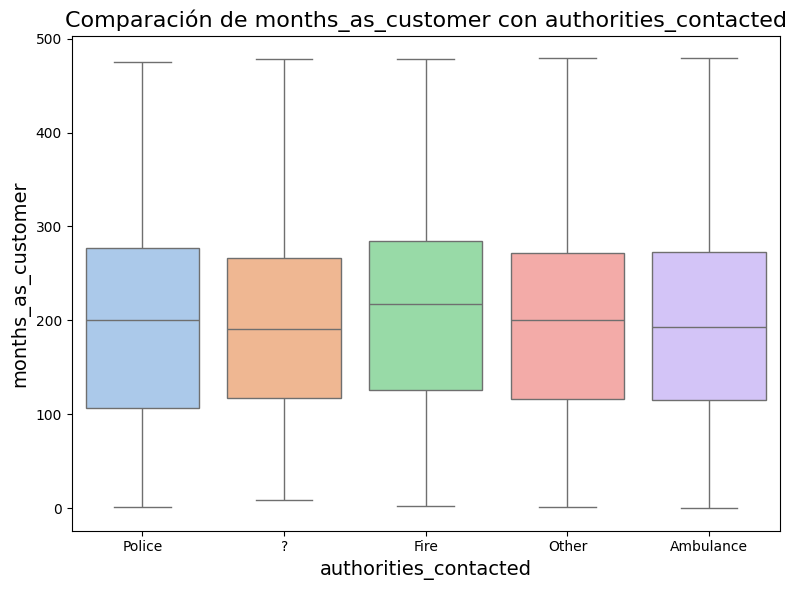

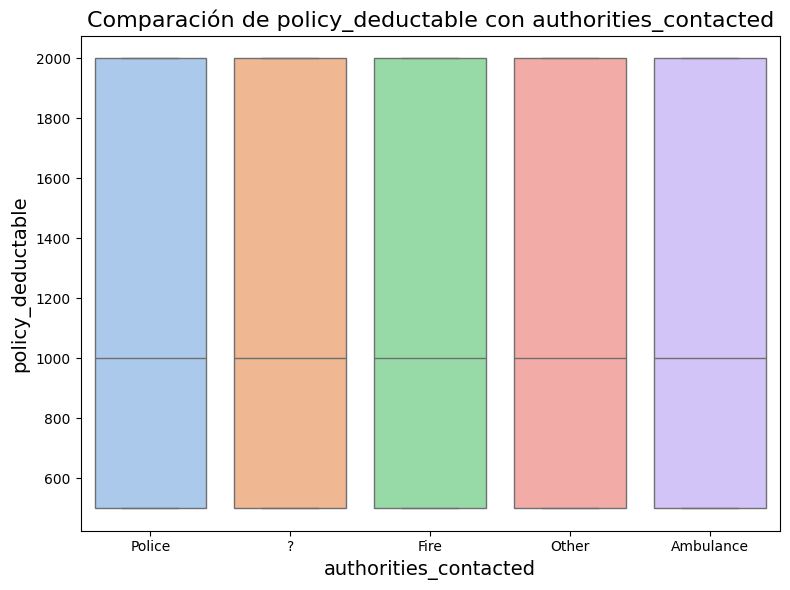

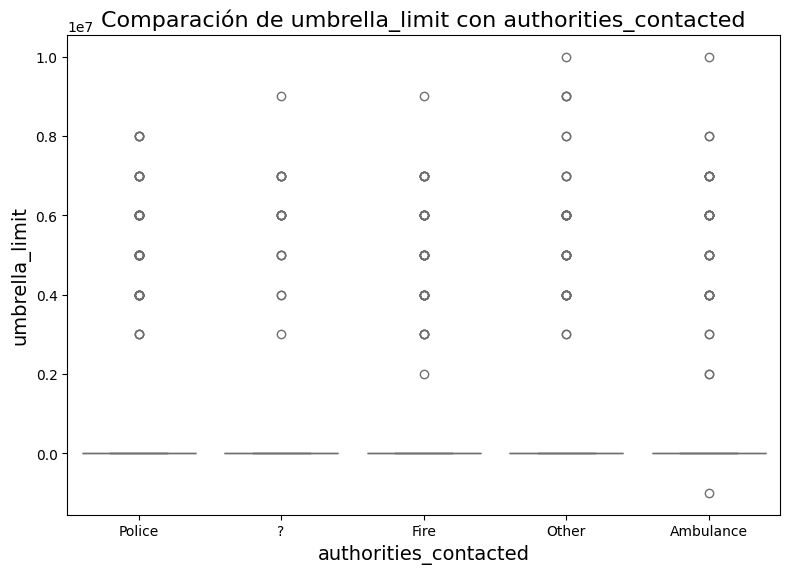

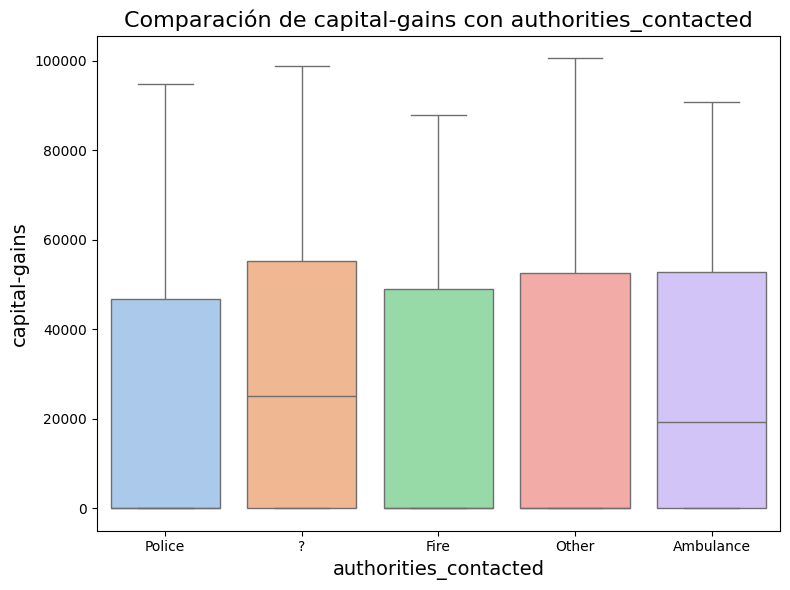

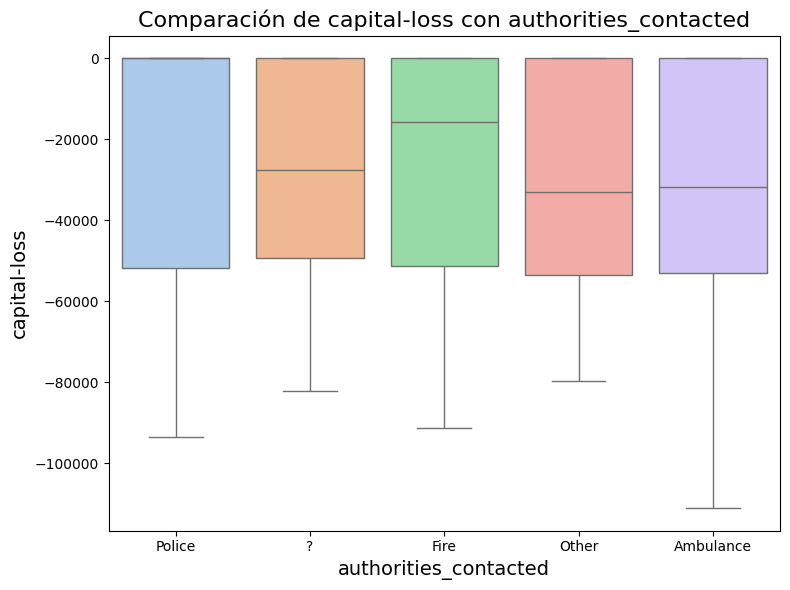

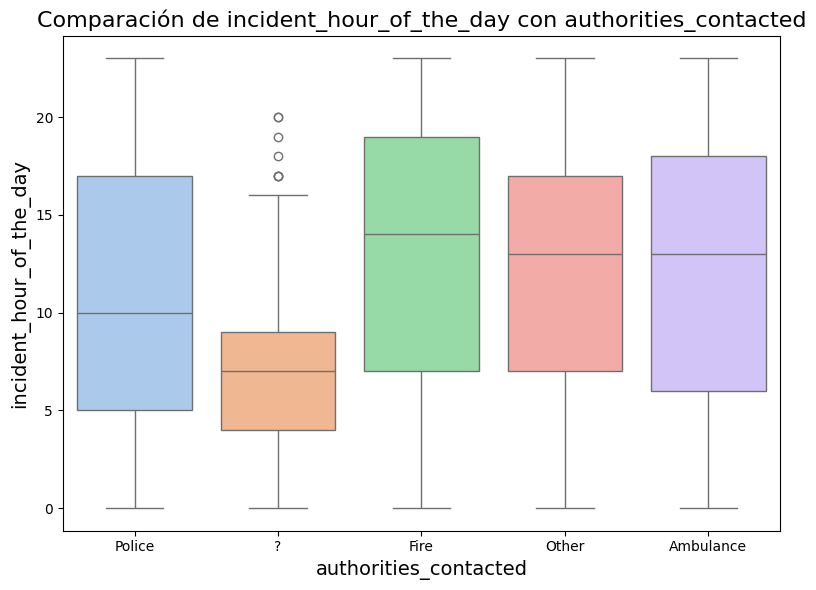

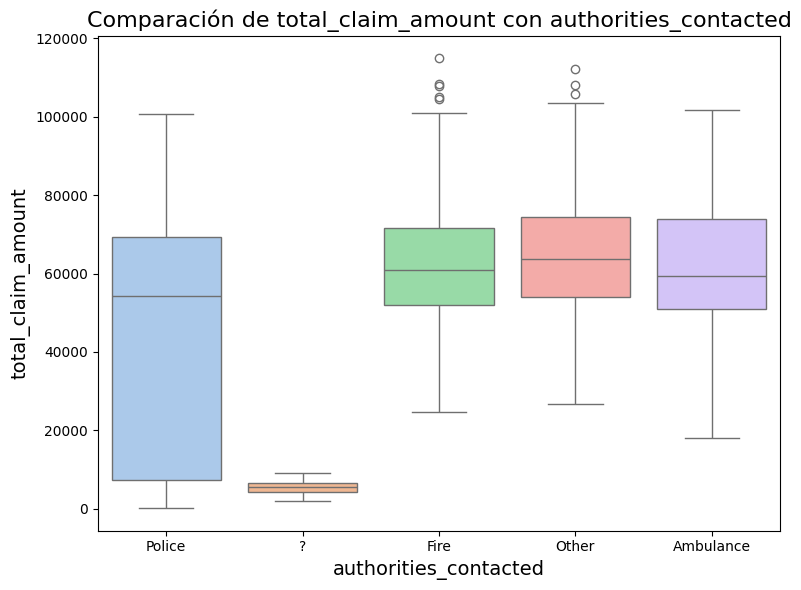

In [58]:
boxplot(df_fraudClaims, numericas, 'authorities_contacted')

**Comentarios:**  Al analizar la frecuencia de las cinco  categorías de la columna authorities_contacted en relación con las columnas numéricas, particularmente aquellas que registran reclamaciones como vehicle_claim, property_claim, injury_claim, entre otras, se observa que el valor '?' está asociado con montos cercanos a 0.

#### Gráfico de pares

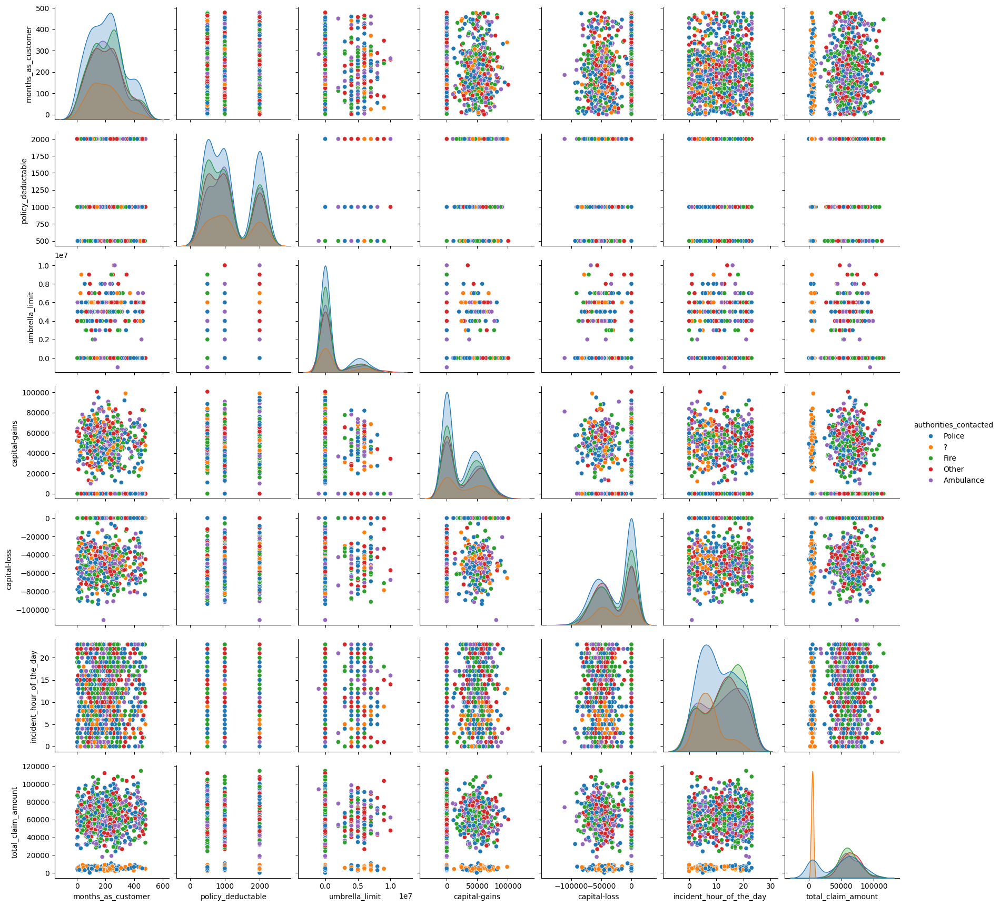

In [59]:
sns.pairplot(df_fraudClaims, hue='authorities_contacted', vars=numericas)
plt.show()


#### Observaciones


Al observar que el valor '?' presenta un patrón similar al encontrado en el análisis de la columna collision_type y que el valor '?' esta presente mayormente con el valor de 'Police', se ha decidido imputar estos valores utilizando el método KNN (K-Nearest Neighbors). Esta técnica permitirá estimar los valores faltantes de manera más precisa, considerando las similitudes con otros registros en el conjunto de datos.

Como el KNN necesita de valores numéricos, es necesario primero ralizar una codificacion de variables para despues hacer esta imputacion de valores '?'

In [60]:
#Reemplazar '?' con valores nulos para hacer la imputacion
df_fraudClaims['authorities_contacted'] = df_fraudClaims['authorities_contacted'].replace('?', np.nan )



In [61]:
df_fraudClaims['authorities_contacted'].value_counts(dropna=False)

,count
authorities_contacted,
Police,292
Fire,223
Other,198
Ambulance,196
NaN,91


---
## Codificación de variables

Para codificar las variables categoricas, se encuentran 2 tipos:

- Ordinales (conllevan un orden, es decir, tienen un orden lógico entre las categorías, como "bajo", "medio", "alto")

- Nominales (no existe orden, es decir, no tienen un orden lógico entre las categorías, como "rojo", "azul", "amarillo")


Elección del codificador:

- Si se tiene variables ordinales (con un orden), **LabelEncoder** puede ser más adecuado.

- Si se  tiene variables categóricas nominales (sin orden), es mejor usar **OneHotEncoder**.


Para el contexto de fraude por reclamaciones se considera:

- Nominales:
['policy_state',
 'policy_csl',
 'insured_sex',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'auto_year']

- Ordinales: 'insured_education_level', 'incident_severity', 'authorities_contacted', (se conserva de esta manera para poder realizar la imputacion con KNN)


- Numericas:
['months_as_customer',
 'policy_deductable',
 'umbrella_limit',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'total_claim_amount]


In [62]:
df_fraudClaims.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   months_as_customer           1000 non-null   int64 
 1   age                          1000 non-null   int64 
 2   policy_state                 1000 non-null   object
 3   policy_csl                   1000 non-null   object
 4   policy_deductable            1000 non-null   int64 
 5   umbrella_limit               1000 non-null   int64 
 6   insured_sex                  1000 non-null   object
 7   insured_education_level      1000 non-null   object
 8   insured_occupation           1000 non-null   object
 9   insured_hobbies              1000 non-null   object
 10  insured_relationship         1000 non-null   object
 11  capital-gains                1000 non-null   int64 
 12  capital-loss                 1000 non-null   int64 
 13  incident_type                1000 

### One Hot Encoder (nominales)

In [63]:
nominales = ['policy_state', 'policy_csl', 'insured_sex', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'auto_year']

In [64]:
len(nominales)

19

In [65]:
df_encoded_one = df_fraudClaims[nominales].copy()

In [66]:
from sklearn.preprocessing import OneHotEncoder

# Inicializar OneHotEncoder
onehot_encoder = OneHotEncoder(drop='first', sparse_output=False)

# Ajustar y transformar todas las columnas categóricas a la vez
encoded_values = onehot_encoder.fit_transform(df_encoded_one)

# Convertir el resultado a un DataFrame con nombres de columna adecuados
encoded_df = pd.DataFrame(encoded_values, columns=onehot_encoder.get_feature_names_out(nominales))

# Concatenar el DataFrame codificado con el original (sin columnas originales)
df_encoded_one = pd.concat([df_encoded_one.reset_index(drop=True), encoded_df], axis=1)

# Eliminar las columnas originales (si solo quieres conservar las codificadas)
df_encoded_one = encoded_df

# Verificar el nuevo DataFrame
df_encoded_one.head()


,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,...,auto_year_2006,auto_year_2007,auto_year_2008,auto_year_2009,auto_year_2010,auto_year_2011,auto_year_2012,auto_year_2013,auto_year_2014,auto_year_2015
0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### Laber Encoder

In [67]:
ordinales = ['incident_severity','insured_education_level', 'authorities_contacted']

In [68]:
len(ordinales)

3

In [69]:
df_encoded_label = df_fraudClaims[ordinales].copy()

In [70]:
#Diccionario manual
diccionario_authorities = {
    'Police': 0,
    'Fire': 1,
    'Ambulance': 2,
    'Other': 3,
}

#Codificar las categorías textuales a números usando el diccionario
df_encoded_label['authorities_contacted'] = df_encoded_label['authorities_contacted'].map(diccionario_authorities)

In [71]:
from sklearn.preprocessing import LabelEncoder

# Crear un objeto LabelEncoder
label_encoder = LabelEncoder()

# Aplicar Label Encoding a cada columna
for col in df_encoded_label.columns:
    if col != 'authorities_contacted':  # Excluir la columna 'authorities_contacted'
        df_encoded_label[col] = label_encoder.fit_transform(df_encoded_label[col])

# Verificar el resultado
df_encoded_label.head()


,incident_severity,insured_education_level,authorities_contacted
0,0,4,0.0
1,1,4,0.0
2,1,6,0.0
3,0,6,0.0
4,1,0,NaN


In [72]:
category_counts = df_encoded_label['authorities_contacted'].value_counts(dropna=False)
category_counts

,count
authorities_contacted,
0.0,292
1.0,223
3.0,198
2.0,196
NaN,91


### Variables Numéricas

In [73]:
numericas

['months_as_customer',
 'policy_deductable',
 'umbrella_limit',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'total_claim_amount']

In [74]:
len(numericas)

7

#### Escalado de variables numericas

**Observaciones:** Se realiza un escalado con minMax para tener una escala en comun, donde el minimo es 0 y el maximo es 01, ya que la mayoria de las categorias codificadas estan de esa manera

In [75]:
from sklearn.preprocessing import MinMaxScaler

df_numericas = df_fraudClaims[numericas].copy()

# Crear el escalador MinMax
scaler = MinMaxScaler()

# Ajustar y transformar los datos
df_numericas_normalizado = pd.DataFrame(
    scaler.fit_transform(df_numericas),
    columns=df_numericas.columns
)


### Data Frame codificado (nominales, ordinales y numéricas)

In [76]:
df_codificado = pd.concat([df_encoded_one, df_encoded_label, df_numericas_normalizado], axis=1)
df_codificado

,policy_state_IN,policy_state_OH,policy_csl_250/500,policy_csl_500/1000,insured_sex_MALE,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,...,incident_severity,insured_education_level,authorities_contacted,months_as_customer,policy_deductable,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,total_claim_amount
0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0,4,0.0,0.684760,0.333333,0.090909,0.530348,1.000000,0.217391,0.622801
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1,4,0.0,0.475992,1.000000,0.545455,0.000000,1.000000,0.347826,0.043285
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1,6,0.0,0.279749,1.000000,0.545455,0.349254,1.000000,0.304348,0.300906
3,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0,6,0.0,0.534447,1.000000,0.636364,0.486567,0.438344,0.217391,0.551298
4,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1,0,NaN,0.475992,0.333333,0.636364,0.656716,0.585959,0.869565,0.055739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1,5,1.0,0.006263,0.333333,0.090909,0.000000,1.000000,0.869565,0.758579
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,6,1.0,0.594990,0.333333,0.090909,0.705473,1.000000,1.000000,0.943912
997,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1,5,0.0,0.271399,0.000000,0.363636,0.349254,1.000000,0.173913,0.587006
998,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0,0,3.0,0.956159,1.000000,0.545455,0.000000,1.000000,0.086957,0.408291


In [77]:
df_codificado['authorities_contacted'].value_counts(dropna=False)


,count
authorities_contacted,
0.0,292
1.0,223
3.0,198
2.0,196
NaN,91


### Implementación de KNN

In [78]:
from sklearn.impute import KNNImputer

# Configura el número de vecinos para KNN
knn_imputer = KNNImputer(n_neighbors=5)

# Aplica el imputador
df_imputed = pd.DataFrame(knn_imputer.fit_transform(df_codificado), columns=df_codificado.columns)

# Asegúrate de que la columna authorities_contacted sea categórica después de la imputación
df_imputed['authorities_contacted'] = df_imputed['authorities_contacted'].round().astype(int)


In [79]:
df_imputed['authorities_contacted'].value_counts(dropna=False)

,count
authorities_contacted,
0,332
1,268
2,202
3,198


**Comentarios:** Se puede observar que el KNN relleno la mayoria de los valores nulos a la categoria 0, el cual es 'Police', esto se puede verificar a las graficas de barras, ya que los registros que estaban como '?' se encontraban presentes con la categoria '?'

### Regresar al dataset original extrayendo solo la columna imputada

In [80]:
df_fraudClaims['authorities_contacted'] = df_imputed['authorities_contacted']

In [81]:
df_fraudClaims.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,OH,250/500,1000,0,MALE,MD,craft-repair,sleeping,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,IN,250/500,2000,5000000,MALE,MD,machine-op-inspct,reading,...,0,Not available,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,OH,100/300,2000,5000000,FEMALE,PhD,sales,board-games,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,IL,250/500,2000,6000000,FEMALE,PhD,armed-forces,board-games,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,IL,500/1000,1000,6000000,MALE,Associate,sales,board-games,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


---
## Seleccion de caracteristicas

### Univariado ANOVA (númericas) CHI2 (categoricas)

#### CHI2 (categoricas)

##### Conjunto de datos codificado (mayormente por One Hot Encoder)

In [82]:
from sklearn.feature_selection import SelectKBest, chi2

df = pd.concat([df_encoded_one, df_encoded_label], axis=1)
X = df_imputed[df.columns]
X = X.drop(columns=['fraud_reported_Y'])

y = df_imputed['fraud_reported_Y']  # Variable objetivo

# Selección de características usando Chi-cuadrada
chi2_selector = SelectKBest(score_func=chi2, k='all')
chi2_selector.fit(X, y)

# Obtener los resultados de Chi-cuadrada
chi2_scores = chi2_selector.scores_
chi2_pvalues = chi2_selector.pvalues_

# Crear un DataFrame con los resultados
chi2_results = pd.DataFrame({
    'Feature': X.columns,  # Usar las columnas originales de X
    'Chi2 Score': chi2_scores,
    'P-value': chi2_pvalues
}).sort_values(by='P-value')

# Filtrar características significativas (P-valor < 0.05)
significant_categorical = chi2_results[chi2_results['P-value'] < 0.05]['Feature']

# Mostrar resultados
print("Características significativas según Chi-cuadrada:")
print(significant_categorical)


Características significativas según Chi-cuadrada:
143                         incident_severity
22                      insured_hobbies_chess
23                  insured_hobbies_cross-fit
45             collision_type_Other Collision
145                     authorities_contacted
44                incident_type_Vehicle Theft
42                   incident_type_Parked Car
21                    insured_hobbies_camping
28                   insured_hobbies_kayaking
46              collision_type_Rear Collision
7          insured_occupation_exec-managerial
26                       insured_hobbies_golf
131                            auto_year_2004
53                          incident_state_WV
49                          incident_state_OH
43     incident_type_Single Vehicle Collision
24                    insured_hobbies_dancing
Name: Feature, dtype: object


**Comentarios:** Se puede observar la caractersitica general de 'incident_severity', 'authorities_contacted' asi como caracterisitcas especificas como algunos hobbies, el estado, el tipo de accidente entre otros

##### Conjunto de datos codificado con Label Encoder

In [83]:
from sklearn.preprocessing import LabelEncoder

df_fraudClaims_label = df_fraudClaims[categoricas]

# Inicializar el LabelEncoder
label_encoder = LabelEncoder()

# Aplicar LabelEncoder a cada columna categórica
for col in df_fraudClaims_label.columns:
    df_fraudClaims_label[col] = label_encoder.fit_transform(df_fraudClaims_label[col])

# Mostrar el DataFrame transformado
df_fraudClaims_label

,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,...,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported,number_of_vehicles_involved,bodily_injuries,witnesses,auto_year
0,2,1,1,4,2,17,0,2,3,0,...,1,2,2,10,1,1,0,1,2,9
1,1,1,1,4,6,15,2,3,1,1,...,5,1,1,8,12,1,0,0,0,12
2,2,0,0,6,11,2,3,0,2,1,...,1,0,0,4,30,0,2,2,3,12
3,0,1,0,6,1,2,4,2,0,0,...,0,1,0,3,34,1,0,1,2,19
4,0,2,1,0,11,2,4,3,1,1,...,0,0,0,0,31,0,0,0,1,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2,2,0,5,2,13,4,2,0,1,...,4,2,1,6,6,0,0,0,1,11
996,0,0,0,6,9,17,5,2,2,0,...,3,2,1,13,28,0,0,2,3,20
997,2,1,0,5,1,3,2,0,3,1,...,0,1,2,11,19,0,2,2,3,1
998,0,2,1,0,5,0,5,2,2,0,...,0,1,2,1,5,0,0,0,1,3


In [84]:
from sklearn.feature_selection import SelectKBest, chi2

# Eliminar variables específicas

X = df_fraudClaims_label.drop(columns=['fraud_reported'])  # Características
y = df_fraudClaims_label['fraud_reported']  # Variable objetivo


# Selección de características usando Chi-cuadrada
chi2_selector = SelectKBest(score_func=chi2, k='all')
chi2_selector.fit(X, y)

# Obtener los resultados de Chi-cuadrada
chi2_scores = chi2_selector.scores_
chi2_pvalues = chi2_selector.pvalues_

# Crear un DataFrame con los resultados
chi2_results = pd.DataFrame({
    'Feature': X.columns,  # Usar las columnas originales de X
    'Chi2 Score': chi2_scores,
    'P-value': chi2_pvalues
}).sort_values(by='P-value')

# Filtrar características significativas (P-valor < 0.05)
significant_categorical = chi2_results[chi2_results['P-value'] < 0.05]['Feature']

# Mostrar resultados
print("Características significativas según Chi-cuadrada:")
print(significant_categorical)

Características significativas según Chi-cuadrada:
9         incident_severity
10    authorities_contacted
5           insured_hobbies
Name: Feature, dtype: object


**Comentarios:** Con la codificacion de Label Enoder se hacen presentes 3 columnas 'incident_severity', 'authorities_contacted' y ' insured_hobbies'

#### ANOVA (númericas)

In [85]:
from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
import pandas as pd

X = df_numericas_normalizado
y = df_fraudClaims_label['fraud_reported']


# Aplicar ANOVA F-test a las variables numéricas
anova_selector = SelectKBest(score_func=f_classif, k='all')
anova_selector.fit(X, y)

# Obtener los resultados de ANOVA F-test
anova_scores = anova_selector.scores_
anova_pvalues = anova_selector.pvalues_

anova_results = pd.DataFrame({
    'Feature': X.columns,
    'F Score': anova_scores,
    'P-value': anova_pvalues
}).sort_values(by='P-value')

# Filtrar características significativas (P-valor < 0.05)
significant_numerical = anova_results[anova_results['P-value'] < 0.05]['Feature']

selected_features = significant_numerical.tolist()
print("Características seleccionadas:")
print(selected_features)


Características seleccionadas:
['total_claim_amount']


**Comentarios:** Para las variables numericas de acuero con ANOVA solo es signifcante la columna de 'total_claim_amount'

### Logit

#### Conjunto de datos codificado (mayormente por One Hot Encoder)

In [86]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

# 1. Separar características (X) y variable objetivo (y)
X = df_imputed.drop(columns=['fraud_reported_Y'])  # Características
y = df_imputed['fraud_reported_Y']  # Variable objetivo

# 2. Dividir en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# 3. Agregar constante al conjunto de entrenamiento
X_train = sm.add_constant(X_train)

# 4. Ajustar modelo de regresión logística al conjunto de entrenamiento
logit_model = sm.Logit(y_train, X_train)
result = logit_model.fit()

# 5. Mostrar resumen del modelo
print(result.summary())

# 6. Seleccionar variables significativas en el conjunto de entrenamiento (p-valor < 0.05)
significant_vars = result.pvalues[result.pvalues < 0.05].index
print(f"Variables significativas: {significant_vars.tolist()}")

# 7. Evaluar las variables seleccionadas en el conjunto de prueba
X_test = sm.add_constant(X_test)  # Agregar constante al conjunto de prueba
X_test_significant = X_test[significant_vars]

#print("\nConjunto de prueba con las variables seleccionadas:")
#print(X_test_significant.head())


Optimization terminated successfully.
         Current function value: 0.239586
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:       fraud_reported_Y   No. Observations:                  800
Model:                          Logit   Df Residuals:                      661
Method:                           MLE   Df Model:                          138
Date:                Mon, 03 Feb 2025   Pseudo R-squ.:                  0.5718
Time:                        23:51:50   Log-Likelihood:                -191.67
converged:                       True   LL-Null:                       -447.66
Covariance Type:            nonrobust   LLR p-value:                 2.105e-44
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
const                                     -1.4437   

In [87]:
significant_vars

Index(['insured_occupation_handlers-cleaners', 'insured_hobbies_chess',
       'insured_hobbies_cross-fit', 'insured_hobbies_sleeping',
       'insured_relationship_wife', 'collision_type_Side Collision',
       'property_damage_Not available', 'police_report_available_YES',
       'witnesses_1', 'witnesses_2', 'witnesses_3', 'auto_year_2000',
       'auto_year_2004', 'auto_year_2006', 'auto_year_2011',
       'incident_severity', 'months_as_customer', 'umbrella_limit'],
      dtype='object')

**Observaciones:** Con Logit Regression Results se identifican columnas específicas que detallan características particulares del asegurado, como su ocupación, hobbies y relaciones familiares. Además, se incluyen variables relacionadas con el tipo de colisión, disponibilidad de reportes policiales, daños a la propiedad, y detalles del vehículo (modelo y año). También destacan características sobre la severidad del incidente, el número de testigos, y la antigüedad como cliente.

#### Conjunto de datos codificado con Label Encoder

In [88]:
df_fraudClaims_label = pd.concat([df_fraudClaims_label, df_numericas_normalizado], axis=1)

In [89]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm

# 1. Separar características (X) y variable objetivo (y)
X = df_fraudClaims_label.drop(columns=['fraud_reported'])  # Características
y = df_fraudClaims_label['fraud_reported']  # Variable objetivo

# 2. Dividir en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# 3. Agregar constante al conjunto de entrenamiento
X_train = sm.add_constant(X_train)

# 4. Ajustar modelo de regresión logística al conjunto de entrenamiento
logit_model = sm.Logit(y_train, X_train)
result = logit_model.fit()

# 5. Mostrar resumen del modelo
print(result.summary())

# 6. Seleccionar variables significativas en el conjunto de entrenamiento (p-valor < 0.05)
significant_vars = result.pvalues[result.pvalues < 0.05].index
print(f"Variables significativas: {significant_vars.tolist()}")

# 7. Evaluar las variables seleccionadas en el conjunto de prueba
X_test = sm.add_constant(X_test)  # Agregar constante al conjunto de prueba
X_test_significant = X_test[significant_vars]

#print("\nConjunto de prueba con las variables seleccionadas:")
#print(X_test_significant.head())


Optimization terminated successfully.
         Current function value: 0.459301
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:         fraud_reported   No. Observations:                  800
Model:                          Logit   Df Residuals:                      771
Method:                           MLE   Df Model:                           28
Date:                Mon, 03 Feb 2025   Pseudo R-squ.:                  0.1792
Time:                        23:52:04   Log-Likelihood:                -367.44
converged:                       True   LL-Null:                       -447.66
Covariance Type:            nonrobust   LLR p-value:                 1.582e-20
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                          -0.1085      0.882     -0.123      0.902   

In [90]:
significant_vars

Index(['insured_hobbies', 'incident_severity'], dtype='object')

**Observaciones:**  Tras la codificación utilizando Label Encoding, las características relevantes se han reducido y generalizado a dos variables principales: insured_hobbies e incident_severity.

### Random Forest

#### Conjunto de datos codificado (mayormente por One Hot Encoder)

In [91]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

# 1. Crear el modelo Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# 2. Entrenar el modelo
# 1. Separar características (X) y variable objetivo (y)
X = df_imputed.drop(columns=['fraud_reported_Y'])  # Características
y = df_imputed['fraud_reported_Y']  # Variable objetivo
rf.fit(X, y)

# 3. Obtener la importancia de las características
importances = rf.feature_importances_

# Crear un DataFrame para visualizar la importancia
import pandas as pd
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print(feature_importances)

# 4. Seleccionar características más importantes
# Usar SelectFromModel para seleccionar automáticamente
selector = SelectFromModel(rf, threshold=0.01, prefit=True)
X_selected = selector.transform(X)

# Mostrar las características seleccionadas
selected_features = X.columns[selector.get_support()]
print("Características seleccionadas:", selected_features)


                      Feature  Importance
143         incident_severity    0.149576
22      insured_hobbies_chess    0.060730
152        total_claim_amount    0.046527
146        months_as_customer    0.042367
151  incident_hour_of_the_day    0.030549
..                        ...         ...
84             auto_model_CRV    0.000784
92          auto_model_Fusion    0.000762
111         auto_model_Ultima    0.000728
82          auto_model_Accord    0.000647
107            auto_model_RSX    0.000595

[153 rows x 2 columns]
Características seleccionadas: Index(['insured_hobbies_chess', 'insured_hobbies_cross-fit',
       'incident_severity', 'insured_education_level', 'authorities_contacted',
       'months_as_customer', 'policy_deductable', 'umbrella_limit',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'total_claim_amount'],
      dtype='object')


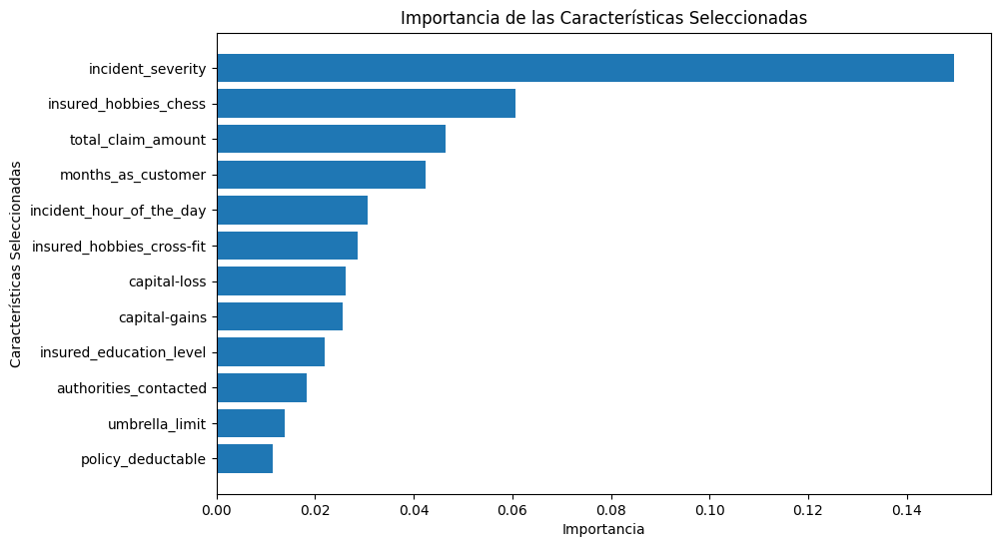

In [92]:
# Filtramos las importancias correspondientes a las características seleccionadas
selected_importances = feature_importances[feature_importances['Feature'].isin(selected_features)]

# Graficar las características seleccionadas y sus importancias
plt.figure(figsize=(10, 6))
plt.barh(selected_importances['Feature'], selected_importances['Importance'])
plt.xlabel('Importancia')
plt.ylabel('Características Seleccionadas')
plt.title('Importancia de las Características Seleccionadas')
plt.gca().invert_yaxis()  # Invertir el eje y para que la más importante esté arriba
plt.show()



**Observaciones:** Mediante la selección de características utilizando Random Forest, se han identificado características que  abarcan información clave sobre los hobbies del asegurado, la severidad del incidente, el nivel educativo, las interacciones con las autoridades, detalles de la póliza, y variables económicas.

En comparacion con los resultados de Logit Regression Results, existen columnas similares como la de los hobbies, incident_severit y months_as_customer, las demas son diferentes

#### Conjunto de datos codificado con Label Encoder

In [93]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

# 1. Crear el modelo Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)

# 2. Entrenar el modelo
X = df_fraudClaims_label.drop(columns=['fraud_reported'])  # Características
y = df_fraudClaims_label['fraud_reported']  # Variable objetivo
rf.fit(X, y)

# 3. Obtener la importancia de las características
importances = rf.feature_importances_

# Crear un DataFrame para visualizar la importancia
import pandas as pd
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print(feature_importances)

# 4. Seleccionar características más importantes
# Usar SelectFromModel para seleccionar automáticamente
selector = SelectFromModel(rf, threshold='median', prefit=True)
X_selected = selector.transform(X)

# Mostrar las características seleccionadas
selected_features = X.columns[selector.get_support()]
print("Características seleccionadas:", selected_features)

                        Feature  Importance
9             incident_severity    0.195575
5               insured_hobbies    0.094331
27           total_claim_amount    0.064223
21           months_as_customer    0.062365
26     incident_hour_of_the_day    0.045343
4            insured_occupation    0.042081
16                   auto_model    0.041044
20                    auto_year    0.040035
15                    auto_make    0.036692
25                 capital-loss    0.035959
24                capital-gains    0.033017
11               incident_state    0.029277
12                incident_city    0.027603
3       insured_education_level    0.027185
6          insured_relationship    0.026407
10        authorities_contacted    0.021277
19                    witnesses    0.020377
23               umbrella_limit    0.018375
0                  policy_state    0.017083
1                    policy_csl    0.016738
8                collision_type    0.015640
18              bodily_injuries 

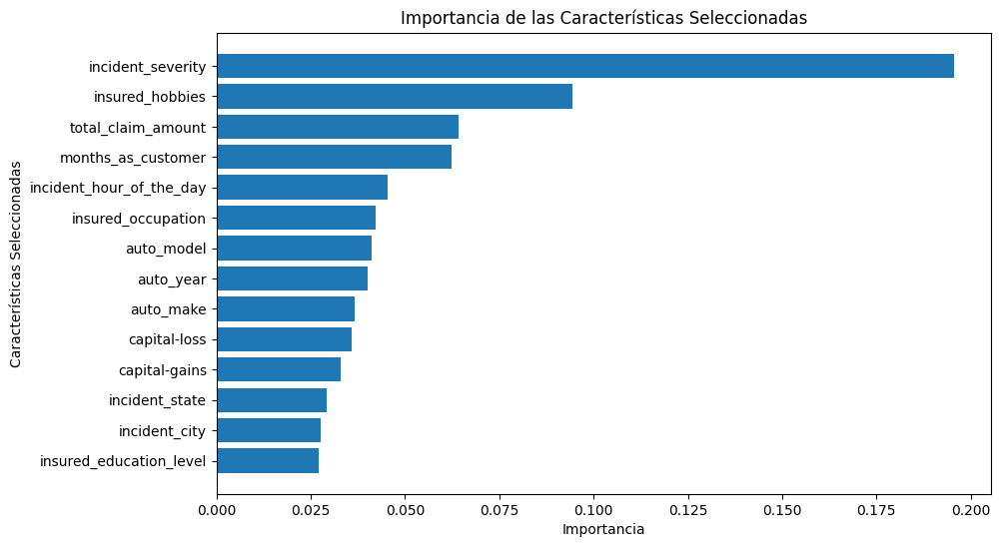

In [94]:
# Filtramos las importancias correspondientes a las características seleccionadas
selected_importances = feature_importances[feature_importances['Feature'].isin(selected_features)]

# Graficar las características seleccionadas y sus importancias
plt.figure(figsize=(10, 6))
plt.barh(selected_importances['Feature'], selected_importances['Importance'])
plt.xlabel('Importancia')
plt.ylabel('Características Seleccionadas')
plt.title('Importancia de las Características Seleccionadas')
plt.gca().invert_yaxis()  # Invertir el eje y para que la más importante esté arriba
plt.show()


**Comentarios:** Tras realizar la codificación con Label Encoding y aplicar Random Forest para la selección de características, se generalizan columnas que se hiceron presentes en los resultados snteriores

### Nuevo conjunto de datos

**Comentarios:** De acuerdo con el análisis de selección de características univariadas (ANOVA y Chi-cuadrado), y considerando los resultados obtenidos con los modelos de regresión logística y Random Forest, se decide optar por la selección de características basada en Random Forest asi como el cobnjunto de datos codificado con label encoder para generalizar las variables.

In [95]:
selected_features

Index(['insured_education_level', 'insured_occupation', 'insured_hobbies',
       'incident_severity', 'incident_state', 'incident_city', 'auto_make',
       'auto_model', 'auto_year', 'months_as_customer', 'capital-gains',
       'capital-loss', 'incident_hour_of_the_day', 'total_claim_amount'],
      dtype='object')

In [96]:
df_modelo_fraude_base = df_fraudClaims_label[selected_features]
df_modelo_fraude_base['fraud_reported'] = df_fraudClaims_label['fraud_reported']

---
## Desbalanceo de clases

En muchos problemas de clasificación, la distribución de las clases está desequilibrada. Esto significa que una clase (la minoritaria) tiene significativamente menos ejemplos que otra (la mayoritaria).
Nos pueden traer porblemas como:

- Clasificación mayoritaria: Los modelos tienden a predecir la clase mayoritaria con mayor frecuencia. Esto puede llevar a una baja precisión en la detección de la clase minoritaria.

- Sobreajuste (overfitting): Los modelos más complejos pueden aprender a identificar los pocos ejemplos de la clase minoritaria en los datos de entrenamiento.

**Soluciones:**

- Sobreamuestreo (oversampling) de la clase minoritaria: agregar más copias de la clase minoritaria, esta técnica puede promover el overfitting del modelo.

- Sub-muestreo (undersampling) de la clase mayoritaria: no seleccionar todos los casos de la clase mayoritaria y seleccionar un porcentaje de la misma; esta técnica puede promover el underfitting del modelo.

- Generar una muestra sintética: generar en forma artificial registros de la clase minoritaria. Un algoritmo muy popular y con muy buena performance es el algoritmo SMOTE (por sus siglas en inglés, Synthetic Minority Oversampling Technique).

Es importante destacar que no es necesario forzar un balanceo 50-50 ya que el mismo podría deformar excesivamente la distribución de los datos.

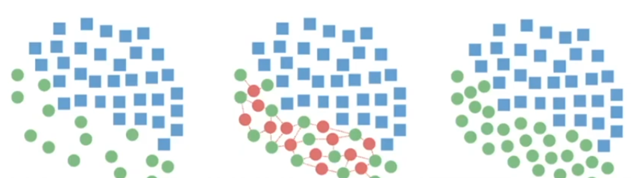

In [100]:
df_modelo_fraude_base['fraud_reported'].value_counts(dropna=False)

,count
fraud_reported,
0,753
1,247


**Comentarios:**
En la seccion de *Modelos de clasificacion* se va a ejecutar las posibles soluciones al desbalanceo para comparar su rendiminto

---
## Modelos de clasificacion

### Regresion Logisitca

#### Conjunto de datos base

##### Validacion simple (80% entranamiento y 20% prueba)

In [101]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creamos el modelo de regresión logística
modelo = LogisticRegression()

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.77      0.88      0.82       145
           1       0.49      0.31      0.38        55

    accuracy                           0.72       200
   macro avg       0.63      0.59      0.60       200
weighted avg       0.69      0.72      0.70       200

Matriz de confusión:
 [[127  18]
 [ 38  17]]
True Negatives (TN): 127
False Positives (FP): 18
False Negatives (FN): 38
True Positives (TP): 17


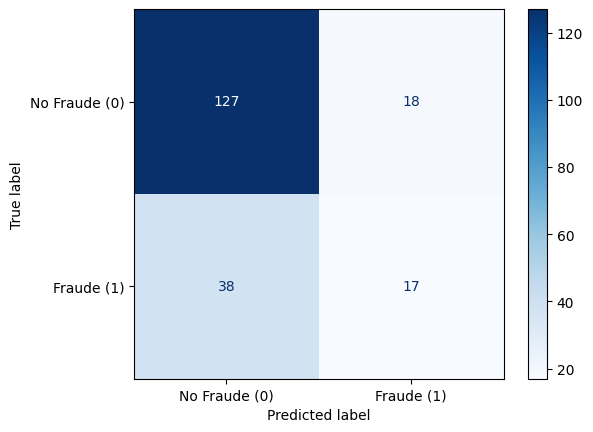

In [102]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")


##### Estratificado

In [103]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Creamos el modelo de regresión logística
modelo = LogisticRegression()

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.82      0.91      0.87       151
           1       0.59      0.39      0.47        49

    accuracy                           0.79       200
   macro avg       0.71      0.65      0.67       200
weighted avg       0.77      0.79      0.77       200

Matriz de confusión:
 [[138  13]
 [ 30  19]]
True Negatives (TN): 138
False Positives (FP): 13
False Negatives (FN): 30
True Positives (TP): 19


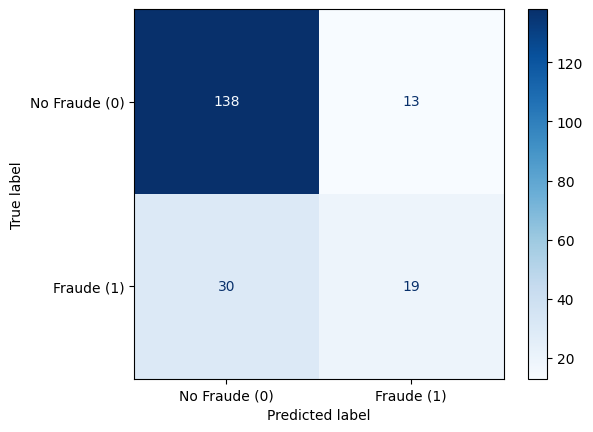

In [104]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

In [105]:
from sklearn.model_selection import LeaveOneOut
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = LogisticRegression()

# Inicializamos Leave-One-Out
loo = LeaveOneOut()

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación Leave-One-Out
for train_index, test_index in loo.split(X):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.append(modelo.predict(X_test)[0])
    y_true.append(y_test.iloc[0])

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.82      0.91      0.86       753
           1       0.59      0.40      0.48       247

    accuracy                           0.78      1000
   macro avg       0.70      0.65      0.67      1000
weighted avg       0.76      0.78      0.77      1000

Matriz de confusión:
 [[683  70]
 [148  99]]
True Negatives (TN): 683
False Positives (FP): 70
False Negatives (FN): 148
True Positives (TP): 99


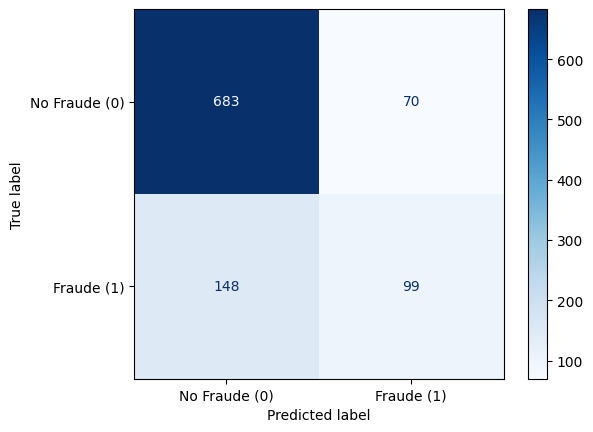

In [106]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### K-fold Cross-validation estratificado con k=5

In [107]:
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = LogisticRegression()

# Inicializamos StratifiedKFold con k=5
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación cruzada K-Fold estratificada
for train_index, test_index in kf.split(X, y):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.extend(modelo.predict(X_test))
    y_true.extend(y_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.82      0.91      0.86       753
           1       0.58      0.38      0.46       247

    accuracy                           0.78      1000
   macro avg       0.70      0.64      0.66      1000
weighted avg       0.76      0.78      0.76      1000

Matriz de confusión:
 [[684  69]
 [153  94]]
True Negatives (TN): 684
False Positives (FP): 69
False Negatives (FN): 153
True Positives (TP): 94


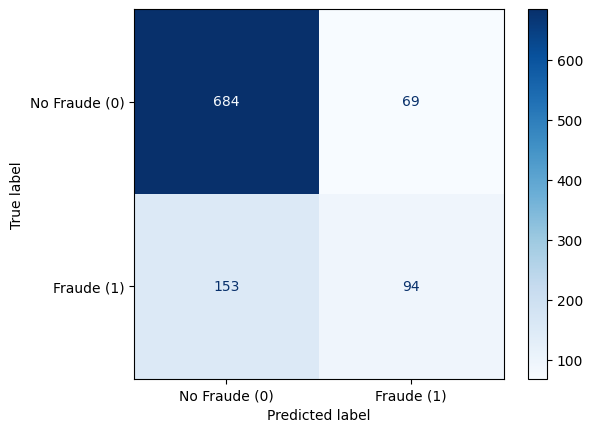

In [108]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

#### Conjunto de datos balanceado

##### Validacion simple (80% entranamiento y 20% prueba)

In [109]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creamos el modelo de regresión logística
#modelo = LogisticRegression()
modelo = LogisticRegression(class_weight="balanced")
#modelo

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.86      0.72      0.79       145
           1       0.49      0.69      0.57        55

    accuracy                           0.71       200
   macro avg       0.67      0.71      0.68       200
weighted avg       0.76      0.71      0.73       200

Matriz de confusión:
 [[105  40]
 [ 17  38]]
True Negatives (TN): 105
False Positives (FP): 40
False Negatives (FN): 17
True Positives (TP): 38


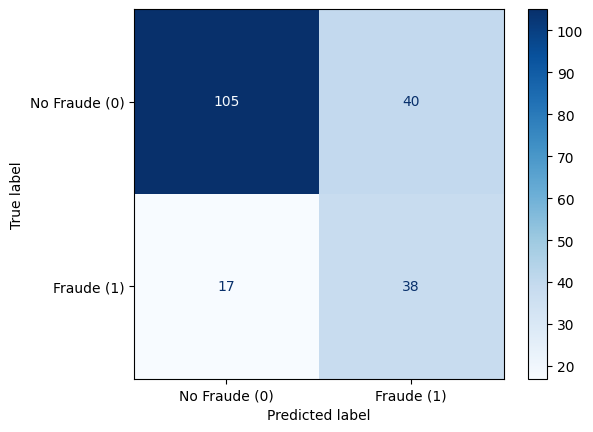

In [110]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [111]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Creamos el modelo de regresión logística
modelo = LogisticRegression(class_weight="balanced")

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.93      0.68      0.79       151
           1       0.46      0.84      0.59        49

    accuracy                           0.72       200
   macro avg       0.69      0.76      0.69       200
weighted avg       0.81      0.72      0.74       200

Matriz de confusión:
 [[103  48]
 [  8  41]]
True Negatives (TN): 103
False Positives (FP): 48
False Negatives (FN): 8
True Positives (TP): 41


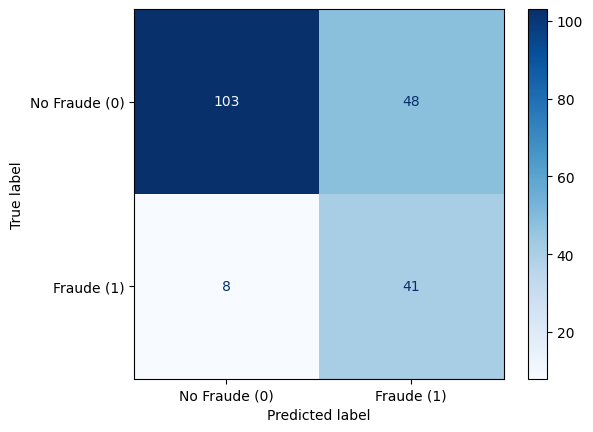

In [112]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

In [113]:
from sklearn.model_selection import LeaveOneOut
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = LogisticRegression(class_weight="balanced")

# Inicializamos Leave-One-Out
loo = LeaveOneOut()

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación Leave-One-Out
for train_index, test_index in loo.split(X):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.append(modelo.predict(X_test)[0])
    y_true.append(y_test.iloc[0])

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.89      0.71      0.79       753
           1       0.46      0.74      0.57       247

    accuracy                           0.72      1000
   macro avg       0.68      0.73      0.68      1000
weighted avg       0.79      0.72      0.74      1000

Matriz de confusión:
 [[538 215]
 [ 64 183]]
True Negatives (TN): 538
False Positives (FP): 215
False Negatives (FN): 64
True Positives (TP): 183


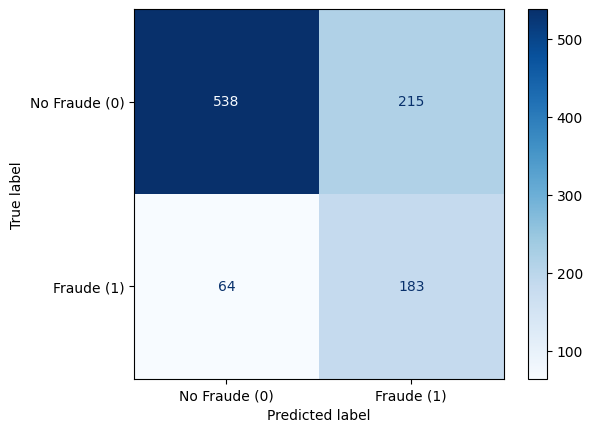

In [114]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### K-fold Cross-validation estratificado con k=5

In [115]:
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = LogisticRegression(class_weight="balanced")

# Inicializamos StratifiedKFold con k=5
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación cruzada K-Fold estratificada
for train_index, test_index in kf.split(X, y):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.extend(modelo.predict(X_test))
    y_true.extend(y_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.89      0.72      0.80       753
           1       0.46      0.74      0.57       247

    accuracy                           0.72      1000
   macro avg       0.68      0.73      0.68      1000
weighted avg       0.79      0.72      0.74      1000

Matriz de confusión:
 [[542 211]
 [ 65 182]]
True Negatives (TN): 542
False Positives (FP): 211
False Negatives (FN): 65
True Positives (TP): 182


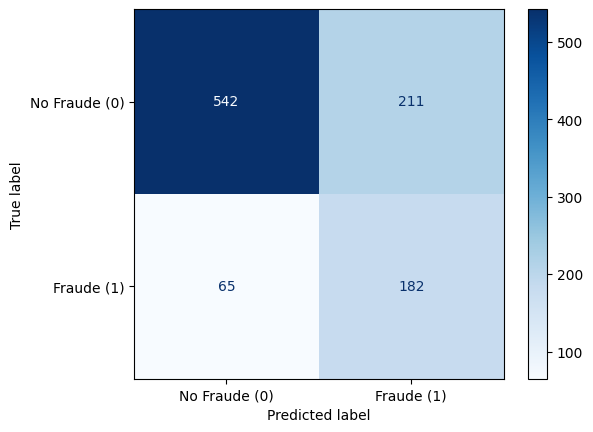

In [116]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

#### Conjunto de datos Subsampling (entrenamiento)

##### Validacion simple (80% entranamiento y 20% prueba)

In [117]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.under_sampling import NearMiss

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

us = NearMiss( sampling_strategy=0.5, n_neighbors=5, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = LogisticRegression()

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.82      0.84      0.83       145
           1       0.56      0.53      0.54        55

    accuracy                           0.76       200
   macro avg       0.69      0.68      0.69       200
weighted avg       0.75      0.76      0.75       200

Matriz de confusión:
 [[122  23]
 [ 26  29]]
True Negatives (TN): 122
False Positives (FP): 23
False Negatives (FN): 26
True Positives (TP): 29


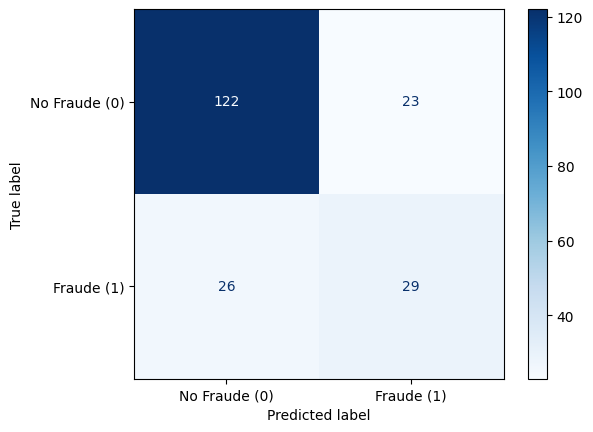

In [118]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [119]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

us = NearMiss( sampling_strategy=0.5, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = LogisticRegression()

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)


# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.87      0.86      0.87       151
           1       0.59      0.61      0.60        49

    accuracy                           0.80       200
   macro avg       0.73      0.74      0.73       200
weighted avg       0.80      0.80      0.80       200

Matriz de confusión:
 [[130  21]
 [ 19  30]]
True Negatives (TN): 130
False Positives (FP): 21
False Negatives (FN): 19
True Positives (TP): 30


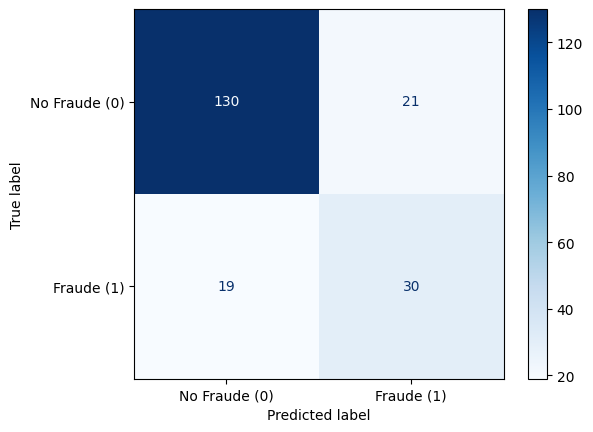

In [120]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

##### K-fold Cross-validation estratificado con k=5

##### **Comentarios:** En LOOCV y K-Fold estratificado, el modelo se entrena y valida múltiples veces con diferentes particiones del dataset. Gracias a la rotación de los datos y a la estratificación, el modelo tiene más oportunidades de aprender de la clase minoritaria en diferentes combinaciones. Por esta razón, no es necesario aplicar subsampling, ya que estas técnicas manejan el desequilibrio de clases de manera más natural, evitando además posibles sesgos por contaminación de datos entre los conjuntos de entrenamiento y validación.

#### Conjunto de datos Oversampling (entrenamiento)

##### Validacion simple (80% entranamiento y 20% prueba)

In [121]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

os =  RandomOverSampler(sampling_strategy=0.5,)
X_train_res, y_train_res = os.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = LogisticRegression()

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.83      0.84      0.84       145
           1       0.57      0.55      0.56        55

    accuracy                           0.76       200
   macro avg       0.70      0.69      0.70       200
weighted avg       0.76      0.76      0.76       200

Matriz de confusión:
 [[122  23]
 [ 25  30]]
True Negatives (TN): 122
False Positives (FP): 23
False Negatives (FN): 25
True Positives (TP): 30


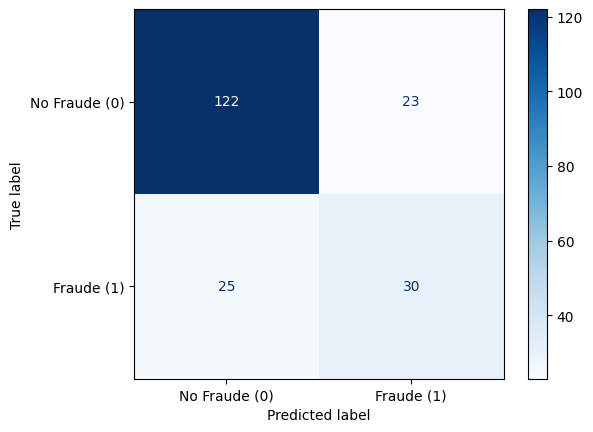

In [122]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [123]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

os =  RandomOverSampler(sampling_strategy=0.5,)
X_train_res, y_train_res = os.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = LogisticRegression()

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)


# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.87      0.86      0.87       151
           1       0.59      0.61      0.60        49

    accuracy                           0.80       200
   macro avg       0.73      0.74      0.73       200
weighted avg       0.80      0.80      0.80       200

Matriz de confusión:
 [[130  21]
 [ 19  30]]


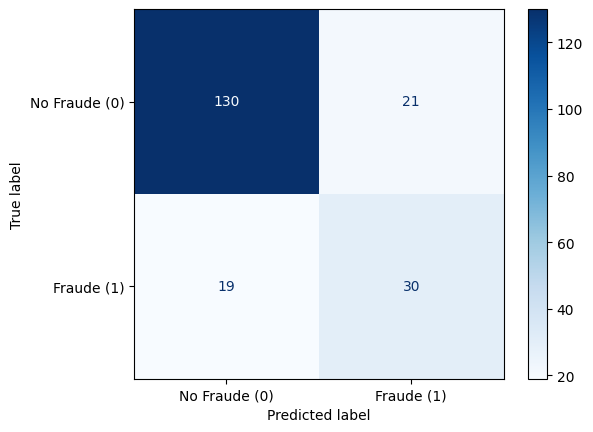

In [124]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

##### K-fold Cross-validation estratificado con k=5

##### **Comentarios:** En LOOCV y K-Fold estratificado, el modelo se entrena y valida múltiples veces con diferentes particiones del dataset. Gracias a la rotación de los datos y a la estratificación, el modelo tiene más oportunidades de aprender de la clase minoritaria en diferentes combinaciones. Por esta razón, no es necesario aplicar oversampling, ya que estas técnicas manejan el desequilibrio de clases de manera más natural, evitando además posibles sesgos por contaminación de datos entre los conjuntos de entrenamiento y validación.

#### Hypertunning a los mejores modelos de regresion

En este contexto:
- Un falso negativo ocurre cuando el modelo predice que una reclamación no es fraude (0) cuando en realidad sí lo es (1), lo cual implica que el fraude pasa desapercibido, lo que puede resultar en pérdidas financieras significativas para la aseguradora.

- Un falso positivo ocurre cuando el modelo predice que una reclamación es fraude (1) cuando en realidad no lo es (0), lo cual implica que clientes legítimos podrían ser tratados injustamente, lo que puede dañar la confianza y la experiencia del cliente.

Se va a tratar de mejorar los falsos negativos, ya que las pérdidas financieras por un fraude no detectado son muy altas, lo cual la maetrica que evalua eso es Recall la cual mide cuántos de los casos realmente fraudulentos fueron correctamente identificados por el modelo.

| Modelo      | Conjunto | tipo de validación | Recall |
|-------------|------------|--------|--------|
| Regresión Logística | Datos base | LOOCV | 0.40 |
| **Regresión Logística** | **Datos balanceados** | **Estratificado** | **0.84** |
| Regresión Logística | Datos Subsampling | Estratificado | 0.61 |
| Regresión Logística | Datos Oversampling | Estratificado | 0.63 |

In [125]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Creamos el modelo de regresión logística
modelo = LogisticRegression(class_weight="balanced")

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.93      0.68      0.79       151
           1       0.46      0.84      0.59        49

    accuracy                           0.72       200
   macro avg       0.69      0.76      0.69       200
weighted avg       0.81      0.72      0.74       200

Matriz de confusión:
 [[103  48]
 [  8  41]]
True Negatives (TN): 103
False Positives (FP): 48
False Negatives (FN): 8
True Positives (TP): 41


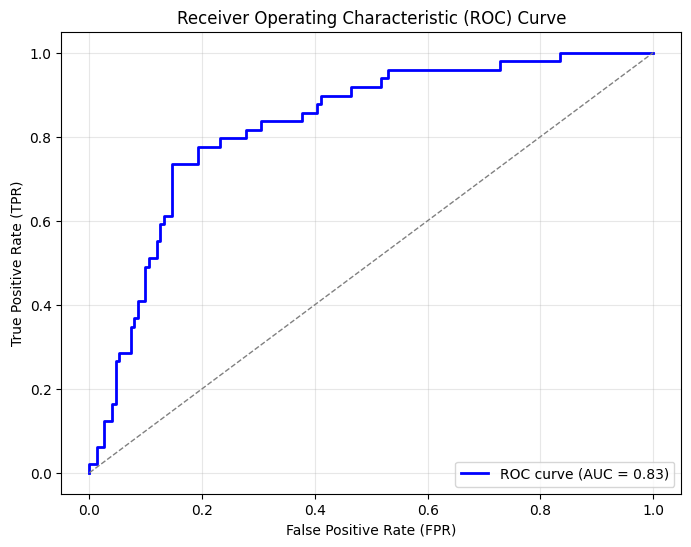

In [126]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Probabilidades predichas para la clase positiva
y_prob = modelo.predict_proba(X_test)[:, 1]

# Calcular los valores de la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob, pos_label=1)  # Asegúrate de que 'Y' sea la etiqueta positiva
roc_auc = auc(fpr, tpr)

# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()


In [127]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definimos los hiperparámetros para el grid search
parametros = {
    'penalty': ['l1', 'l2'],  # Tipos de regularización
    'tol': [1e-4, 1e-3, 1e-2],  # Tolerancia para la convergencia
    'C': [0.01, 0.1, 1, 10, 100],  # Regularización inversa
    'fit_intercept': [True, False],  # Si incluye el término independiente
    'solver': ['liblinear', 'saga'],  # Solvers compatibles con 'l1' y 'l2'
    'max_iter': [100, 200, 500, 1000],  # Iteraciones máximas
    'class_weight': ['balanced'],  # Manejo del desbalance de clases
    'warm_start': [False, True],

}

# Configuramos el GridSearchCV
grid_search = GridSearchCV(estimator=LogisticRegression(), param_grid=parametros, scoring='recall', cv=5, verbose=1, n_jobs=-1)

# Ajustamos el modelo con el conjunto de entrenamiento
grid_search.fit(X_train, y_train)

# Obtenemos los mejores parámetros y el mejor modelo
mejores_parametros = grid_search.best_params_
mejor_modelo = grid_search.best_estimator_

print("Mejores parámetros encontrados:", mejores_parametros)

# Evaluamos el modelo con los mejores parámetros
y_pred = mejor_modelo.predict(X_test)
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 960 candidates, totalling 4800 fits
Mejores parámetros encontrados: {'C': 0.01, 'class_weight': 'balanced', 'fit_intercept': True, 'max_iter': 200, 'penalty': 'l2', 'solver': 'saga', 'tol': 0.0001, 'warm_start': False}
Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.86      0.68      0.76       145
           1       0.45      0.71      0.55        55

    accuracy                           0.69       200
   macro avg       0.66      0.69      0.65       200
weighted avg       0.75      0.69      0.70       200

Matriz de confusión:
 [[98 47]
 [16 39]]


In [128]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Definimos los hiperparámetros para el grid search
parametros = {
    'penalty': ['elasticnet'],  # Tipo de regularización
    'tol': [1e-4, 1e-3, 1e-2],  # Tolerancia para la convergencia
    'C': [0.01, 0.1, 1, 10, 100],  # Regularización inversa
    'fit_intercept': [True, False],  # Si incluye el término independiente
    'solver': ['saga'],  # Solver compatible con 'elasticnet'
    'max_iter': [100, 200, 500, 1000],  # Iteraciones máximas
    'class_weight': ['balanced'],  # Manejo del desbalance de clases
    'warm_start': [False, True],  # Si reutiliza soluciones previas
    'l1_ratio': [0.1, 0.5, 0.9]  # Proporción de penalización L1/L2
}

# Configuramos el GridSearchCV
grid_search = GridSearchCV(estimator=LogisticRegression(), param_grid=parametros, scoring='recall', cv=5, verbose=1, n_jobs=-1)

# Ajustamos el modelo con el conjunto de entrenamiento
grid_search.fit(X_train, y_train)

# Obtenemos los mejores parámetros y el mejor modelo
mejores_parametros = grid_search.best_params_
mejor_modelo = grid_search.best_estimator_

print("Mejores parámetros encontrados:", mejores_parametros)

# Evaluamos el modelo con los mejores parámetros
y_pred = mejor_modelo.predict(X_test)
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

Fitting 5 folds for each of 720 candidates, totalling 3600 fits
Mejores parámetros encontrados: {'C': 0.01, 'class_weight': 'balanced', 'fit_intercept': True, 'l1_ratio': 0.1, 'max_iter': 100, 'penalty': 'elasticnet', 'solver': 'saga', 'tol': 0.0001, 'warm_start': False}
Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.85      0.70      0.77       145
           1       0.46      0.67      0.54        55

    accuracy                           0.69       200
   macro avg       0.65      0.68      0.65       200
weighted avg       0.74      0.69      0.70       200

Matriz de confusión:
 [[101  44]
 [ 18  37]]


### Random Forest

#### Conjunto de datos base

##### Validacion simple (80% entranamiento y 20% prueba)

In [129]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix


#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.81      0.87      0.84       145
           1       0.58      0.47      0.52        55

    accuracy                           0.76       200
   macro avg       0.70      0.67      0.68       200
weighted avg       0.75      0.76      0.75       200

Matriz de confusión:
 [[126  19]
 [ 29  26]]
True Negatives (TN): 126
False Positives (FP): 19
False Negatives (FN): 29
True Positives (TP): 26


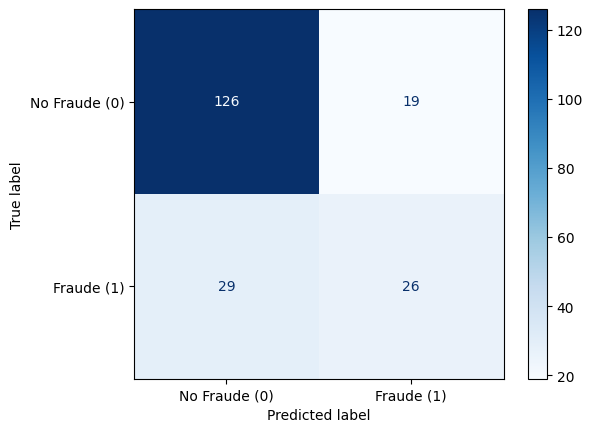

In [130]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")


##### Estratificado

In [131]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.86      0.87      0.86       151
           1       0.57      0.55      0.56        49

    accuracy                           0.79       200
   macro avg       0.72      0.71      0.71       200
weighted avg       0.79      0.79      0.79       200

Matriz de confusión:
 [[131  20]
 [ 22  27]]
True Negatives (TN): 131
False Positives (FP): 20
False Negatives (FN): 22
True Positives (TP): 27


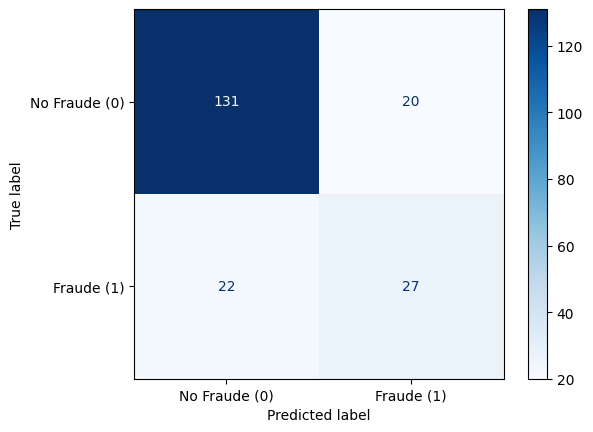

In [132]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

In [133]:
from sklearn.model_selection import LeaveOneOut
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Inicializamos Leave-One-Out
loo = LeaveOneOut()

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación Leave-One-Out
for train_index, test_index in loo.split(X):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.append(modelo.predict(X_test)[0])
    y_true.append(y_test.iloc[0])

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.84      0.89      0.87       753
           1       0.60      0.50      0.55       247

    accuracy                           0.79      1000
   macro avg       0.72      0.70      0.71      1000
weighted avg       0.78      0.79      0.79      1000

Matriz de confusión:
 [[670  83]
 [123 124]]
True Negatives (TN): 670
False Positives (FP): 83
False Negatives (FN): 123
True Positives (TP): 124


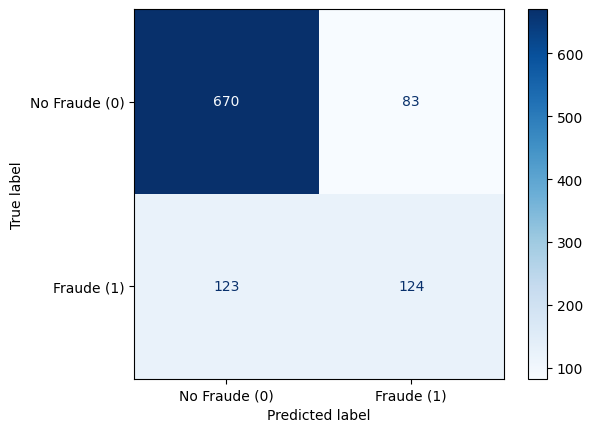

In [134]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### K-fold Cross-validation estratificado con k=5

In [135]:
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Inicializamos StratifiedKFold con k=5
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación cruzada K-Fold estratificada
for train_index, test_index in kf.split(X, y):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.extend(modelo.predict(X_test))
    y_true.extend(y_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.83      0.90      0.86       753
           1       0.60      0.44      0.51       247

    accuracy                           0.79      1000
   macro avg       0.71      0.67      0.69      1000
weighted avg       0.77      0.79      0.78      1000

Matriz de confusión:
 [[679  74]
 [138 109]]
True Negatives (TN): 679
False Positives (FP): 74
False Negatives (FN): 138
True Positives (TP): 109


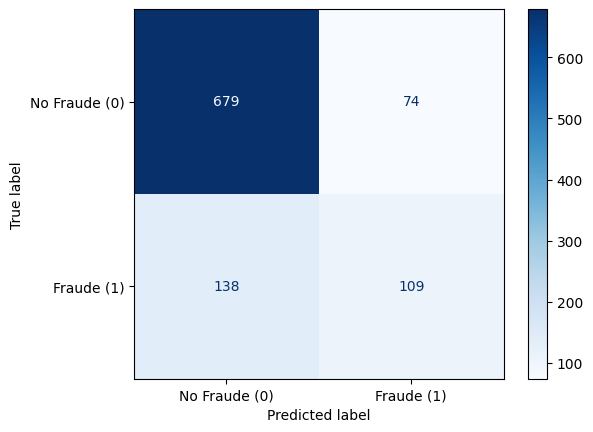

In [136]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

#### Conjunto de datos balanceado

##### Validacion simple (80% entranamiento y 20% prueba)

In [137]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42, class_weight="balanced")


# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.81      0.90      0.85       145
           1       0.63      0.44      0.52        55

    accuracy                           0.78       200
   macro avg       0.72      0.67      0.68       200
weighted avg       0.76      0.78      0.76       200

Matriz de confusión:
 [[131  14]
 [ 31  24]]
True Negatives (TN): 131
False Positives (FP): 14
False Negatives (FN): 31
True Positives (TP): 24


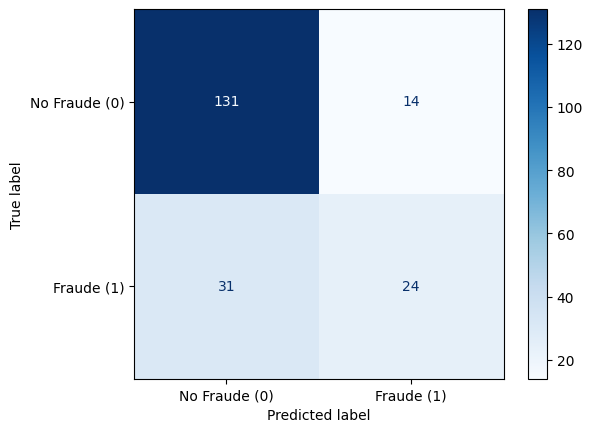

In [138]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [139]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42, class_weight="balanced")

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.83      0.89      0.86       151
           1       0.58      0.45      0.51        49

    accuracy                           0.79       200
   macro avg       0.71      0.67      0.68       200
weighted avg       0.77      0.79      0.78       200

Matriz de confusión:
 [[135  16]
 [ 27  22]]
True Negatives (TN): 135
False Positives (FP): 16
False Negatives (FN): 27
True Positives (TP): 22


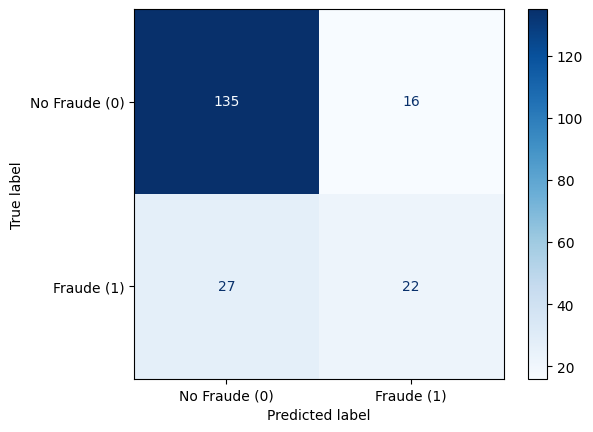

In [140]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

In [141]:
from sklearn.model_selection import LeaveOneOut
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42, class_weight='balanced')

# Inicializamos Leave-One-Out
loo = LeaveOneOut()

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación Leave-One-Out
for train_index, test_index in loo.split(X):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.append(modelo.predict(X_test)[0])
    y_true.append(y_test.iloc[0])

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.82      0.92      0.87       753
           1       0.62      0.40      0.49       247

    accuracy                           0.79      1000
   macro avg       0.72      0.66      0.68      1000
weighted avg       0.77      0.79      0.78      1000

Matriz de confusión:
 [[692  61]
 [147 100]]
True Negatives (TN): 692
False Positives (FP): 61
False Negatives (FN): 147
True Positives (TP): 100


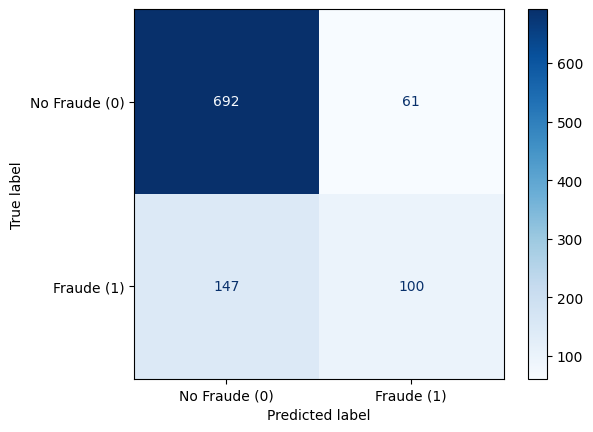

In [142]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### K-fold Cross-validation estratificado con k=5

In [143]:
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42, class_weight="balanced")

# Inicializamos StratifiedKFold con k=5
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación cruzada K-Fold estratificada
for train_index, test_index in kf.split(X, y):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.extend(modelo.predict(X_test))
    y_true.extend(y_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.82      0.92      0.87       753
           1       0.62      0.40      0.48       247

    accuracy                           0.79      1000
   macro avg       0.72      0.66      0.68      1000
weighted avg       0.77      0.79      0.77      1000

Matriz de confusión:
 [[693  60]
 [149  98]]
True Negatives (TN): 693
False Positives (FP): 60
False Negatives (FN): 149
True Positives (TP): 98


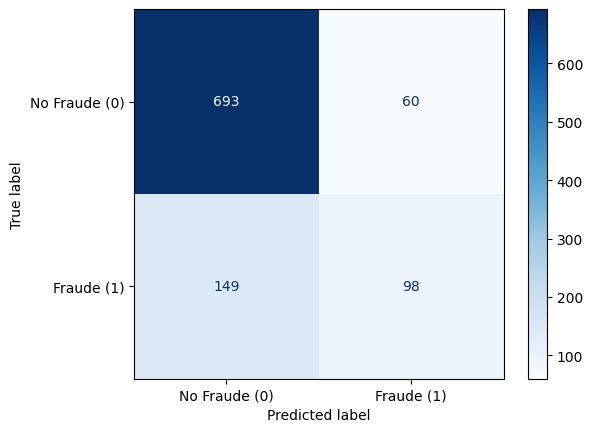

In [144]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

#### Conjunto de datos Subsampling (entrenamiento)

##### Validacion simple (80% entranamiento y 20% prueba)

In [145]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.under_sampling import NearMiss

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

us = NearMiss( sampling_strategy=0.5, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.89      0.77      0.82       145
           1       0.55      0.75      0.63        55

    accuracy                           0.76       200
   macro avg       0.72      0.76      0.73       200
weighted avg       0.79      0.76      0.77       200

Matriz de confusión:
 [[111  34]
 [ 14  41]]
True Negatives (TN): 111
False Positives (FP): 34
False Negatives (FN): 14
True Positives (TP): 41


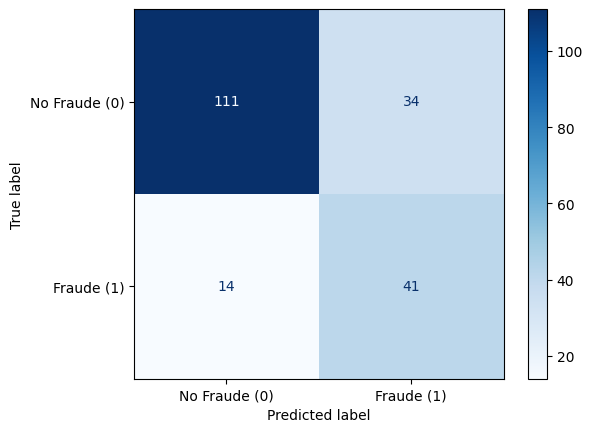

In [146]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [147]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

us = NearMiss( sampling_strategy=0.5, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)


# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.88      0.66      0.75       151
           1       0.41      0.73      0.53        49

    accuracy                           0.68       200
   macro avg       0.65      0.70      0.64       200
weighted avg       0.77      0.68      0.70       200

Matriz de confusión:
 [[99 52]
 [13 36]]
True Negatives (TN): 99
False Positives (FP): 52
False Negatives (FN): 13
True Positives (TP): 36


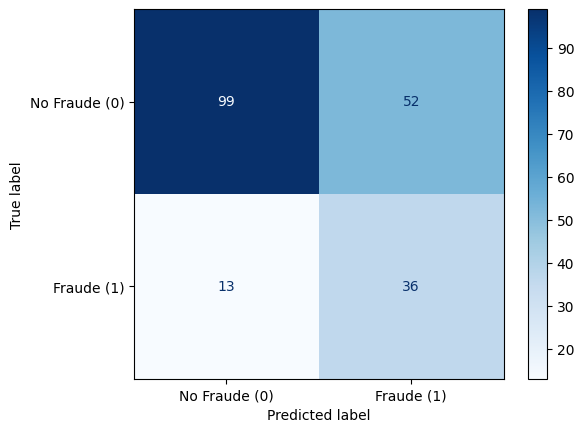

In [148]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

##### K-fold Cross-validation estratificado con k=5

##### **Comentarios:** En LOOCV y K-Fold estratificado, el modelo se entrena y valida múltiples veces con diferentes particiones del dataset. Gracias a la rotación de los datos y a la estratificación, el modelo tiene más oportunidades de aprender de la clase minoritaria en diferentes combinaciones. Por esta razón, no es necesario aplicar subsampling, ya que estas técnicas manejan el desequilibrio de clases de manera más natural, evitando además posibles sesgos por contaminación de datos entre los conjuntos de entrenamiento y validación.

#### Conjunto de datos Oversampling (entrenamiento)

##### Validacion simple (80% entranamiento y 20% prueba)

In [149]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

os =  RandomOverSampler(sampling_strategy=0.5,)
X_train_res, y_train_res = os.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.82      0.86      0.84       145
           1       0.57      0.49      0.53        55

    accuracy                           0.76       200
   macro avg       0.70      0.68      0.68       200
weighted avg       0.75      0.76      0.75       200

Matriz de confusión:
 [[125  20]
 [ 28  27]]
True Negatives (TN): 125
False Positives (FP): 20
False Negatives (FN): 28
True Positives (TP): 27


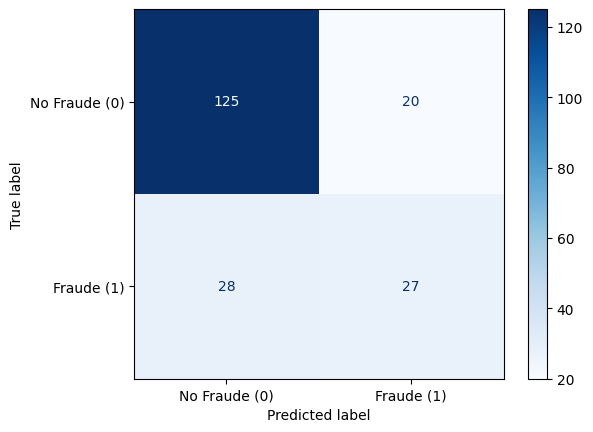

In [150]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [151]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

os =  RandomOverSampler(sampling_strategy=0.5,)
X_train_res, y_train_res = os.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)


# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.87      0.89      0.88       151
           1       0.64      0.57      0.60        49

    accuracy                           0.81       200
   macro avg       0.75      0.73      0.74       200
weighted avg       0.81      0.81      0.81       200

Matriz de confusión:
 [[135  16]
 [ 21  28]]


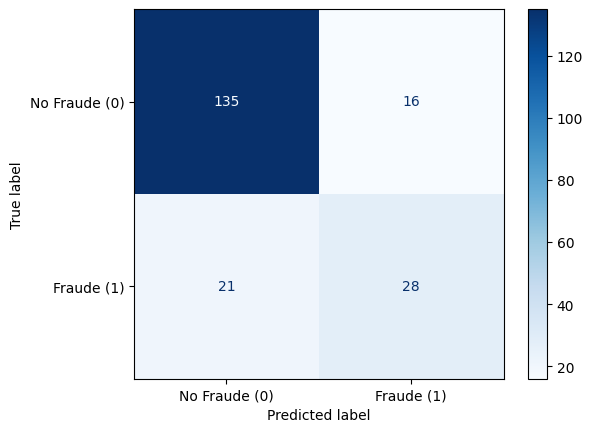

In [152]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

##### K-fold Cross-validation estratificado con k=5

##### **Comentarios:** En LOOCV y K-Fold estratificado, el modelo se entrena y valida múltiples veces con diferentes particiones del dataset. Gracias a la rotación de los datos y a la estratificación, el modelo tiene más oportunidades de aprender de la clase minoritaria en diferentes combinaciones. Por esta razón, no es necesario aplicar oversampling, ya que estas técnicas manejan el desequilibrio de clases de manera más natural, evitando además posibles sesgos por contaminación de datos entre los conjuntos de entrenamiento y validación.

#### Hypertunning a los mejores modelos de regresion

En este contexto:
- Un falso negativo ocurre cuando el modelo predice que una reclamación no es fraude (0) cuando en realidad sí lo es (1), lo cual implica que el fraude pasa desapercibido, lo que puede resultar en pérdidas financieras significativas para la aseguradora.

- Un falso positivo ocurre cuando el modelo predice que una reclamación es fraude (1) cuando en realidad no lo es (0), lo cual implica que clientes legítimos podrían ser tratados injustamente, lo que puede dañar la confianza y la experiencia del cliente.

Se va a tratar de mejorar los falsos negativos, ya que las pérdidas financieras por un fraude no detectado son muy altas, lo cual la maetrica que evalua eso es Recall la cual mide cuántos de los casos realmente fraudulentos fueron correctamente identificados por el modelo.

| Modelo      | Conjunto | tipo de validación | Recall |
|-------------|------------|--------|--------|
| Random Forest | Datos base | Estratificado | 0.55 |
| Random Forest | Datos balanceados | Estratificado| 0.47 |
| Random Forest | **Datos Subsampling** | **Simple** | **0.75** |
| Random Forest | Datos Oversampling | simple | 0.60 |

In [153]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.under_sampling import NearMiss

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

us = NearMiss( sampling_strategy=0.5, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = RandomForestClassifier(random_state=42)

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.89      0.77      0.82       145
           1       0.55      0.75      0.63        55

    accuracy                           0.76       200
   macro avg       0.72      0.76      0.73       200
weighted avg       0.79      0.76      0.77       200

Matriz de confusión:
 [[111  34]
 [ 14  41]]
True Negatives (TN): 111
False Positives (FP): 34
False Negatives (FN): 14
True Positives (TP): 41


In [154]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score
from sklearn.datasets import load_iris

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

us = NearMiss( sampling_strategy=0.5, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)


# Definir el modelo base
rf = RandomForestClassifier(random_state=42)

# Definir los hiperparámetros a buscar
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Configurar el GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, scoring='recall', verbose=2, n_jobs=-1)

# Ejecutar el Grid Search
grid_search.fit(X_train_res, y_train_res)

# Mostrar los mejores hiperparámetros encontrados
print("Mejores hiperparámetros:", grid_search.best_params_)

# Evaluar el modelo con los mejores hiperparámetros
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)
print("Accuracy en el conjunto de prueba:", accuracy_score(y_test, y_pred))

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Fitting 5 folds for each of 162 candidates, totalling 810 fits
Mejores hiperparámetros: {'bootstrap': False, 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
Accuracy en el conjunto de prueba: 0.74
Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.90      0.72      0.80       145
           1       0.52      0.78      0.62        55

    accuracy                           0.74       200
   macro avg       0.71      0.75      0.71       200
weighted avg       0.79      0.74      0.75       200

Matriz de confusión:
 [[105  40]
 [ 12  43]]
True Negatives (TN): 105
False Positives (FP): 40
False Negatives (FN): 12
True Positives (TP): 43


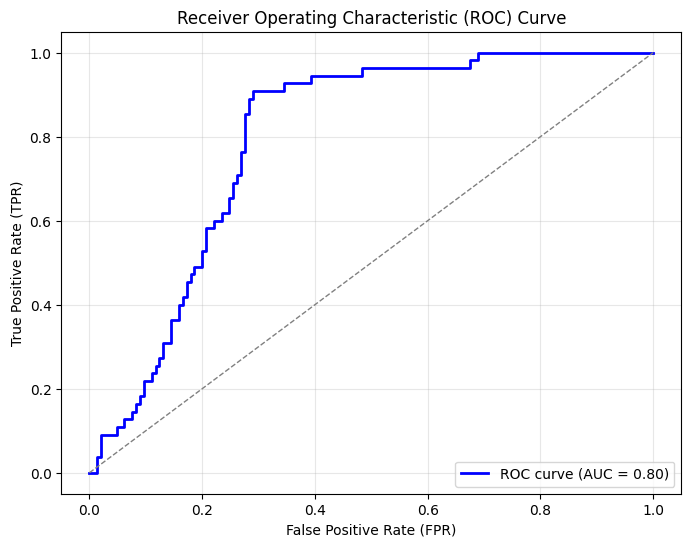

In [ ]:
# Probabilidades predichas para la clase positiva
y_prob = best_rf.predict_proba(X_test)[:, 1]

# Calcular los valores de la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_prob, pos_label=1)  # Asegúrate de que 'Y' sea la etiqueta positiva
roc_auc = auc(fpr, tpr)

# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=1)
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()


### SVM

#### Conjunto de datos base

##### Validacion simple (80% entranamiento y 20% prueba)

In [155]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creamos el modelo SVM
modelo = SVC(kernel='linear', random_state=42)

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.86      0.83      0.85       145
           1       0.59      0.65      0.62        55

    accuracy                           0.78       200
   macro avg       0.73      0.74      0.73       200
weighted avg       0.79      0.78      0.78       200

Matriz de confusión:
 [[120  25]
 [ 19  36]]
True Negatives (TN): 120
False Positives (FP): 25
False Negatives (FN): 19
True Positives (TP): 36


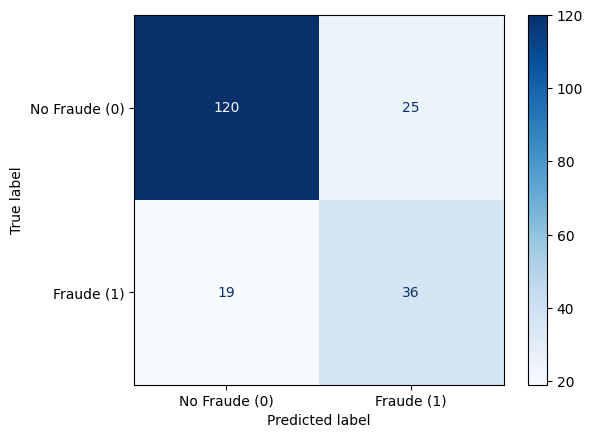

In [156]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")


##### Estratificado

In [157]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42)

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.76      1.00      0.86       151
           1       0.00      0.00      0.00        49

    accuracy                           0.76       200
   macro avg       0.38      0.50      0.43       200
weighted avg       0.57      0.76      0.65       200

Matriz de confusión:
 [[151   0]
 [ 49   0]]
True Negatives (TN): 151
False Positives (FP): 0
False Negatives (FN): 49
True Positives (TP): 0


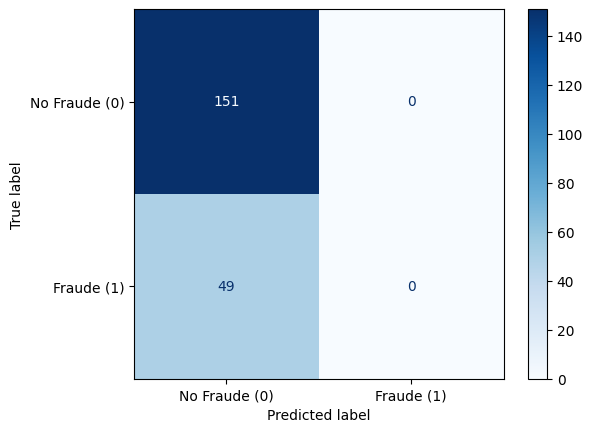

In [158]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

In [ ]:
from sklearn.model_selection import LeaveOneOut
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42)

# Inicializamos Leave-One-Out
loo = LeaveOneOut()

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación Leave-One-Out
for train_index, test_index in loo.split(X):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.append(modelo.predict(X_test)[0])
    y_true.append(y_test.iloc[0])

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### K-fold Cross-validation estratificado con k=5

In [160]:
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42)

# Inicializamos StratifiedKFold con k=5
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación cruzada K-Fold estratificada
for train_index, test_index in kf.split(X, y):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.extend(modelo.predict(X_test))
    y_true.extend(y_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.85      0.89      0.87       753
           1       0.60      0.51      0.55       247

    accuracy                           0.79      1000
   macro avg       0.72      0.70      0.71      1000
weighted avg       0.79      0.79      0.79      1000

Matriz de confusión:
 [[667  86]
 [120 127]]
True Negatives (TN): 667
False Positives (FP): 86
False Negatives (FN): 120
True Positives (TP): 127


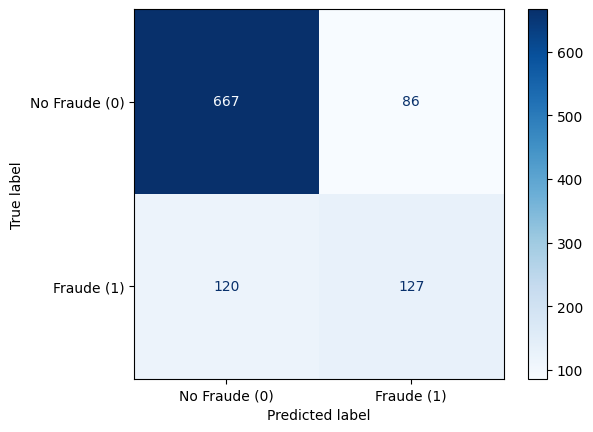

In [161]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

#### Conjunto de datos balanceado

##### Validacion simple (80% entranamiento y 20% prueba)

In [162]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42, class_weight="balanced")

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.87      0.79      0.83       145
           1       0.55      0.69      0.61        55

    accuracy                           0.76       200
   macro avg       0.71      0.74      0.72       200
weighted avg       0.78      0.76      0.77       200

Matriz de confusión:
 [[114  31]
 [ 17  38]]
True Negatives (TN): 114
False Positives (FP): 31
False Negatives (FN): 17
True Positives (TP): 38


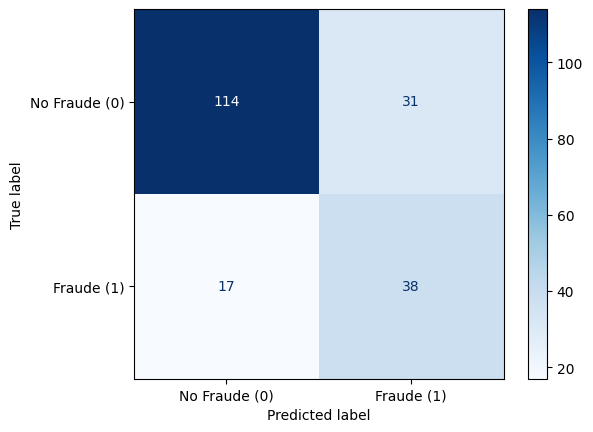

In [163]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [164]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42, class_weight="balanced")

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.92      0.73      0.81       151
           1       0.49      0.82      0.62        49

    accuracy                           0.75       200
   macro avg       0.71      0.77      0.72       200
weighted avg       0.82      0.75      0.77       200

Matriz de confusión:
 [[110  41]
 [  9  40]]
True Negatives (TN): 110
False Positives (FP): 41
False Negatives (FN): 9
True Positives (TP): 40


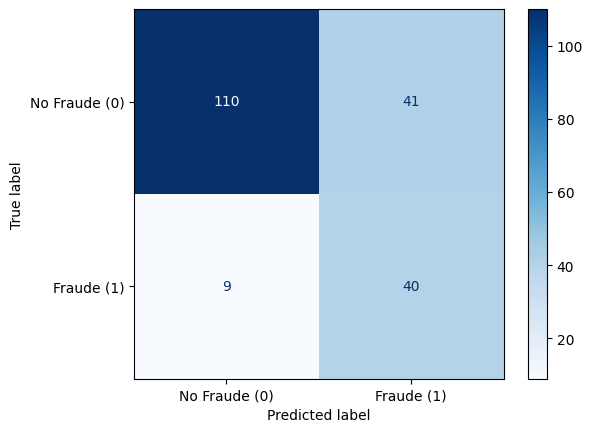

In [165]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

In [ ]:
from sklearn.model_selection import LeaveOneOut
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42, class_weight="balanced")

# Inicializamos Leave-One-Out
loo = LeaveOneOut()

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación Leave-One-Out
for train_index, test_index in loo.split(X):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.append(modelo.predict(X_test)[0])
    y_true.append(y_test.iloc[0])

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### K-fold Cross-validation estratificado con k=5

In [167]:
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42, class_weight="balanced")

# Inicializamos StratifiedKFold con k=5
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Variables para almacenar las predicciones y las etiquetas reales
y_true = []
y_pred = []

# Realizamos la validación cruzada K-Fold estratificada
for train_index, test_index in kf.split(X, y):
    # Dividimos los datos en conjunto de entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Entrenamos el modelo
    modelo.fit(X_train, y_train)

    # Realizamos la predicción
    y_pred.extend(modelo.predict(X_test))
    y_true.extend(y_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_true, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_true, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.89      0.75      0.82       753
           1       0.49      0.72      0.58       247

    accuracy                           0.75      1000
   macro avg       0.69      0.74      0.70      1000
weighted avg       0.79      0.75      0.76      1000

Matriz de confusión:
 [[567 186]
 [ 68 179]]
True Negatives (TN): 567
False Positives (FP): 186
False Negatives (FN): 68
True Positives (TP): 179


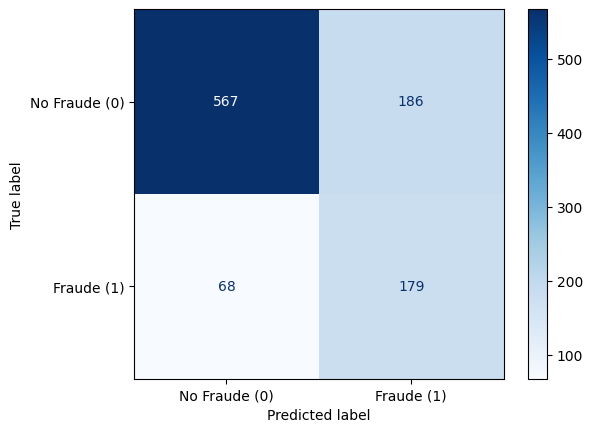

In [168]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_true, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

#### Conjunto de datos Subsampling (entrenamiento)

##### Validacion simple (80% entranamiento y 20% prueba)

In [169]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.under_sampling import NearMiss

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

us = NearMiss( sampling_strategy=0.5, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42)

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.86      0.83      0.85       145
           1       0.59      0.65      0.62        55

    accuracy                           0.78       200
   macro avg       0.73      0.74      0.73       200
weighted avg       0.79      0.78      0.78       200

Matriz de confusión:
 [[120  25]
 [ 19  36]]
True Negatives (TN): 120
False Positives (FP): 25
False Negatives (FN): 19
True Positives (TP): 36


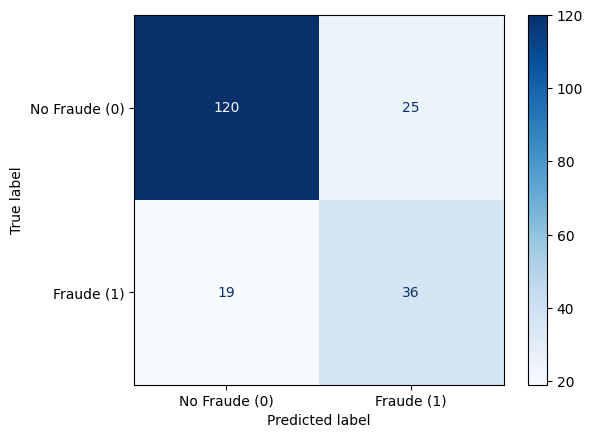

In [170]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [171]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

us = NearMiss( sampling_strategy=0.5, n_neighbors=3, version=2)
X_train_res, y_train_res = us.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42)

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)


# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.91      0.86      0.88       151
           1       0.63      0.73      0.68        49

    accuracy                           0.83       200
   macro avg       0.77      0.80      0.78       200
weighted avg       0.84      0.83      0.83       200

Matriz de confusión:
 [[130  21]
 [ 13  36]]
True Negatives (TN): 130
False Positives (FP): 21
False Negatives (FN): 13
True Positives (TP): 36


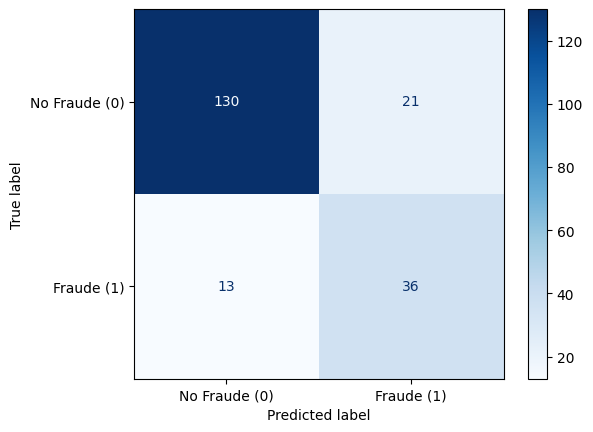

In [172]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

##### K-fold Cross-validation estratificado con k=5

##### **Comentarios:** En LOOCV y K-Fold estratificado, el modelo se entrena y valida múltiples veces con diferentes particiones del dataset. Gracias a la rotación de los datos y a la estratificación, el modelo tiene más oportunidades de aprender de la clase minoritaria en diferentes combinaciones. Por esta razón, no es necesario aplicar subsampling, ya que estas técnicas manejan el desequilibrio de clases de manera más natural, evitando además posibles sesgos por contaminación de datos entre los conjuntos de entrenamiento y validación.

#### Conjunto de datos Oversampling (entrenamiento)

##### Validacion simple (80% entranamiento y 20% prueba)

In [173]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

os =  RandomOverSampler(sampling_strategy=0.5,)
X_train_res, y_train_res = os.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42)

# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.86      0.83      0.85       145
           1       0.59      0.65      0.62        55

    accuracy                           0.78       200
   macro avg       0.73      0.74      0.73       200
weighted avg       0.79      0.78      0.78       200

Matriz de confusión:
 [[120  25]
 [ 19  36]]
True Negatives (TN): 120
False Positives (FP): 25
False Negatives (FN): 19
True Positives (TP): 36


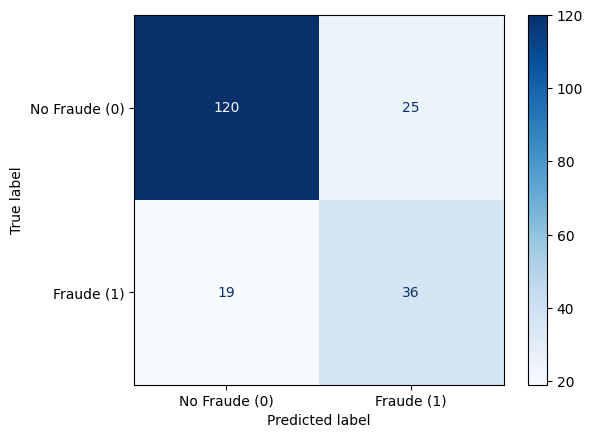

In [174]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### Estratificado

In [175]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

os =  RandomOverSampler(sampling_strategy=0.5,)
X_train_res, y_train_res = os.fit_resample(X_train, y_train)

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42)


# Entrenamos el modelo
modelo.fit(X_train_res, y_train_res)

# Realizamos predicciones
y_pred = modelo.predict(X_test)


# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.91      0.86      0.88       151
           1       0.63      0.73      0.68        49

    accuracy                           0.83       200
   macro avg       0.77      0.80      0.78       200
weighted avg       0.84      0.83      0.83       200

Matriz de confusión:
 [[130  21]
 [ 13  36]]


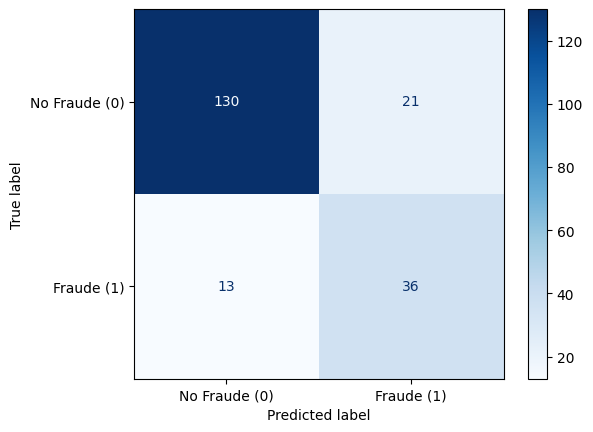

In [176]:
from sklearn.metrics import ConfusionMatrixDisplay

# Generar la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Visualizar la matriz con etiquetas
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Fraude (0)", "Fraude (1)"])
disp.plot(cmap="Blues")

##### LOOCV

##### K-fold Cross-validation estratificado con k=5

##### **Comentarios:** En LOOCV y K-Fold estratificado, el modelo se entrena y valida múltiples veces con diferentes particiones del dataset. Gracias a la rotación de los datos y a la estratificación, el modelo tiene más oportunidades de aprender de la clase minoritaria en diferentes combinaciones. Por esta razón, no es necesario aplicar oversampling, ya que estas técnicas manejan el desequilibrio de clases de manera más natural, evitando además posibles sesgos por contaminación de datos entre los conjuntos de entrenamiento y validación.

#### Hypertunning a los mejores modelos de regresion

En este contexto:
- Un falso negativo ocurre cuando el modelo predice que una reclamación no es fraude (0) cuando en realidad sí lo es (1), lo cual implica que el fraude pasa desapercibido, lo que puede resultar en pérdidas financieras significativas para la aseguradora.

- Un falso positivo ocurre cuando el modelo predice que una reclamación es fraude (1) cuando en realidad no lo es (0), lo cual implica que clientes legítimos podrían ser tratados injustamente, lo que puede dañar la confianza y la experiencia del cliente.

Se va a tratar de mejorar los falsos negativos, ya que las pérdidas financieras por un fraude no detectado son muy altas, lo cual la maetrica que evalua eso es Recall la cual mide cuántos de los casos realmente fraudulentos fueron correctamente identificados por el modelo.

| Modelo      | Conjunto | tipo de validación | Recall |
|-------------|------------|--------|--------|
| SVM | Datos base | Simple | 0.65 |
| SVM | **Datos balanceados** | **Estratificado** | **0.82** |
| SVM | Datos Subsampling | Estratificado |0.73 |
| SVM | Datos Oversampling | Estratificado | 0.73 |

In [177]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

#Definicion de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Creamos el modelo de regresión logística
modelo = SVC(kernel='linear', random_state=42, class_weight="balanced")

# Entrenamos el modelo
modelo.fit(X_train, y_train)

# Realizamos predicciones
y_pred = modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.92      0.73      0.81       151
           1       0.49      0.82      0.62        49

    accuracy                           0.75       200
   macro avg       0.71      0.77      0.72       200
weighted avg       0.82      0.75      0.77       200

Matriz de confusión:
 [[110  41]
 [  9  40]]
True Negatives (TN): 110
False Positives (FP): 41
False Negatives (FN): 9
True Positives (TP): 40


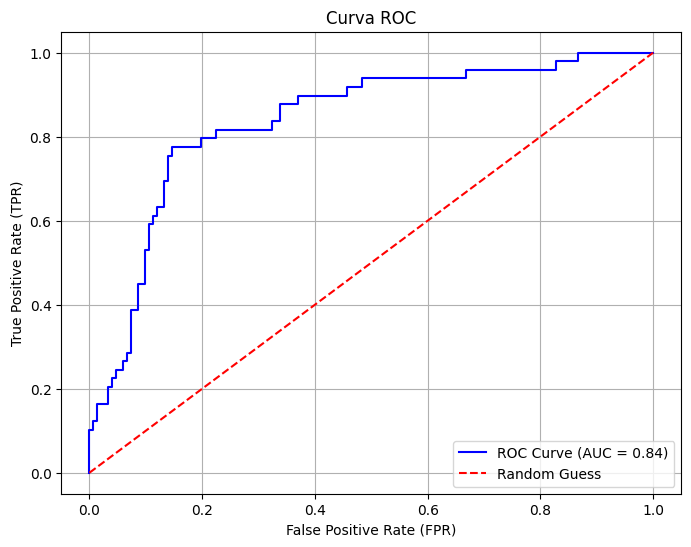

In [178]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Calculamos las probabilidades para la clase positiva
y_pred_prob = modelo.decision_function(X_test)

# Generamos las métricas para la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob, pos_label=1)  # Ajusta 'Y' según la etiqueta positiva en tu dataset
roc_auc = roc_auc_score(y_test, y_pred_prob)

# Graficamos la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid()
plt.show()


In [179]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Definimos el modelo base
modelo = SVC(random_state=42, class_weight="balanced")

# Definimos el grid de hiperparámetros
param_grid = {
    'kernel': [ 'rbf', 'sigmoid'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto']
}

# Configuramos el GridSearchCV
grid_search = GridSearchCV(
    estimator=modelo,
    param_grid=param_grid,
    scoring='recall',  # Métrica para optimizar
    cv=5,  # Número de folds para validación cruzada
    verbose=2,  # Nivel de detalle del proceso
    n_jobs=-1  # Paralelismo (usar todos los núcleos disponibles)
)

# Ejecutamos el Grid Search
grid_search.fit(X_train, y_train)

# Mostramos los mejores parámetros encontrados
print("Mejores parámetros encontrados:\n", grid_search.best_params_)

# Entrenamos el modelo con los mejores parámetros
mejor_modelo = grid_search.best_estimator_

# Realizamos predicciones
y_pred = mejor_modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Fitting 5 folds for each of 12 candidates, totalling 60 fits
Mejores parámetros encontrados:
 {'C': 10, 'gamma': 'auto', 'kernel': 'sigmoid'}
Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.40      0.01      0.03       151
           1       0.24      0.94      0.38        49

    accuracy                           0.24       200
   macro avg       0.32      0.48      0.20       200
weighted avg       0.36      0.24      0.11       200

Matriz de confusión:
 [[  2 149]
 [  3  46]]
True Negatives (TN): 2
False Positives (FP): 149
False Negatives (FN): 3
True Positives (TP): 46


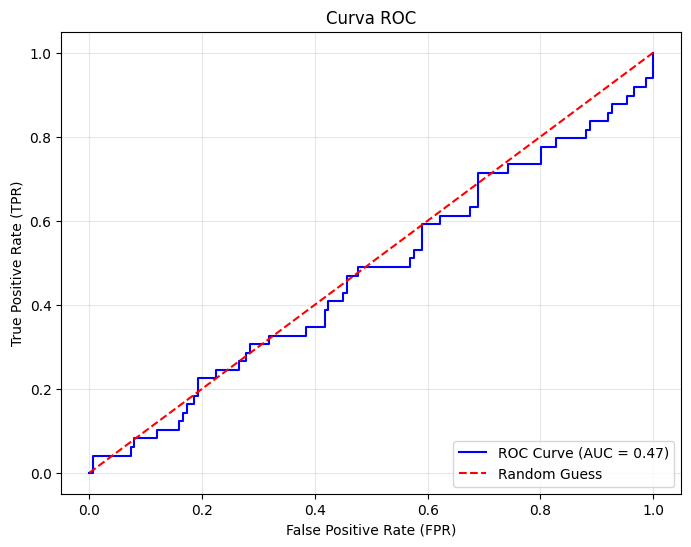

In [180]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Predecir las probabilidades de las clases positivas
# Para SVC con kernel lineal, utiliza `decision_function` en lugar de `predict_proba`
y_scores = mejor_modelo.decision_function(X_test)

# Calcular la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_scores, pos_label=1)  # Ajusta 'Y' según tu etiqueta positiva

# Calcular el área bajo la curva (AUC)
auc_score = roc_auc_score(y_test, y_scores)

# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.2f})', color='blue')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess', color='red')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()


In [181]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Definimos el modelo base
modelo = SVC(random_state=42, class_weight="balanced")

# Definimos el grid de hiperparámetros
param_grid = {
    'kernel': ['poly'],
    'C': [0.1, 1, 10],
    'gamma': ['scale', 'auto'],
    'degree': [2, 3, 4]
}

# Configuramos el GridSearchCV
grid_search = GridSearchCV(
    estimator=modelo,
    param_grid=param_grid,
    scoring='recall',  # Métrica para optimizar
    cv=5,  # Número de folds para validación cruzada
    verbose=2,  # Nivel de detalle del proceso
    n_jobs=-1  # Paralelismo (usar todos los núcleos disponibles)
)

# Ejecutamos el Grid Search
grid_search.fit(X_train, y_train)

# Mostramos los mejores parámetros encontrados
print("Mejores parámetros encontrados:\n", grid_search.best_params_)

# Entrenamos el modelo con los mejores parámetros
mejor_modelo = grid_search.best_estimator_

# Realizamos predicciones
y_pred = mejor_modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")


Fitting 5 folds for each of 18 candidates, totalling 90 fits
Mejores parámetros encontrados:
 {'C': 0.1, 'degree': 4, 'gamma': 'scale', 'kernel': 'poly'}
Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.89      0.33      0.48       151
           1       0.30      0.88      0.45        49

    accuracy                           0.47       200
   macro avg       0.60      0.60      0.46       200
weighted avg       0.75      0.47      0.47       200

Matriz de confusión:
 [[ 50 101]
 [  6  43]]
True Negatives (TN): 50
False Positives (FP): 101
False Negatives (FN): 6
True Positives (TP): 43


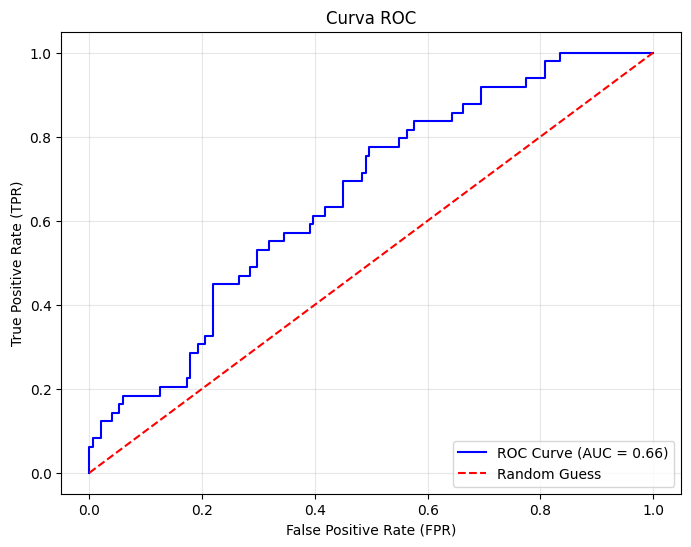

In [182]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Predecir las probabilidades de las clases positivas
# Para SVC con kernel lineal, utiliza `decision_function` en lugar de `predict_proba`
y_scores = mejor_modelo.decision_function(X_test)

# Calcular la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_scores, pos_label=1)  # Ajusta 'Y' según tu etiqueta positiva

# Calcular el área bajo la curva (AUC)
auc_score = roc_auc_score(y_test, y_scores)

# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.2f})', color='blue')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess', color='red')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()

In [183]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

# Definición de etiquetas
X = df_modelo_fraude_base.drop('fraud_reported', axis=1)
y = df_modelo_fraude_base['fraud_reported']

# Dividimos los datos en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Modelo base
modelo = SVC(kernel='linear', random_state=42, class_weight="balanced")

# Definir el grid de hiperparámetros
param_grid = {
    'C': [0.1, 1, 10, 100]  # Valores típicos para explorar
}

# Configurar el GridSearchCV
grid_search = GridSearchCV(
    estimator=modelo,
    param_grid=param_grid,
    scoring='recall',  # Optimizar la métrica de recall
    cv=5,  # Validación cruzada con 5 folds
    verbose=2,
    n_jobs=-1  # Usar todos los núcleos disponibles
)

# Ejecutamos el Grid Search
grid_search.fit(X_train, y_train)

# Mostramos los mejores parámetros encontrados
print("Mejores parámetros encontrados:\n", grid_search.best_params_)

# Entrenamos el modelo con los mejores parámetros
mejor_modelo = grid_search.best_estimator_

# Realizamos predicciones
y_pred = mejor_modelo.predict(X_test)

# Evaluamos el modelo
print("Reporte de clasificación:\n", classification_report(y_test, y_pred))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred))

# Generamos la matriz de confusión
cm = confusion_matrix(y_test, y_pred)

# Extraemos los valores de la matriz de confusión
TN, FP, FN, TP = cm.ravel()

# Imprimimos los valores
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")
print(f"True Positives (TP): {TP}")

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Mejores parámetros encontrados:
 {'C': 1}
Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.92      0.73      0.81       151
           1       0.49      0.82      0.62        49

    accuracy                           0.75       200
   macro avg       0.71      0.77      0.72       200
weighted avg       0.82      0.75      0.77       200

Matriz de confusión:
 [[110  41]
 [  9  40]]
True Negatives (TN): 110
False Positives (FP): 41
False Negatives (FN): 9
True Positives (TP): 40


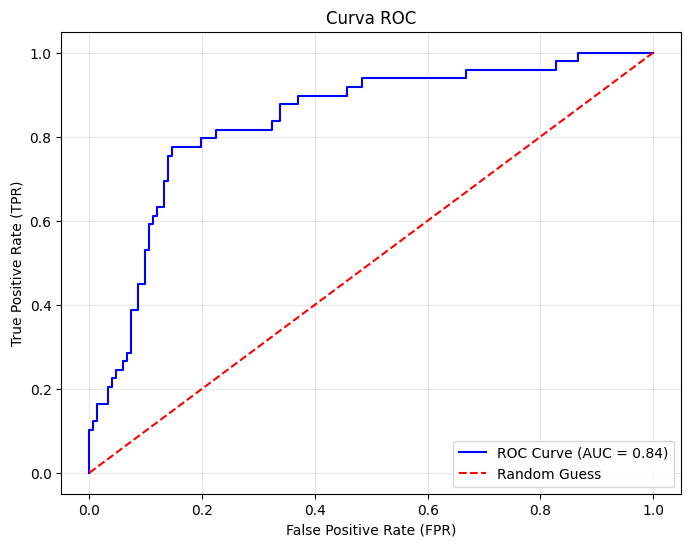

In [184]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Predecir las probabilidades de las clases positivas
# Para SVC con kernel lineal, utiliza `decision_function` en lugar de `predict_proba`
y_scores = mejor_modelo.decision_function(X_test)

# Calcular la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_scores, pos_label=1)  # Ajusta 'Y' según tu etiqueta positiva

# Calcular el área bajo la curva (AUC)
auc_score = roc_auc_score(y_test, y_scores)

# Graficar la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.2f})', color='blue')
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess', color='red')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()


---
## Conclusiones

Después de someter el conjunto de datos a un proceso de limpieza y transformación, que incluyó el análisis de valores faltantes y la eliminación de columnas que no aportaban información relevante, se llevó a cabo una selección de características analizando pruebas estadísticas como chi-cuadrada y ANOVA ademas de utilizar el modelo Random Forest. Este análisis consideró diferentes configuraciones de conjuntos basadas en el tipo de codificación de las variables (nominales y ordinales), lo que permitió identificar las características más significativas. Como resultado, se obtuvo:

['insured_education_level', 'insured_occupation', 'insured_hobbies',
       'incident_severity', 'incident_state', 'incident_city', 'auto_make',
       'auto_model', 'auto_year', 'months_as_customer', 'capital-gains',
       'capital-loss', 'incident_hour_of_the_day', 'total_claim_amount'],

Estas características resultaron fundamentales para la implementación de tres modelos de clasificación: regresión logística, máquinas de soporte vectorial (SVM) y Random Forest. Cada modelo fue evaluado utilizando diferentes conjuntos de datos diseñados para abordar el desbalanceo de clases de la variable objetivo. Además, se aplicaron diversas técnicas de validación, incluyendo validación simple, validación estratificada, LOOCV y K-Fold.

Los resultados de todos los modelos se compararon, poniendo especial énfasis en minimizar los falsos negativos, dado que las pérdidas financieras asociadas a fraudes no detectados son significativamente altas. En este contexto, la métrica de evaluación clave fue el Recall, que mide la proporción de casos realmente fraudulentos identificados correctamente por el modelo.

Los resultados finales son:

| Modelo      | Conjunto | tipo de validación | Recall | Macro avg |
|-------------|------------|--------|--------|--------|
| Random Forest | Datos subsampling | Simple | 0.78 | 0.71 |
| Regresion Logística | Datos balanceados | Estratificado | 0.84 | 0.69 |
| SVM | Datos balanceados| Estratificado |0.82 |0.72|
